## load dataset

In [2]:
import uproot

import matplotlib.pyplot as plt
import mplhep as hep
plt.style.use(hep.style.ROOT)
from BTVNanoCommissioning.utils.xs_scaler import collate
from BTVNanoCommissioning.utils.plot_utils import load_coffea
import numpy as np
from BTVNanoCommissioning.helpers.xsection import xsection
from matplotlib.offsetbox import AnchoredText
import matplotlib.pyplot as plt, mplhep as hep
%load_ext autoreload
%autoreload 2
from BTVNanoCommissioning.utils.plot_utils import (
    isin_dict,
    check_config,
    load_coffea,
    load_default,
    rebin_and_xlabel,
    plotratio,
    errband_opts,
    autoranger,
    rebin_hist
)
import numpy as np
sumw = {}
scales={}
lumi=59800#19500 #16800 # #19500  #16800 #19500 
collect_var={}

output=load_coffea({"input":"/nfs/dust/cms/user/milee/CoffeaRunner/coffea_output/coffea_nsv_0503/MC_nsv_UL18_arr_v00/*.coffea"},False)
# data=load_coffea({"input":"/nfs/dust/cms/user/milee/CoffeaRunner/data_nsv_preVFP_UL16_array_v00/*.coffea"},False)

signal=load_coffea({"input":["/nfs/dust/cms/user/milee/CoffeaRunner/coffea_output/coffea_nsv_0503/signal_nsv_UL18_array_v00/output_Hc.coffea"]},False)

output[list(signal.keys())[0]]=signal[list(signal.keys())[0]]
# output[list(signal_new.keys())[0]]=signal_new[list(signal_new.keys())[0]]
# data = load_coffea({"input":"coffea_output/coffea_nsv_0503/data_array_top_v00/*.coffea"},False)
# output2=load_coffea({"input":"MC_fixHLT_UL18_v00/*.coffea",'lumi':lumi},True)
# higgs_fixreco_v00

# higgs=load_coffea({"input":"coffea_output/coffea_nsv_0503/MC_higgs_array_top_v00/*.coffea"},False)
# for h in higgs.keys():output[h] = higgs[h]
# # sig=load_coffea({"input":"signal_unc_fixreco_UL_v00/*.coffea",'lumi':lumi},True)


## variables

In [46]:
import numpy as np
train_collect={
    'nj':["# Selected Jet",5,[1,6]],
    'njout':["# Selected Jet $|\\eta|>$2.4",6,[1,7]],
    'jetflav_btagDeepFlavCvL':["Jet1 CvL",45,[0.1,1]],
    'jetflav_btagDeepFlavCvB':["Jet1 CvB",26,[0.48,1]], 
    'jetflav2_btagDeepFlavCvL':["Jet2 CvL",45,[0.1,1]], 
    'jetflav2_btagDeepFlavCvB':["Jet2 CvB",26,[0.48,1]], 
    'h_pt':["Higgs $p_T$",50,[0,300]],
    'h_eta':["Higgs $\\eta$",50,[-2.5,2.5]], 
    'h_phi':["Higgs $\\phi$",30,[-np.pi,np.pi]], 
    'll_pt':["$\\ell\\ell p_T$",40,[20,300]], 
    'll_eta':["$\\ell\\ell \\eta$",50,[-2.5,2.5]],
    'll_phi':["$\\ell\ell \\phi$",30,[-np.pi,np.pi]], 
    'template_ll_mass':["$\\ell\\ell$ mass",34,[10,78]], 
     'll_mass':["$m_{\\ell\\ell}$",34,[10,78]], 
    'lep1_pt':["$\\ell_1 p_T$",40,[20,200]],
    'lep1_eta':["$\\ell_1\\eta$",50,[-2.5,2.5]], 
    'lep1_phi':["$\\ell_1 \\phi$",30,[-np.pi,np.pi]], 
    'lep2_pt':["$\\ell_2 p_T$",45,[10,100]],
    'lep2_eta':["$\\ell_2\\eta$",50,[-2.5,2.5]], 
    'lep2_phi':["$\\ell_2 \\phi$",30,[-np.pi,np.pi]], 
    'jetflav_pt':["Jet 1 $p_T$",48,[12,300]],
    'jetflav_eta':["Jet 1 $\\eta$",50,[-2.5,2.5]], 
    'jetflav_phi':["Jet 1 $\\phi$",30,[-np.pi,np.pi]], 
    'jetflav2_pt':["Jet 2 $p_T$",48,[12,300]],
    'jetflav2_eta':["Jet 2 $\\eta$",50,[-2.5,2.5]], 
    'jetflav2_phi':["Jet 2 $\\phi$",30,[-np.pi,np.pi]], 
    'mT1':["$m_{T}^{\\ell 1}$",50,[0,300]], 
    'mT2':["$m_{T}^{\\ell 2}$",40,[30,150]], 
    'mTh':["$m_{T}^{\\ell\\ell}$",40,[60,300]], 
    'nselsv':["# Selected SV",7,[0,7]], 
    'nsv':["# SV",15,[0,15]], 
#     'nj':['# Jets',]
    'npvs':["# Selected SV",42,[0,84]], 
    'MET_pt':["MET $p_T$",47,[18,300]],
    'MET_significance':["MET significance",50,[0,100]], 
    'MET_sumEt':["$\\Sigma$ MET $E_T$",40,[200,2000]], 
    'MET_phi':["MET $\\phi$",30,[-np.pi,np.pi]], 
    'MET_covYY':["$Cov_{YY}$",50,[0,2000]], 
    'MET_covXY':["$Cov_{XY}$",50,[-100,100]], 
    'MET_covXX':["$Cov_{XX}$",50,[0,2000]], 
    'llc_dr':["$\\Delta R(\\ell\\ell,c)$",50,[0,5]], 
    'lll1_dr':["$\\Delta R(\\ell\\ell,\\ell_1)$",40,[0,2]], 
    'lll2_dr':["$\\Delta R(\\ell\\ell,\\ell_2)$",40,[0,4]], 
    'l1met_dphi':["$\\Delta\\phi(\\ell_1,MET)$",30,[-np.pi,np.pi]], 
    'l2met_dphi':["$\\Delta\\phi(\\ell_2,MET)$",30,[-np.pi,np.pi]], 
    'cW1_dphi':["$\\Delta\\phi(\\ell_1+MET,c)$",30,[-np.pi,np.pi]], 
    'METTkMETdphi':["$\\Delta\\phi(MET,TkMET)$",30,[-0.5,0.5]]
}
trainvar_old=[
#             "ll_pt",
#             "lll1_dr",
#             "lll2_dr",
#             "llc_dr",
#             "lep1_pt",
#             "lep2_pt",
#             "template_ll_mass",
#             "MET_pt",
#             "jetflav_pt",
#             "l1met_dphi",
#             "l2met_dphi",
#             "cW1_dphi",
#             "mT1",
#             "mTh",
#             "mT2",
#             "jetflav_btagDeepFlavCvL",
#             "jetflav_btagDeepFlavCvB",
#             "nsv",
            "nj",
#             'template_BDT'
]

In [27]:
mergemap={
    
    
    'TT':['TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8', 'TTTo2L2Nu_TuneCP5_13TeV-powheg-pythia8'],
    'ST':['ST_t-channel_antitop_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8', 'ST_tW_antitop_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8', 'ST_t-channel_top_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8', 'ST_tW_top_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8', 'ST_s-channel_4f_leptonDecays_TuneCP5_13TeV-amcatnlo-pythia8'],

    "Z+jets":['DYJetsToLL_M-50_TuneCP5_13TeV-amcatnloFXFX-pythia8', 'DYJetsToLL_M-10to50_TuneCP5_13TeV-madgraphMLM-pythia8'],#, 'DYJetsToTauTauToMuTauh_M-50_TuneCP5_13TeV-madgraphMLM-pythia8'],
#     "Z+jets":['DYJetsToLL_M-10to50_TuneCP5_13TeV-madgraphMLM-pythia8'],#, 'DYJetsToTauTauToMuTauh_M-50_TuneCP5_13TeV-madgraphMLM-pythia8'],
    'VV':['WZ_TuneCP5_13TeV-pythia8', 'WW_TuneCP5_13TeV-pythia8', 'ZZ_TuneCP5_13TeV-pythia8'],
    "Higgs (WW+ZZ)":
    ['ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8', 'HZJ_HToWWTo2L2Nu_ZTo2L_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8', 'VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8', 'GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8', 'HWplusJ_HToWWTo2L2Nu_WTo2L_M-125_TuneCP5_13TeV-powheg-pythia8', 'GluGluZH_HToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-pythia8', 'HWminusJ_HToWW_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8','GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8', "GluGluToZH_HToZZTo4L_M125_TuneCP5_13TeV-jhugenv723-pythia8","VBF_HToZZTo4L_M125_TuneCP5_withDipoleRecoil_13TeV-powheg2-jhugenv7011-pythia8","WminusH_HToZZTo4L_M125_TuneCP5_13TeV_powheg2-minlo-HWJ_JHUGenV7011_pythia8","WplusH_HToZZTo4L_M125_TuneCP5_13TeV_powheg2-minlo-HWJ_JHUGenV7011_pythia8","bbH_HToZZTo4L_M125_TuneCP2_13TeV-jhugenv7011-pythia8","ttH_HToZZ_4LFilter_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8","tqH_HToZZTo4L_M125_TuneCP5_13TeV-jhugenv7011-pythia8","ZH_HToZZ_4LFilter_M125_TuneCP5_13TeV_powheg2-minlo-HZJ_JHUGenV7011_pythia8"],
    "H+c":["HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8"],
#     ['gchcWW2L2Nu_4f'],
#     "data":
#     ["MuonEGRun2016F-UL2016_MiniAODv2_NanoAODv9-v1","MuonEGRun2016G-UL2016_MiniAODv2_NanoAODv9-v1","MuonEGRun2016H-UL2016_MiniAODv2_NanoAODv9-v1"]
#     ["MuonEGRun2018A-UL2018_MiniAODv2_NanoAODv9-v1","MuonEGRun2018B-UL2018_MiniAODv2_NanoAODv9-v1","MuonEGRun2018C-UL2018_MiniAODv2_NanoAODv9-v1","MuonEGRun2018D-UL2018_MiniAODv2_NanoAODv9-v1"]
#     ["MuonEGRun2016B-ver1_HIPM_UL2016_MiniAODv2_NanoAODv9-v2", "MuonEGRun2016B-ver2_HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016C-HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016D-HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016E-HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016F-HIPM_UL2016_MiniAODv2_NanoAODv9-v2"]
#    [ "MuonEGRun2017B-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017C-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017D-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017F-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017E-UL2017_MiniAODv2_NanoAODv9-v1",]
}
import numpy as np
from scipy import stats
plt.style.use(hep.style.ROOT)

for d in data.keys():
    output[d] = data[d]
# print(output.keys(),data.keys())
collated = collate(output,mergemap)
axis={"lepflav":'emu','region':'SR2_LM','flav':sum}

trainvar_old=[
#             "ll_pt",
#             "lll1_dr",
#             "lll2_dr",
#             "llc_dr",
#             "lep1_pt",
#             "lep2_pt",
#             "template_ll_mass",
#             "MET_pt",
#             "jetflav_pt",
#             "l1met_dphi",
#             "l2met_dphi",
#             "cW1_dphi",
#             "mT1",
#             "mTh",
#             "mT2",
#             "jetflav_btagDeepFlavCvL",
#             "jetflav_btagDeepFlavCvB",
#             "nsv",
            "nj",
#             'template_BDT'
]

import hist
color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#CC503E","Higgs (ZZ)":"#e17c05","H+c":"#666666"}
texts={"SR_LM":'SR\nnJ>1',"SR2_LM":'SR\nnJ=1', 'top_CR_lowmT':'CR\ntop', 'SR_HM':'CR\n$m_{\\ell\\ell}>76GeV$'}
for reg in ["SR2_LM"]:#texts.keys():
    for i,datavar in enumerate(trainvar_old):
        if 'BDT' in datavar and 'top_CR' in reg:continue
        MChist={}
        axis={"lepflav":'emu','region':reg,'flav':sum}
        
        if 'template' in datavar:
#             datavar='template_ll_mass'
            axis['syst']='nominal'
            if 'BDT' in datavar:
                datavar=datavar+"_"+reg
#         fig, ((ax), (rax)) = plt.subplots(
#                     2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
#                 )
        fig,ax=plt.subplots()
#         fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
        hep.cms.label(
            "work in progress",
            data=True,
            lumi=lumi/ 1000.0,
            com="13",
            loc=0,
            ax=ax,
        )
        summc=None
  
        for s in collated.keys():
            if s == "data":continue
            if summc is None :summc=collated[s][datavar][axis]
            else:summc=summc+collated[s][datavar][axis]
#         print(datavar,"MC:",np.sum(summc.values()),"data:",np.sum(collated['data'][datavar][axis].values()))
        hep.histplot(
            [collated[s][datavar][axis]+collated[s][datavar][{"lepflav":'emu','region':'SR_LM','flav':sum}] for s in collated.keys() if 'data'!= s],
            stack=True,
            label=[s   for s in collated.keys() if 'data'!= s],
            histtype="fill",
            yerr=True,
            color=[ color_map[s]  for s in collated.keys() if 'data'!= s],
            ax=ax,
            flow=None
        )

        hep.histplot(
            (collated["H+c"][datavar][axis]+collated["H+c"][datavar][{"lepflav":'emu','region':'SR_LM','flav':sum}])*10000,
            label="H+c$\\times$10000",
            histtype="step",
            yerr=True,
            color=color_map["H+c"],
            lw=2,
            ax=ax,
            flow=None
        )
        hep.histplot(
            (collated["Higgs (WW+ZZ)"][datavar][axis]+collated["Higgs (WW+ZZ)"][datavar][{"lepflav":'emu','region':'SR_LM','flav':sum}])*100,
            label="Higgs$\\times$100",
            histtype="step",
            yerr=True,
            color=color_map["Higgs (WW+ZZ)"],
            lw=2,
            ax=ax,flow=None
        )
        
#             plotratio(collated["data"][datavar][axis], summc, ax=rax)
        if 'BDT' in datavar:
            npdata=collated['data'][datavar][axis].values()
            npdata[-10:]=np.nan
            hep.histplot(
                npdata,
                collated['data'][datavar][axis].axes[-1].edges,
                histtype="errorbar",
                color="black",
                label="Data",
                yerr=True,
                ax=ax,flow=None
            )
#             plotratio(npdata, summc, ax=rax,data_is_np=True)
        else:
            hep.histplot(
                collated['data'][datavar][axis]+collated['data'][datavar][{"lepflav":'emu','region':'SR_LM','flav':sum}],
                histtype="errorbar",
                color="black",
                label="Data",
                yerr=True,
                ax=ax,flow=None
            )
#             plotratio(collated["data"][datavar][axis], summc, ax=rax)

    #     print(collated["data"][datavar][axis])
        
#         rax.set_ylabel("Data/MC")
#         if 'template_BDT' in datavar:rax.set_xlabel("BDT")
#         else:rax.set_xlabel(train_collect[datavar][0])
#         rax.set_ylim(0.5, 1.5)
#         ax.set_xlabel(None)
        if 'template_BDT' in datavar:ax.set_xlabel("BDT")
        else:ax.set_xlabel(train_collect[datavar][0])
        xmin, xmax = autoranger(collated["data"][datavar][axis] + summc)
#         ax.set_xlim(xmin, xmax)
        pvaleu=stats.ks_2samp(collated['data'][datavar][axis].values(), summc.values()).pvalue
        print(pvaleu)
    #     text = "GoF p-value:\n"+str(round(pvaleu,2))
    #     if var in trainvar_old:text=text+"\n("
        text=texts[reg]
        ax.semilogy()
        ax.set_ylim(bottom=0.1)
        
        ax.set_xlim(1,6)
        ax.legend(ncols=2)
        
        at = AnchoredText("",  frameon=False,loc=2)
        ax.add_artist(at)

        hep.mpl_magic(ax=ax)
#         fig.savefig(f"plot/training_0413/UL2017/noratio_nj_SR.pdf")##{datavar}_{reg}.pdf")

ValueError: axes not mergable

## load pdf

In [3]:
for f in output.keys():
    for s in output[f].keys():   
        if s not in sumw.keys():sumw[s]=output[f][s]['sumw']
        else:sumw[s] += output[f][s]['sumw']
        if s not in collect_var.keys():collect_var[s]={}
        for r in output[f][s]['array'].keys():   
            if s not in collect_var.keys() or r not in collect_var[s].keys():collect_var[s][r]={}
            for c in ['emu']:
                varlist = list(output[f][s]['array'][r][c].keys())
                for var in varlist:
                    val=output[f][s]['array'][r][c][var].value
                    if var not in list(collect_var[s][r].keys()):collect_var[s][r][var]=val
                    else:collect_var[s][r][var]=np.concatenate((collect_var[s][r][var],val))

In [4]:
data_var={}
c='emu'
for f in data.keys():
    for s in data[f].keys():
        if s not in data_var.keys():data_var[s]={}
        for r in data[f][s]['array'].keys():
            if s not in data_var.keys() or r not in data_var[s].keys():data_var[s][r]={}
            varlist = list(data[f][s]['array'][r][c].keys())
            for var in varlist:
                if var not in data_var[s][r].keys():data_var[s][r][var]=data[f][s]['array'][r]['emu'][var].value
                else:data_var[s][r][var]=np.concatenate((data_var[s][r][var],data[f][s]['array'][r]['emu'][var].value))    
                    

NameError: name 'data' is not defined

In [6]:
xs_dict = {}
for obj in xsection:
    xs_dict[obj["process_name"]] = float(obj["cross_section"])
# for s in sumw.keys():
#     scales[s] = xs_dict[s]*lumi/sumw[s]
# #     print(s,sumw[s],xs_dict[s])
#     for r in collect_var[s].keys():
#         if 'weight' not in collect_var[s][r].keys():continue
#         collect_var[s][r]['mcwei']=np.full_like(collect_var[s][r]['weight'],scales[s])



In [7]:
mergemap={
#     "Higgs WW":['VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8', 'GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8''ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8', 'HZJ_HToWWTo2L2Nu_ZTo2L_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8', 'VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8', 'GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8', 'HWplusJ_HToWWTo2L2Nu_WTo2L_M-125_TuneCP5_13TeV-powheg-pythia8', 'GluGluZH_HToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-pythia8', 'HWminusJ_HToWW_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8'],
#     "Higgs ZZ":['ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8','GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8', "GluGluToZH_HToZZTo4L_M125_TuneCP5_13TeV-jhugenv723-pythia8","VBF_HToZZTo4L_M125_TuneCP5_withDipoleRecoil_13TeV-powheg2-jhugenv7011-pythia8","WminusH_HToZZTo4L_M125_TuneCP5_13TeV_powheg2-minlo-HWJ_JHUGenV7011_pythia8","WplusH_HToZZTo4L_M125_TuneCP5_13TeV_powheg2-minlo-HWJ_JHUGenV7011_pythia8","bbH_HToZZTo4L_M125_TuneCP2_13TeV-jhugenv7011-pythia8","ttH_HToZZ_4LFilter_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8","tqH_HToZZTo4L_M125_TuneCP5_13TeV-jhugenv7011-pythia8","ZH_HToZZ_4LFilter_M125_TuneCP5_13TeV_powheg2-minlo-HZJ_JHUGenV7011_pythia8"],
    
    "Bkg Higgs":["VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8","VBF_HToZZTo4L_M125_TuneCP5_withDipoleRecoil_13TeV-powheg2-jhugenv7011-pythia8","GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8","GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8","ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8","HZJ_HToWWTo2L2Nu_ZTo2L_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8","HWplusJ_HToWWTo2L2Nu_WTo2L_M-125_TuneCP5_13TeV-powheg-pythia8","GluGluZH_HToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-pythia8","HWminusJ_HToWW_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8"],
    # "ggH":["GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8"],
    # "Higgs (WW+ZZ)":["VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8","VBF_HToZZTo4L_M125_TuneCP5_withDipoleRecoil_13TeV-powheg2-jhugenv7011-pythia8_RunIISummer20UL16NanoAODAPVv9-106X_mcRun2_asymptotic_preVFP_v11-v1","GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8_RunIISummer20UL16NanoAODAPVv9-106X_mcRun2_asymptotic_preVFP_v11-v1","GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8","ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8","HZJ_HToWWTo2L2Nu_ZTo2L_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8","HWplusJ_HToWWTo2L2Nu_WTo2L_M-125_TuneCP5_13TeV-powheg-pythia8","GluGluZH_HToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-pythia8","HWminusJ_HToWW_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8"],
    '$t\bar{t}$':['TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8', 'TTTo2L2Nu_TuneCP5_13TeV-powheg-pythia8'],
    'Single Top':['ST_t-channel_antitop_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8', 'ST_tW_antitop_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8', 'ST_t-channel_top_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8', 'ST_tW_top_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8', 'ST_s-channel_4f_leptonDecays_TuneCP5_13TeV-amcatnlo-pythia8'],

    "Z+jets":['DYJetsToLL_M-50_TuneCP5_13TeV-amcatnloFXFX-pythia8', 'DYJetsToLL_M-10to50_TuneCP5_13TeV-madgraphMLM-pythia8' ,'DYJetsToTauTauToMuTauh_M-50_TuneCP5_13TeV-madgraphMLM-pythia8'],
    # "Z+jets":['DYJetsToLL_M-10to50_TuneCP5_13TeV-madgraphMLM-pythia8'],#, 'DYJetsToTauTauToMuTauh_M-50_TuneCP5_13TeV-madgraphMLM-pythia8'],
    'VV':['WZ_TuneCP5_13TeV-pythia8', 'WW_TuneCP5_13TeV-pythia8', 'ZZ_TuneCP5_13TeV-pythia8'],
    "H+c":["HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8"]
}

from Hpluscharm.MVA.training_config import config2017
trainvar=config2017["binary_higgs"]["varlist"]+['nselj']

In [8]:
trainvar

['ll_pt',
 'lll1_dr',
 'lll2_dr',
 'llc_dr',
 'lep1_pt',
 'lep2_pt',
 'll_mass',
 'MET_pt',
 'jetflav_pt',
 'l1met_dphi',
 'l2met_dphi',
 'cW1_dphi',
 'mT1',
 'mT2',
 'jetflav_btagDeepFlavCvL',
 'jetflav_btagDeepFlavCvB',
 'nsv',
 'nselj']

In [7]:
import functools

import xgboost as xgb

xgb_model = xgb.Booster()

xgb_model_LM = xgb.Booster()
xgb_model_old = xgb.Booster()
xgb_model_ggH,xgb_model_weihiggs=xgb.Booster(),xgb.Booster()
# xgb_model3 = xgb.Booster()
# xgb_model3.load_model("src/Hpluscharm/MVA/0413_binary_LM_newvar_UL17_nofocal.json")
# xgb_model2.load_model("src/Hpluscharm/MVA/tune_binary_LM_UL17_mult3class_nofocal.json")
# xgb_model.load_model("src/Hpluscharm/MVA/0413_norescale_binary_LM_nsv_UL17_nofocal.json")
# xgb_model.load_model("src/Hpluscharm/MVA/xgb_output/None_binary_LM_nsv_UL17_nofocal.json")
# xgb_model_LM.load_model("src/Hpluscharm/MVA/None_binary_bkg_UL17_nofocal.json")
xgb_model.load_model("src/Hpluscharm/MVA/None_binary_bkg_UL18_nofocal.json")
# xgb_model_ggH.load_model("src/Hpluscharm/MVA/Non__doc__e_binary_ggH_UL17_nofocal.json")

xgb_model_old.load_model("src/Hpluscharm/MVA/None_binary_higgs_UL18_nofocal.json")
# xgb_model_LM.load_model("src/Hpluscharm/MVA/normal_binary_LM_UL17_nofocal.json")
# xgb_model_old.load_model("src/Hpluscharm/MVA/xgb_output/SR_emu_scangamma_2017_gamma2.json")


# trainingvar_LM= config2017["binary_LM_"]["varlist"]
# trainingvar_old= config2017["old"]["varlist"]

In [5]:
from Hpluscharm.MVA.training_config import config2017  
trainvar= config2017["binary_higgs"]["varlist"]
for f in output.keys():
        for s in output[f].keys():   
            if s not in sumw.keys():sumw[s]=output[f][s]['sumw']
            else:sumw[s] += output[f][s]['sumw']
            if s not in collect_var.keys():collect_var[s]={}
            for r in output[f][s]['array'].keys():   
                if s not in collect_var.keys() or r not in collect_var[s].keys():collect_var[s][r]={}
                for c in ['emu']:
                    varlist = list(output[f][s]['array'][r][c].keys())
                    for var in varlist:
                        val=output[f][s]['array'][r][c][var].value
                        if 'jetflav2_Cv' in var:val[val==-99]=0.
                        if 'jetflav2_pt' ==var:val[val==-99]=-1.
                        if var not in list(collect_var[s][r].keys()):collect_var[s][r][var]=val
                        else:collect_var[s][r][var]=np.concatenate((collect_var[s][r][var],val))
MCvar,weivar={},{}
for var in trainvar :
        MCbkgLM = []
        MCvar[var]={}
        for m in mergemap:
            tmpml,tmpwei=[],[]
            for ml in mergemap[m]:
                
                if ml not in collect_var.keys():continue
                if len(collect_var[ml]["SR_LM"].keys())==0 :continue
                tmpml=np.concatenate((tmpml,collect_var[ml]["SR_LM"][var],collect_var[ml]["SR2_LM"][var])) 
                tmpwei=np.concatenate((tmpwei,collect_var[ml]["SR2_LM"]['weight']*xs_dict[ml]*lumi/sumw[ml],collect_var[ml]["SR_LM"]['weight']*xs_dict[ml]*lumi/sumw[ml])) 
              
                
            MCvar[var][m]=tmpml
            if m!="data":weivar[m]=tmpwei
            MCbkgLM+=[tmpml]
        tmpml,tmpwei=[],[]
        
        weivar["H+c"]=collect_var['HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8']["SR2_LM"]["weight"]*xs_dict['HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8']*lumi/sumw['HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8']
        MCvar[var]["H+c"]=collect_var['HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8']["SR2_LM"][var]
        

NameError: name 'mergemap' is not defined

In [40]:
MCvar['ll_pt']['TT']

array([54.38793945, 59.42593765, 49.6738205 , ..., 61.01234436,
       59.43900299, 56.09667587])

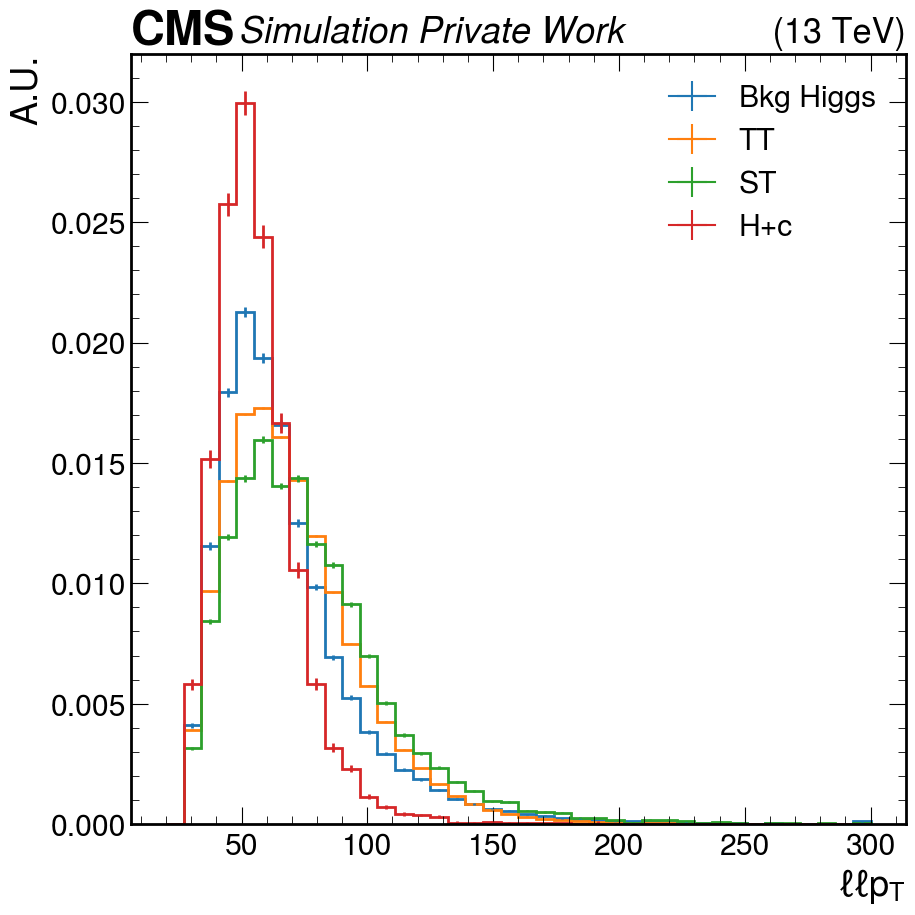

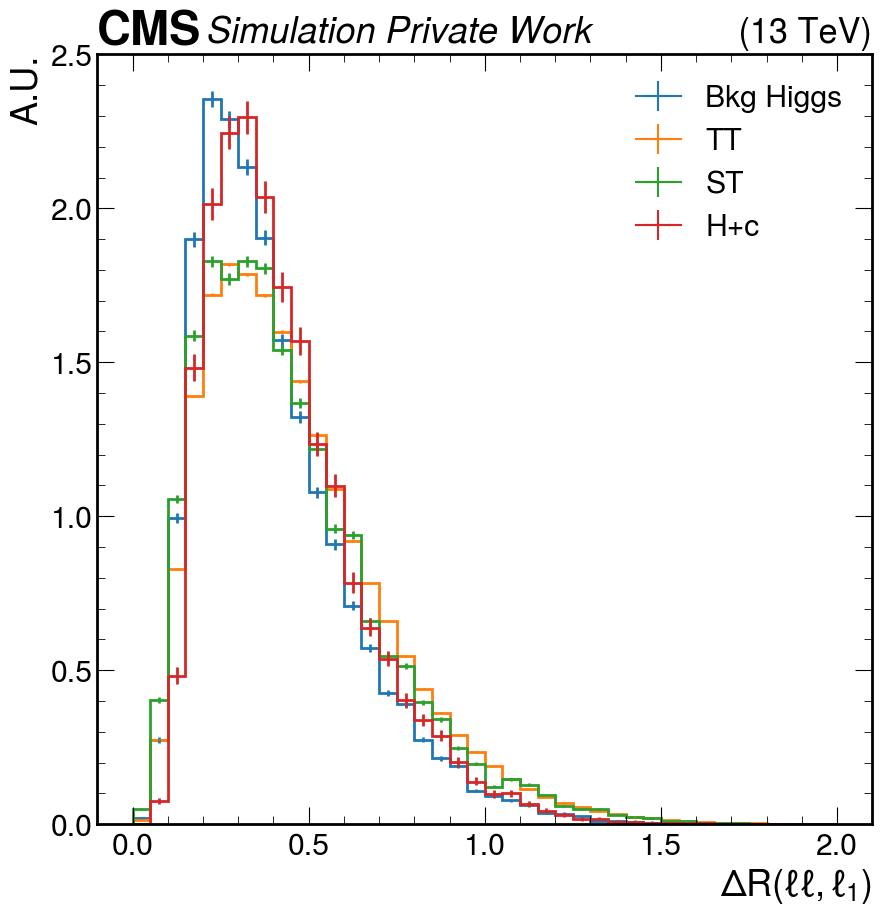

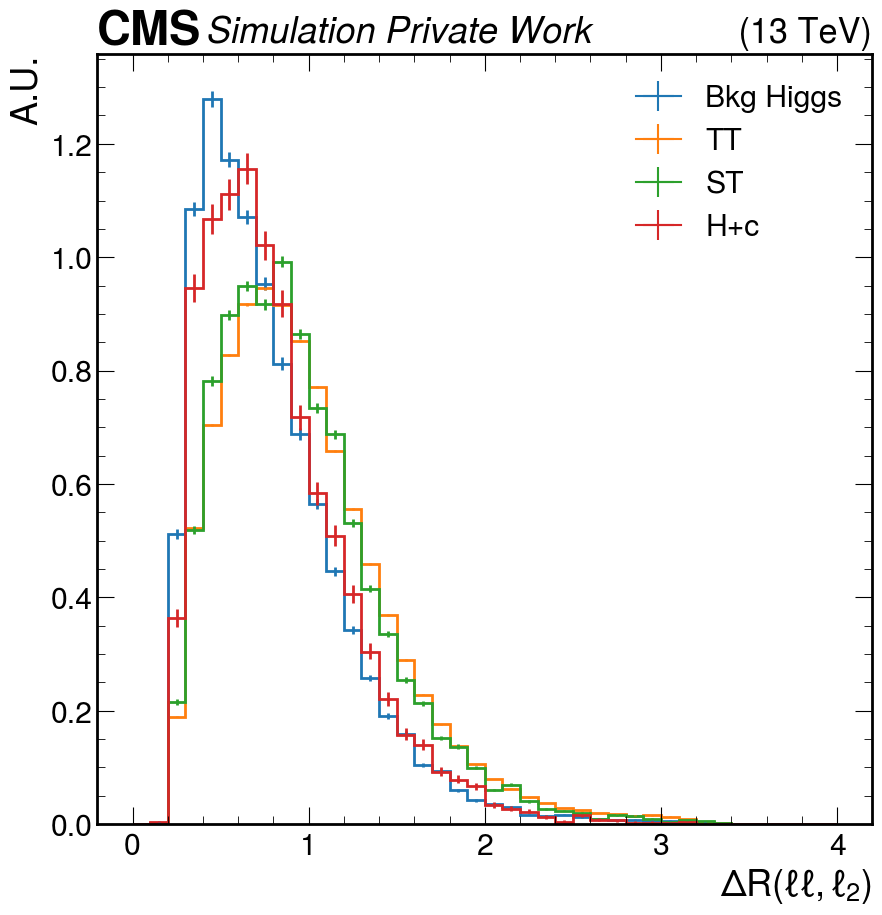

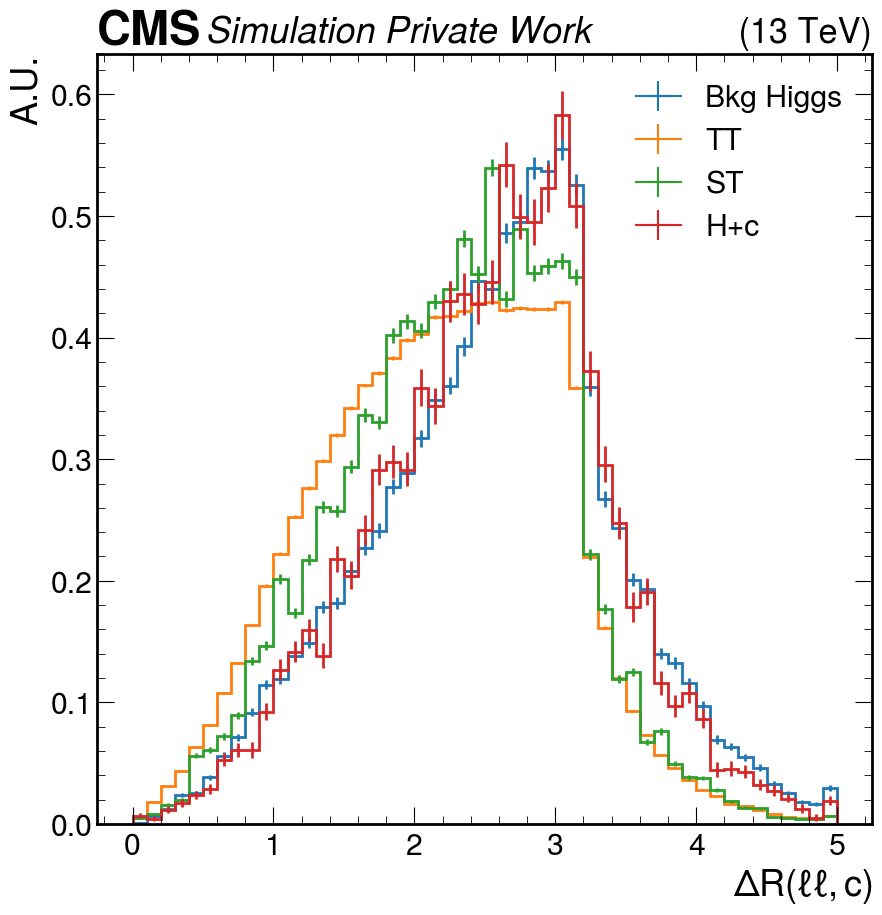

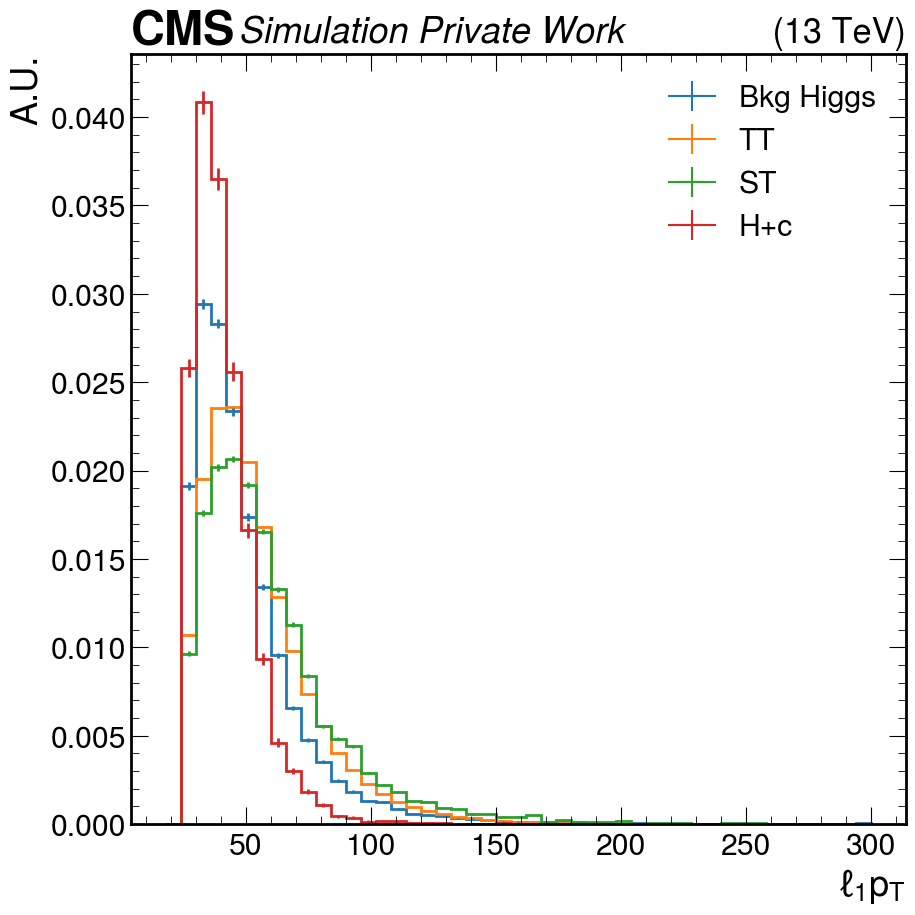

...

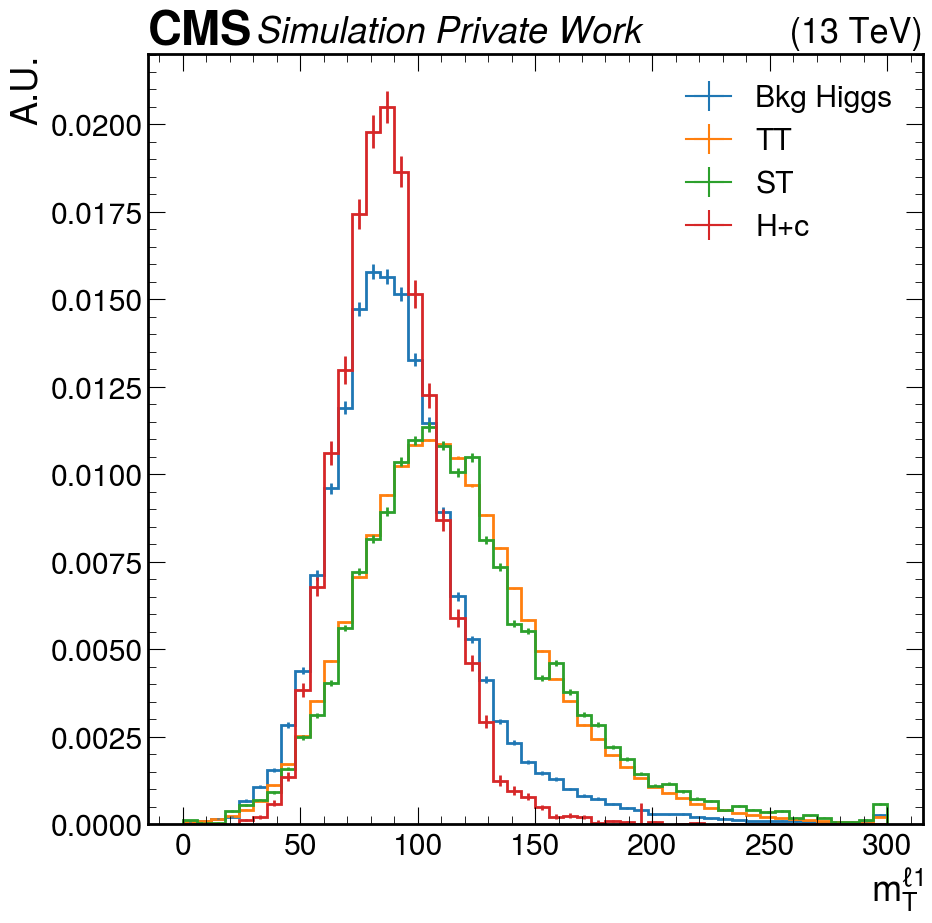

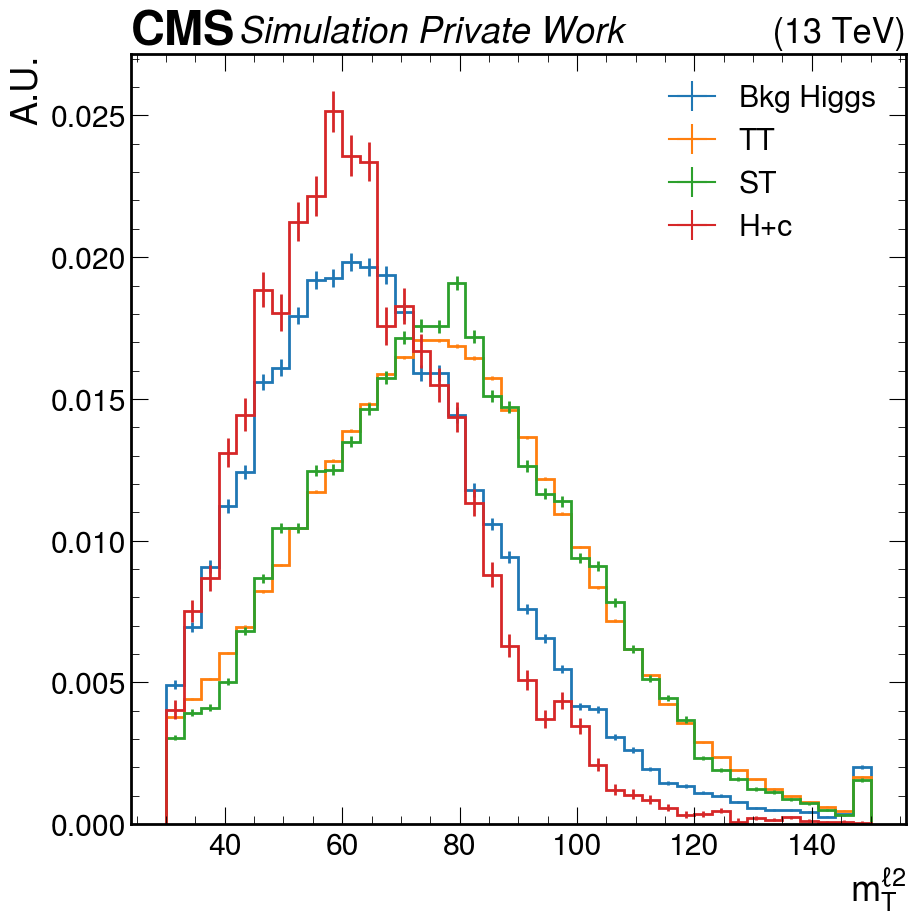

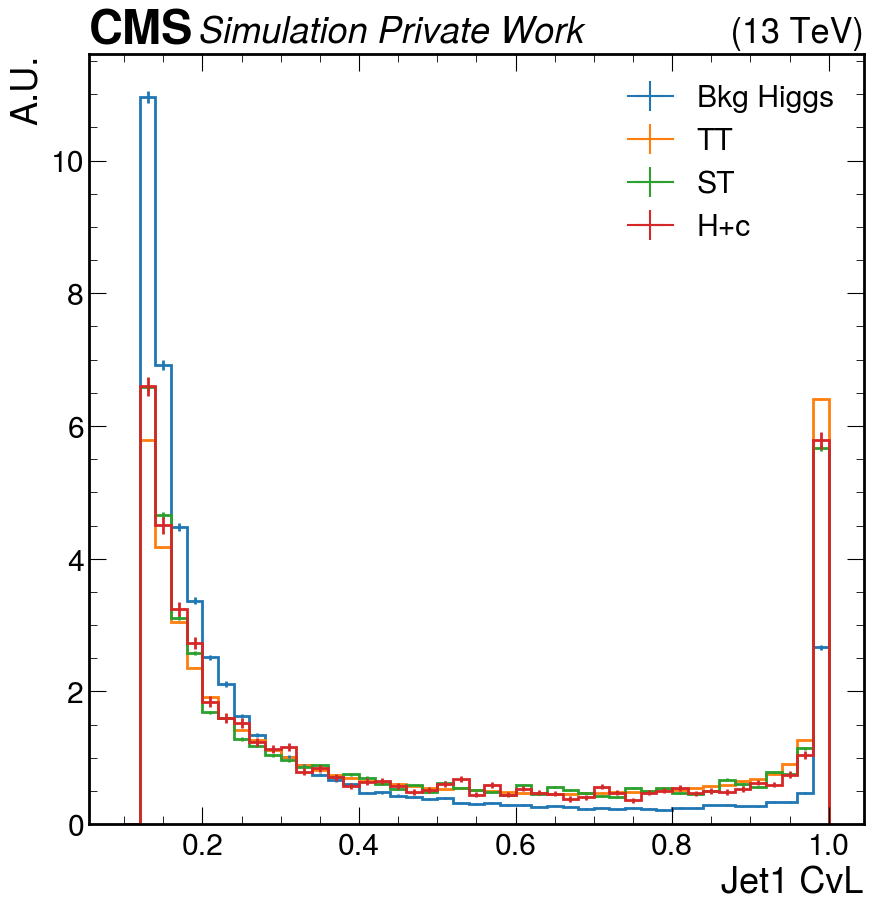

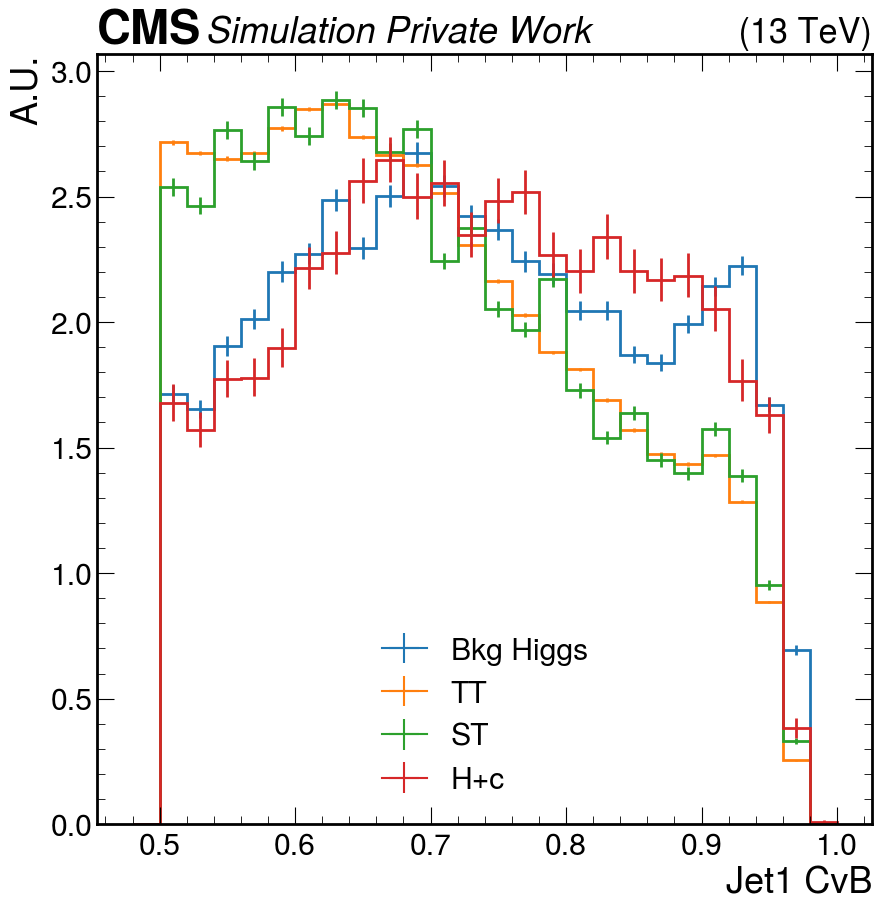

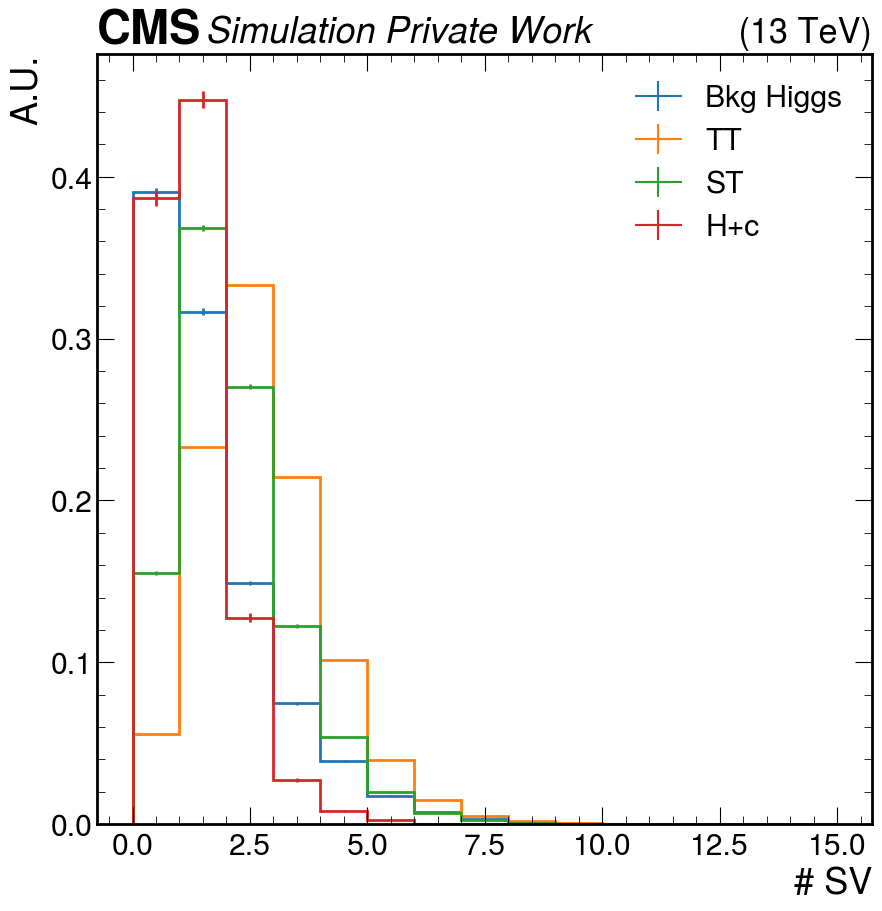

In [45]:
color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#666666","hc":"#CC503E"}
# name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}
train_collect.keys()
import hist
for var in MCvar.keys():
    fig,ax=plt.subplots()
    hep.cms.label(
            "Private Work",
            # data=True,
            # lumi=lumi/1000,
            # com="13",
            loc=0,
            ax=ax,
        )
    for s in weivar.keys():
        if 'Z+jets' ==s or 'VV' ==s:continue
        h = (
    hist.new.Regular(train_collect[var][1], train_collect[var][2][0],train_collect[var][2][1], name="x",label=train_collect[var][0])
    .Weight()
)
        h.fill(MCvar[var][s],weight=weivar[s])
        hep.histplot(h,label=s,ax=ax,flow="sum",lw=2,density=True)
    ax.set_ylim(bottom=0.)
    ax.set_ylabel("A.U.")
    ax.set_xlabel(train_collect[var][0])
    ax.legend()
    fig.savefig(f"plot/{var}_shape.pdf")
        
            

In [9]:
import numpy as np
bdt,bdt_H=np.empty(1),np.empty(1)
bdts,bdts_H={},{}
for s in MCvar[list(MCvar.keys())[0]].keys():
    x= np.vstack([MCvar[var][s] for var in trainvar]).T
    dmatrix = xgb.DMatrix(x)
    bdts[s]=xgb_model.predict(dmatrix)
    bdts_H[s]=xgb_model_old.predict(dmatrix)
    bdt=np.concatenate([bdt,xgb_model.predict(dmatrix)])
    bdt_H=np.concatenate([xgb_model_old.predict(dmatrix),bdt_H])


In [21]:
weivar.keys()

dict_keys(['Bkg Higgs', 'TT', 'ST', 'Z+jets', 'VV', 'H+c'])

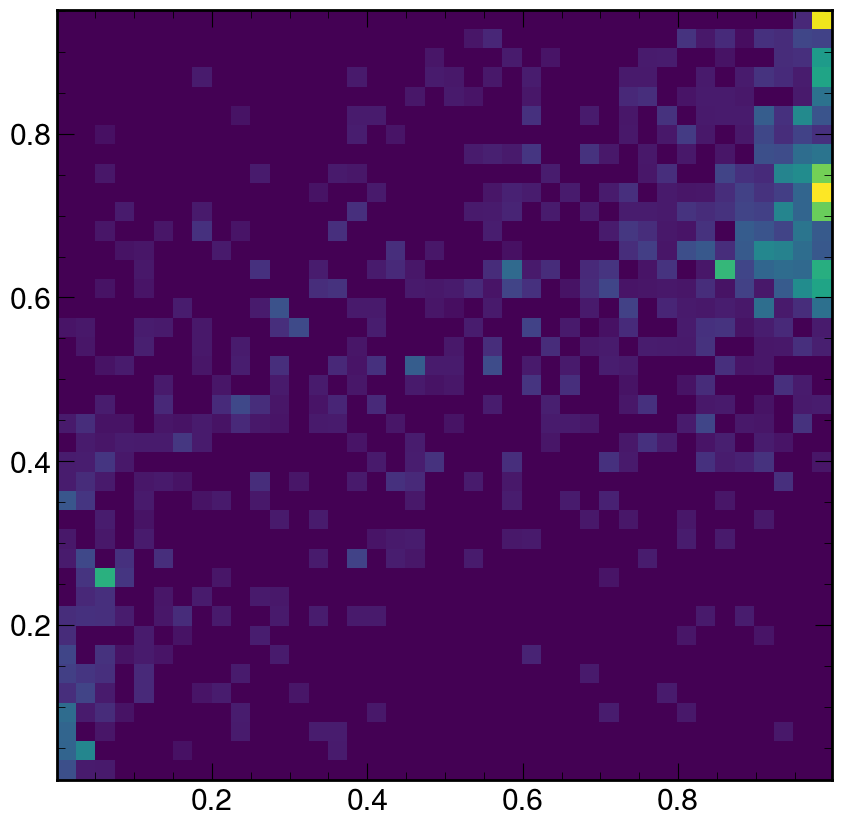

In [22]:
# from matplotlib.colors import LogNormabs
# plt.scatter(x, y, s=area, c="#66666", alpha=0.5)
hc,x,y,_=plt.hist2d(bdts['H+c'],bdts_H["H+c"],bins=[40,40],weights=weivar["H+c"]*10000)#, norm=LogNorm(),cmap="Greys")
tt,x,y,_=plt.hist2d(bdts['TT'],bdts_H["TT"],bins=[40,40],weights=weivar["TT"])#, norm=LogNorm(),cmap="Greys")
higgs,x,y,_=plt.hist2d(bdts['Bkg Higgs'],bdts_H["Bkg Higgs"],bins=[40,40],weights=weivar["Bkg Higgs"]*100)#, norm=LogNorm(),cmap="Greys")
st,x,y,__=plt.hist2d(bdts['ST'],bdts_H["ST"],bins=[40,40],weights=weivar["ST"])
vv,x,y,__=plt.hist2d(bdts['VV'],bdts_H["VV"],bins=[40,40],weights=weivar["VV"])

# np.shape(hc)

# plt.scatter(x, y, s=, c="#666676", alpha=0.5)
# plt.show()
# plt.colorbar()
# plt.ylabel()
# cbar = plt.colorbar(ec)
# cbar.set_label('X+Y')

In [30]:
xbins=(x[1:]+x[:-1])/2.
ybins=(y[1:]+y[:-1])/2.
xlist=[]
ylist=[]
hclist,higgslist,vvlist,stlist,ttlist=[],[],[],[],[]
for i,xx in enumerate(xbins):
    for j,yy in enumerate(ybins):
        xlist.append(xx)
        ylist.append(yy)
        hclist.append(hc[i][j])
        higgslist.append(higgs[i][j])
        vvlist.append(vv[i][j])
        stlist.append(st[i][j])
        ttlist.append(tt[i][j])


/nfs/dust/cms/user/milee/miniconda3/envs/CoffeaRunner_new/lib/python3.10/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/nfs/dust/cms/user/milee/miniconda3/envs/CoffeaRunner_new/lib/python3.10/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


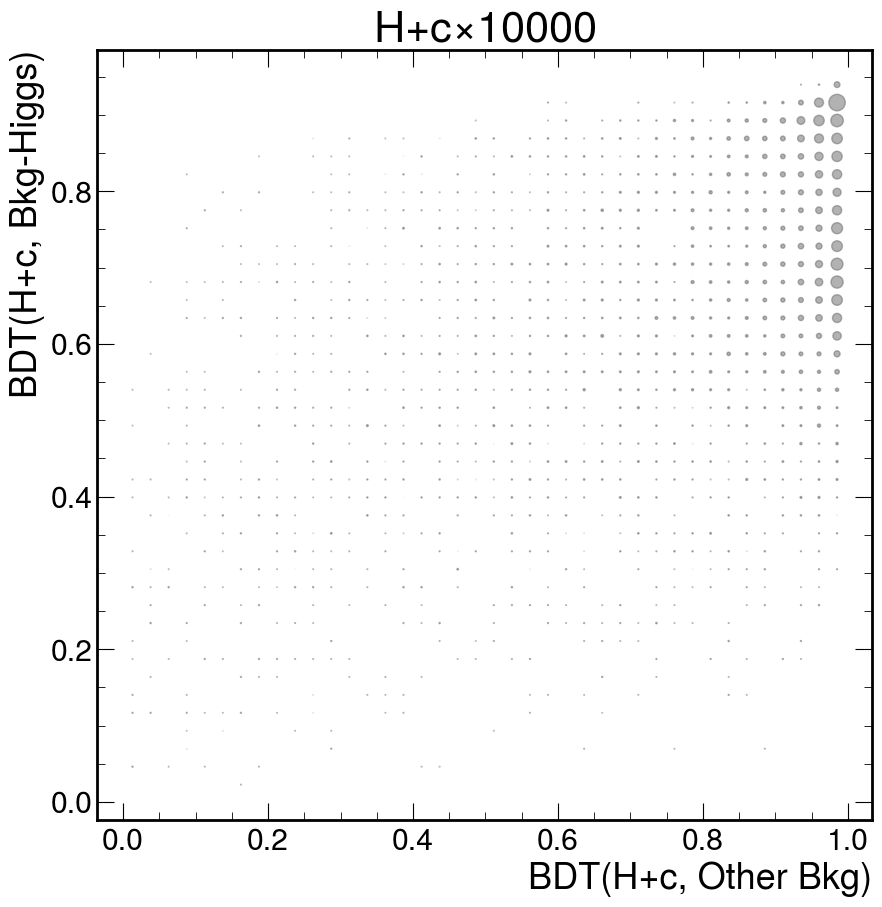

In [53]:
# print(xlist)
# hclist
import numpy as np
# len(np.array(hclist)*5)
np.sum(hclist),
color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Bkg Higgs":"#CC503E","H+c":"#666666",'ggH':'gray'}
# plt.scatter(xlist, ylist, s=np.array(ttlist), c=color_map["TT"], alpha=0.7,label="$t\\bar{t}$")
# plt.scatter(xlist, ylist, s=np.array(stlist), c=color_map["ST"], alpha=0.7,label="Single Top")
# plt.scatter(xlist, ylist, s=np.array(vvlist)*50, c=color_map["VV"], alpha=0.7,label="Diboson")
# plt.scatter(xlist, ylist, s=np.array(higgslist), c=color_map["Bkg Higgs"], alpha=0.7,label="Bkg Higgs$\\times$100")
plt.scatter(xlist, ylist, s=np.array(hclist), c=color_map["H+c"], alpha=0.5,label="H+c$\\times$10000")
# plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.08),ncol=5,fontsize=20)
plt.title("H+c$\\times$10000")
plt.ylabel("BDT(H+c, Bkg-Higgs)")
plt.xlabel("BDT(H+c, Other Bkg)")
plt.savefig("2D_hcx10000.pdf")

In [13]:
from joblib import load
=load("kmeans_model_UL17_15_SR2_LM.joblib")

array([0.68734324, 0.73068291, 0.93212491, ..., 0.68781799, 0.68930835,
       1.37052524])

In [139]:
bdt,bdt2={},{}
for s in MCvar[list(MCvar.keys())[0]].keys():
    x= np.vstack([MCvar[var][s] for var in trainvar]).T
    dmatrix = xgb.DMatrix(x)
    bdt[s]=xgb_model.predict(dmatrix)
    bdt2[s]=xgb_model_old.predict(dmatrix)
hist,hist2={},{}
for s in bdt.keys():
    hist[s],egdges=np.histogram(bdt[s],bins=100,range=(np.amin(bdt[s]),np.amax(bdt[s])),weights=weivar[s])
    hist[s][hist[s]<0]=0
    hist2[s],egdges=np.histogram(bdt2[s],bins=100,range=(np.amin(bdt2[s]),np.amax(bdt2[s])),weights=weivar[s])
    hist2[s][hist2[s]<0]=0
pr,pr_H={},{}
# sum_hist,pr_sum=np.zeros(100),np.zeros(101)
for b in hist.keys():
    # if b == signal:continue
    # sum_hist=autorangersum_hist+hist[b]
    pr[b]=[]
    pr_H[b]=[]
    for i in range(101):
        pr[b].append(np.sum(hist[b][:i])/np.sum(hist[b]))
        pr_H[b].append(np.sum(hist2[b][:i])/np.sum(hist2[b]))
# for i in range(101):pr_sum[i]=(np.sum(sum_hist[:i])/np.sum(sum_hist))
# pr,prsum=make_ROC(MCvar,trainvar,weivar,xgb_model)
# pr_H,prsum_H=make_ROC(MCvar,trainvar,weivar,xgb_model_old)


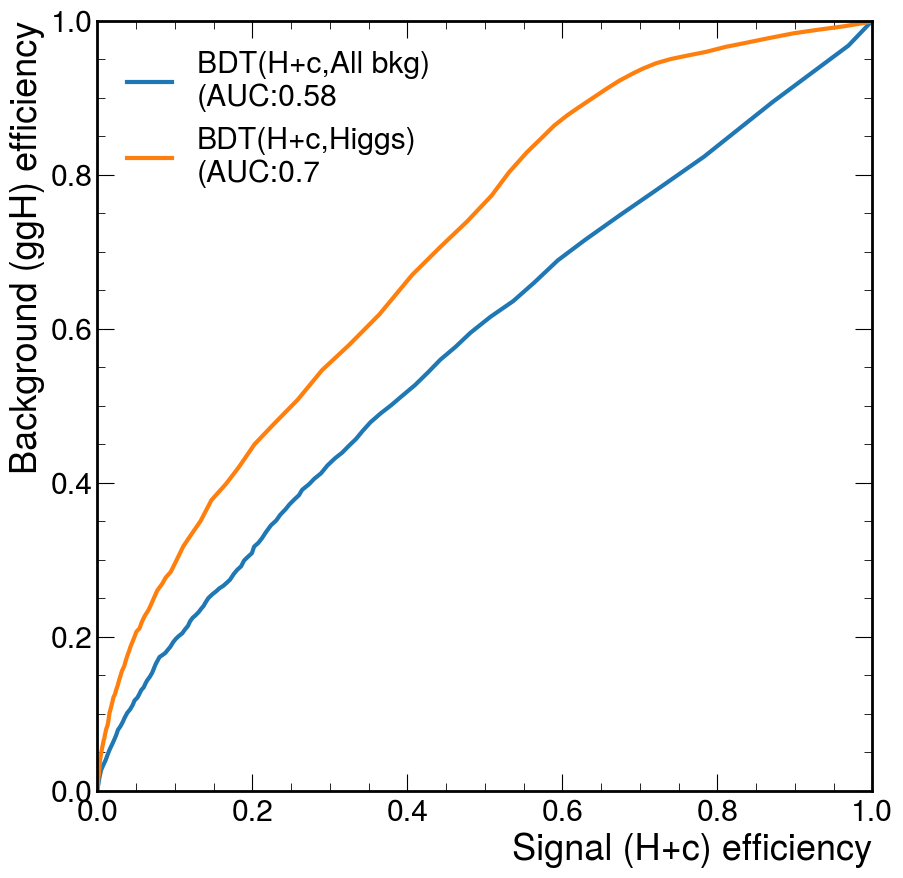

In [143]:
from sklearn import metrics

plt.plot(pr['H+c'],pr["ggH"],label=f"BDT(H+c,All bkg)\n(AUC:{round(metrics.auc(pr['H+c'],pr['ggH']),2)}",lw=3)
plt.plot(pr_H['H+c'],pr_H["ggH"],label=f"BDT(H+c,Higgs)\n(AUC:{round(metrics.auc(pr_H['H+c'],pr_H['ggH']),2)}",lw=3)
plt.ylim(0,1)
plt.xlim(0,1)
plt.ylabel("Background (ggH) efficiency")
plt.xlabel("Signal (H+c) efficiency")
plt.legend()
plt.savefig("ROC.pdf")
# plt.plot(pr_H['H+c'])

In [48]:
x2= np.vstack([MCvar[var]["Higgs (WW+ZZ)"] for var in trainvar if var !="run" and "event"]).T
# # x
dmatrix2 = xgb.DMatrix(x2)
bdt2=xgb_model.predict(dmatrix2)



In [17]:
mask=((bdt<0.8)&(bdt>0.6))
MCvar["run"]["H+c"][mask][:10],MCvar["event"]["H+c"][mask][:10],MCvar["lumi"]["H+c"][mask][:10]

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=uint32),
 array([7184023, 7185197, 7192909, 7206208, 7206390, 7207490, 7210930,
        7211694, 7214555, 7232095], dtype=uint64),
 array([2496, 2496, 2499, 2504, 2504, 2504, 2505, 2505, 2506, 2513],
       dtype=uint32))

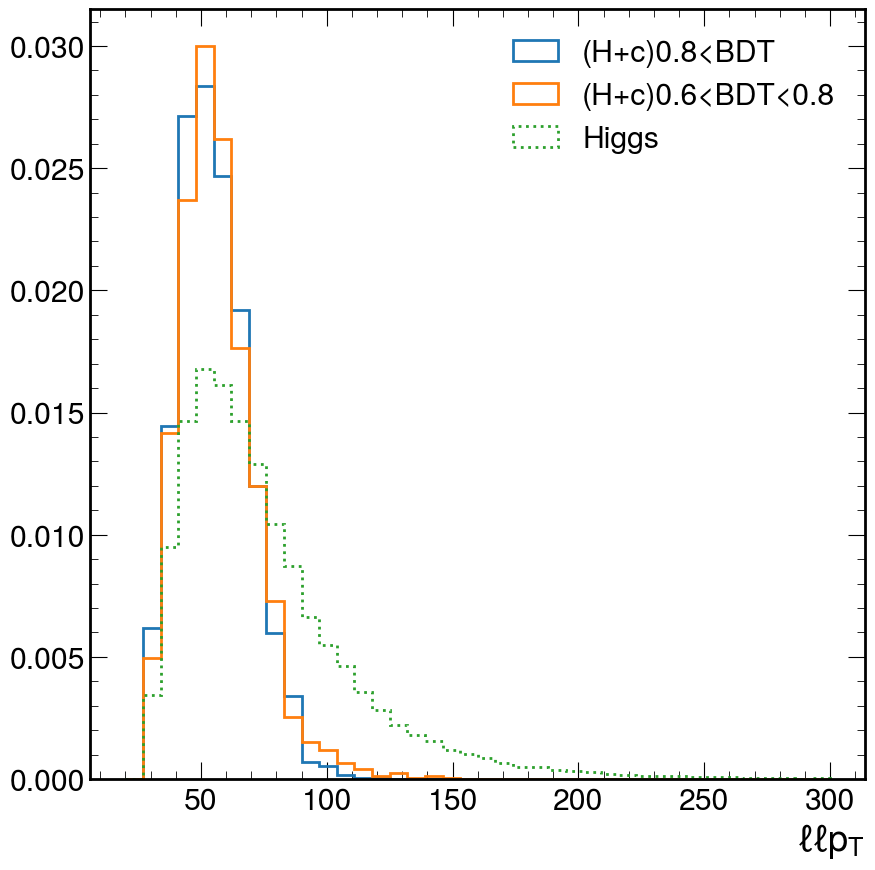

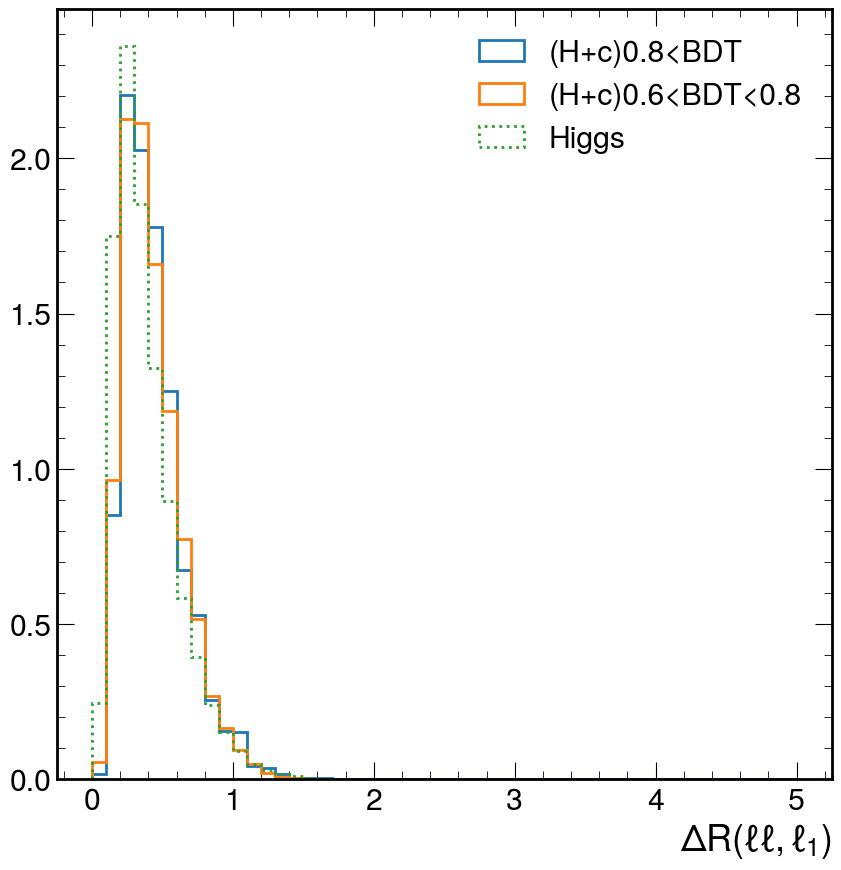

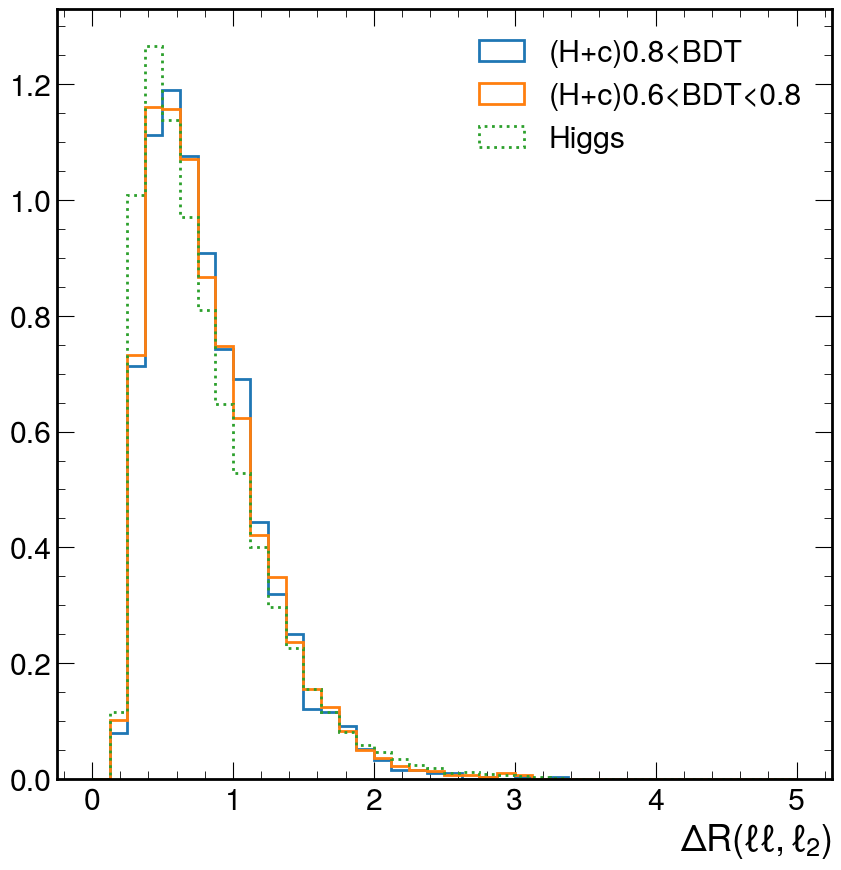

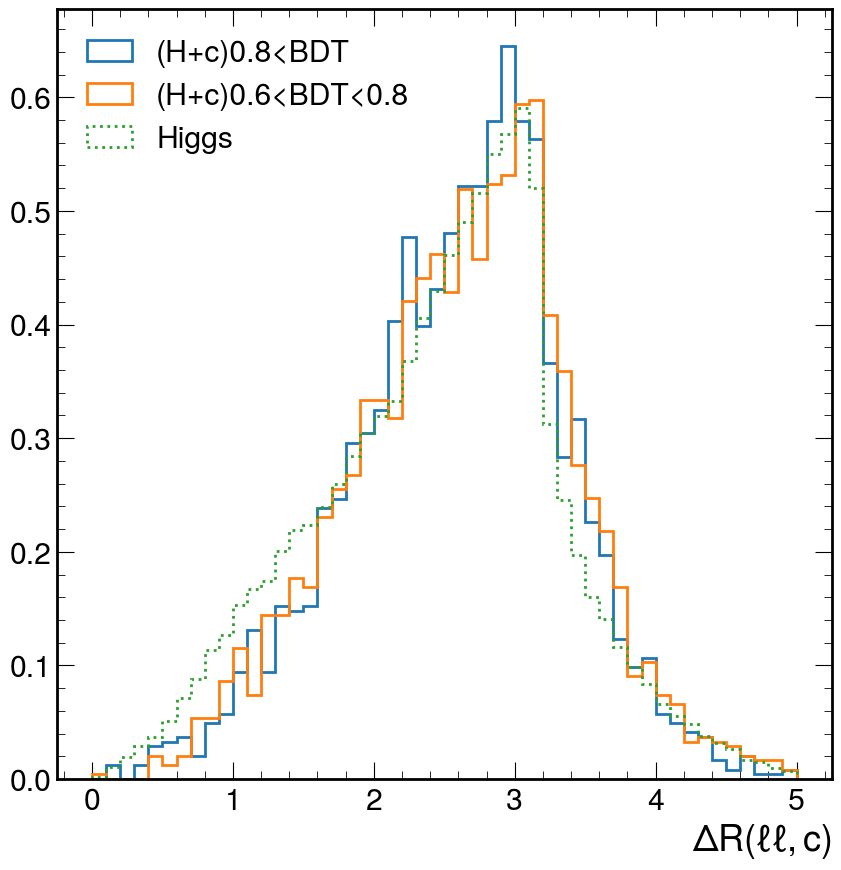

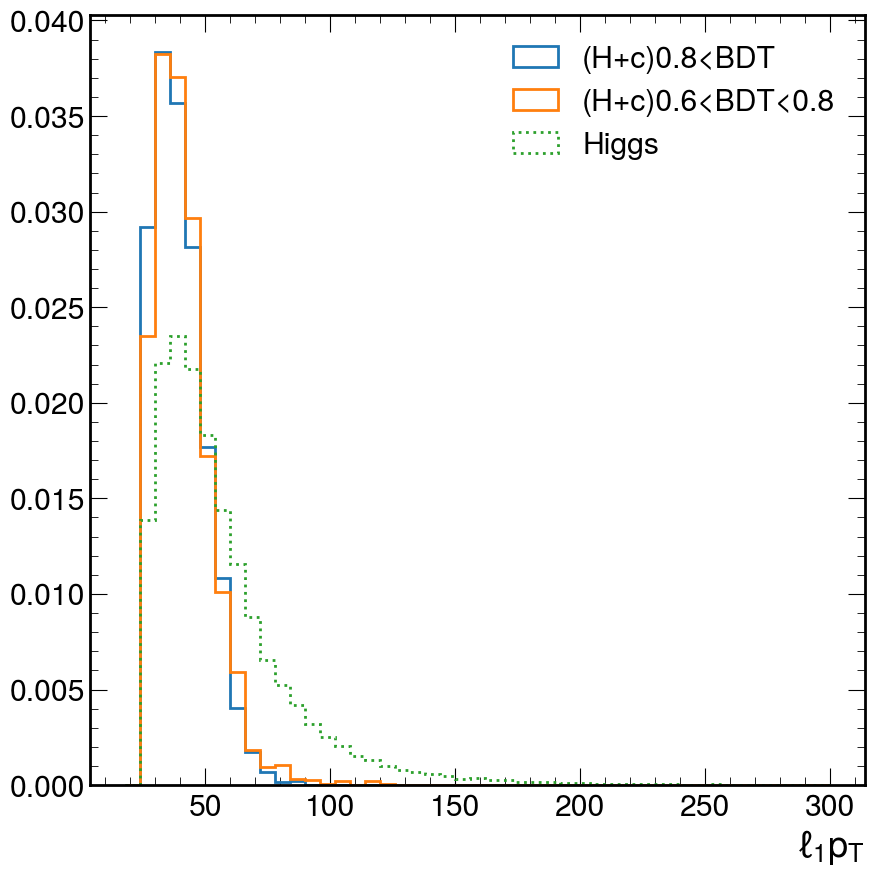

...

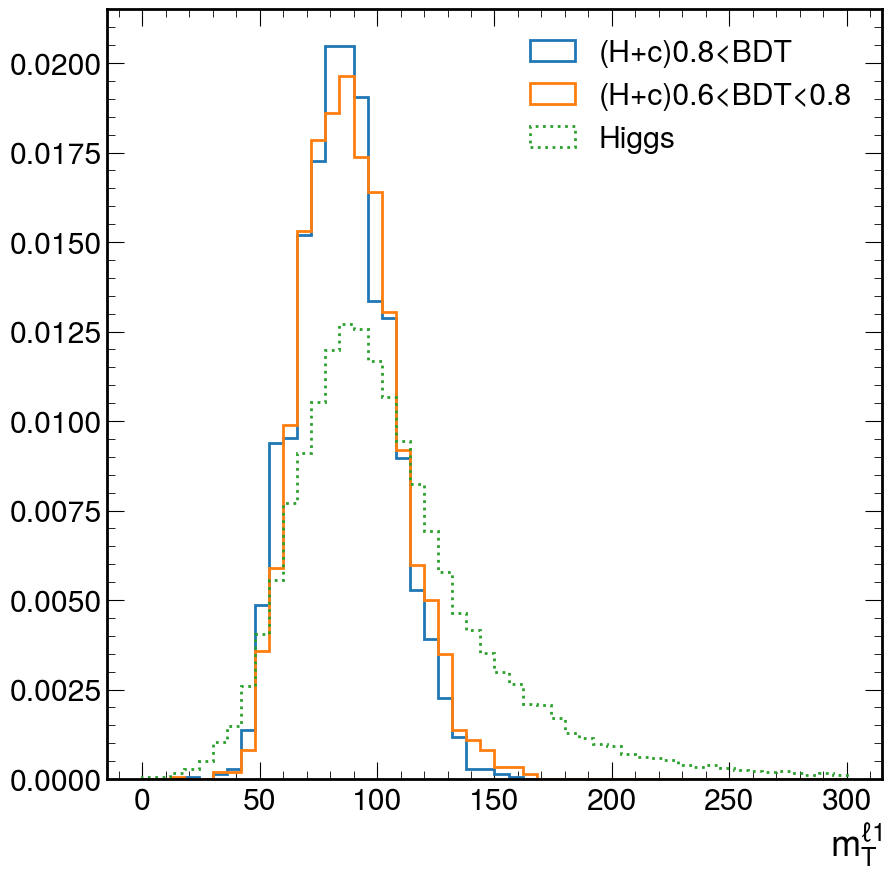

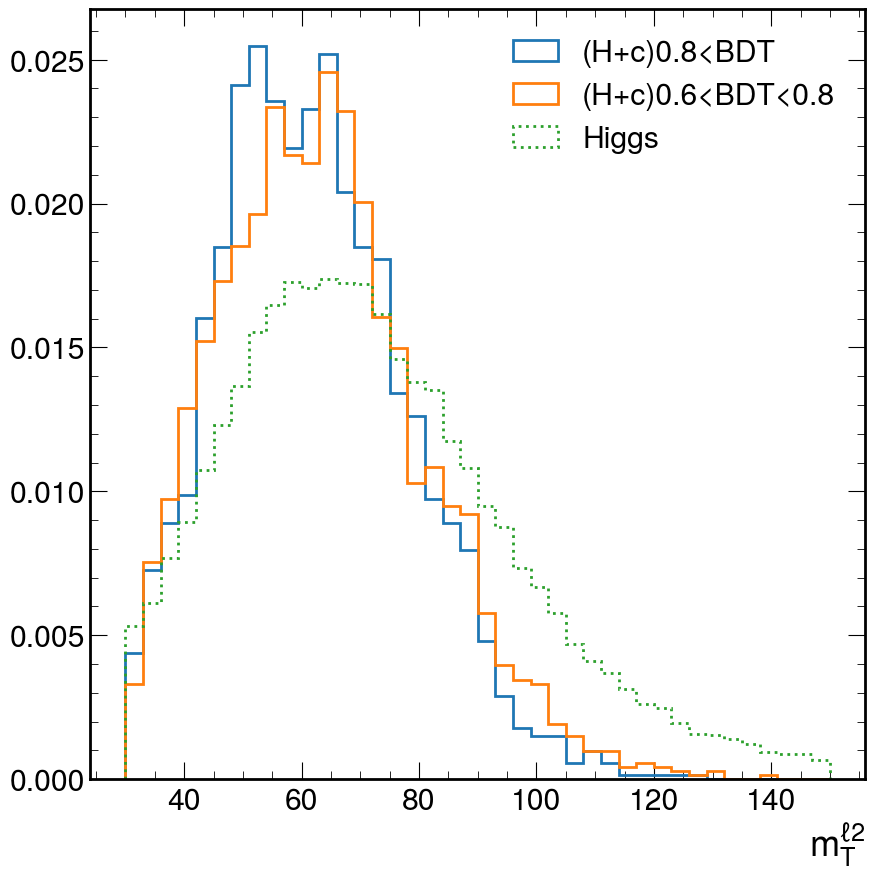

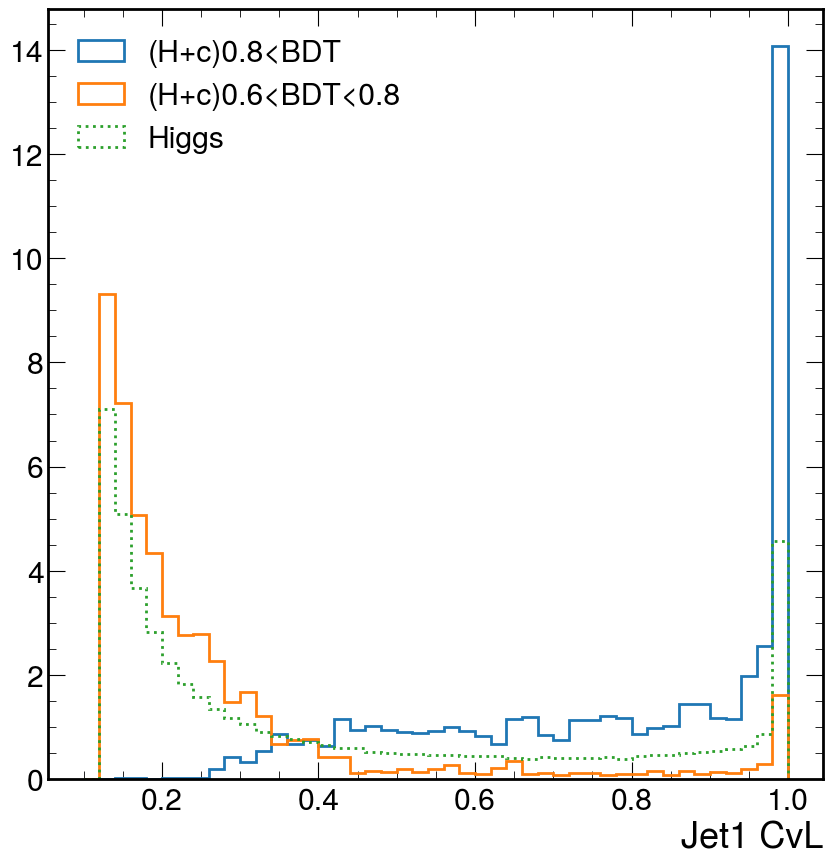

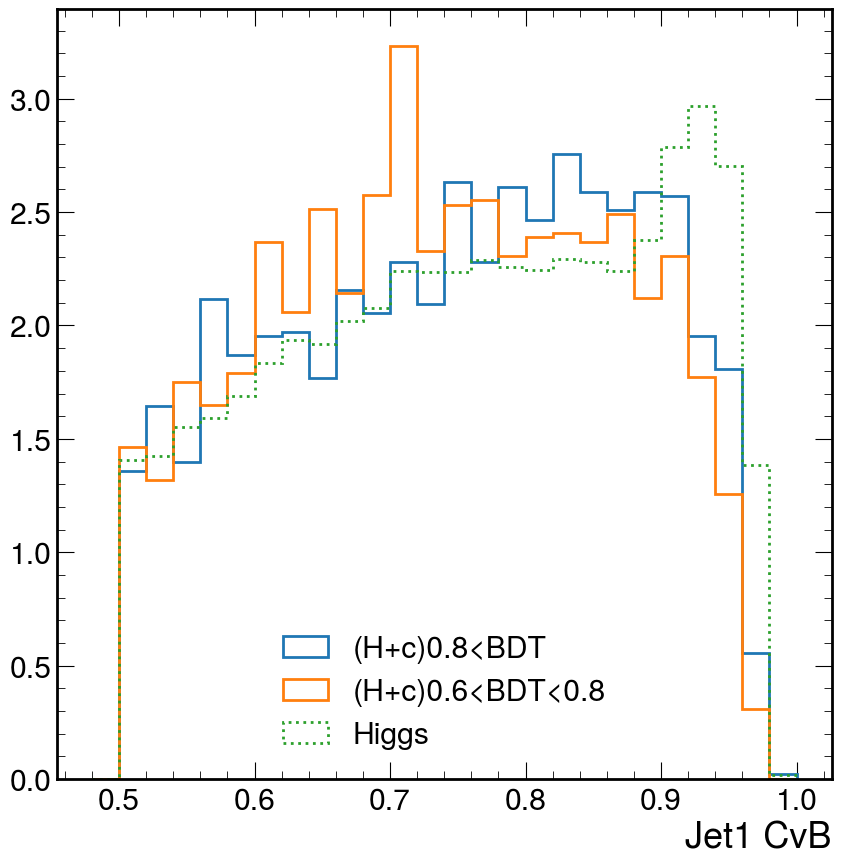

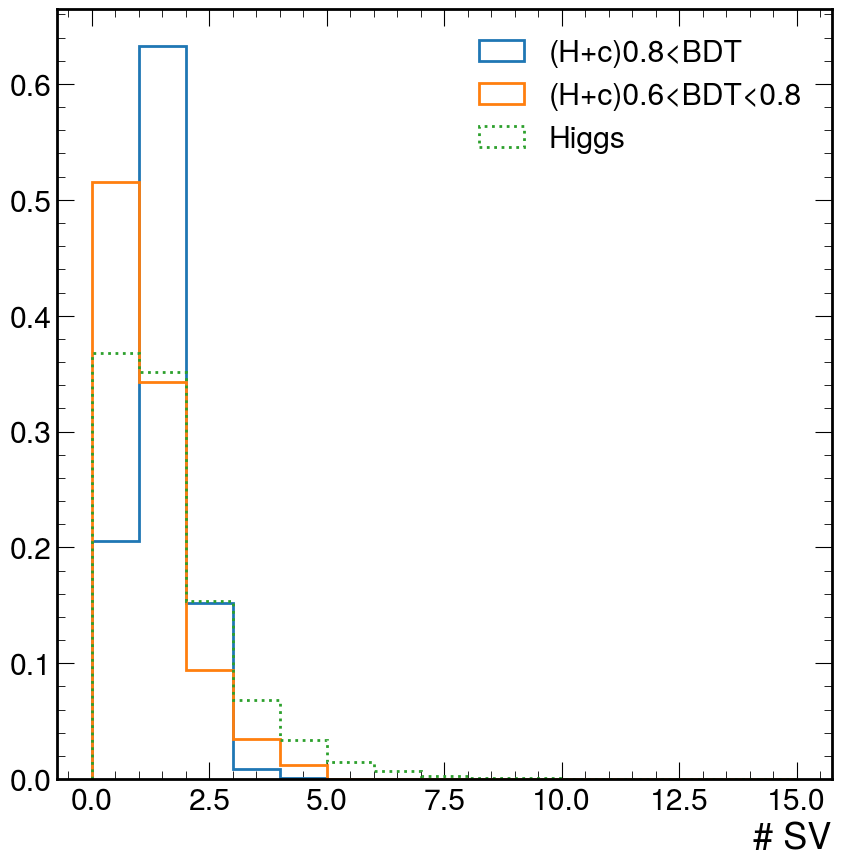

In [50]:
import matplotlib.pyplot as plt
# train_collect
import matplotlib.pyplot as plt, mplhep as hep
plt.style.use(hep.style.ROOT)
for var in trainvar:
    fig,ax=plt.subplots()
    ax.hist(MCvar[var]["H+c"][(bdt>0.8)],bins=train_collect[var][1],range=train_collect[var][2],label='(H+c)0.8<BDT',density=True,histtype='step',lw=2)
    ax.hist(MCvar[var]["H+c"][(bdt<0.8)&(bdt>0.6)],bins=train_collect[var][1],range=train_collect[var][2],label='(H+c)0.6<BDT<0.8',density=True,histtype='step',lw=2)
    ax.hist(MCvar[var]["Higgs (WW+ZZ)"],bins=train_collect[var][1],range=train_collect[var][2],label='Higgs',density=True,histtype='step',lw=2,ls=":")
    ax.legend()
    ax.set_xlabel(train_collect[var][0])
#     ax.hist(MCvar[var]["H+c"][(bdt>0.8)],bins=train_collect[var][2],bins=train_collect[var][1],label='0.8<BDT')

In [4]:
MCvar={}
weivar={}
for var in trainvar+["run","event","lumi"] :
    MCbkgLM = []
    MCvar[var]={}
    for m in mergemap:
        tmpml,tmpwei=[],[]
        for ml in mergemap[m]:
#             if len(collect_var[ml]['SR_LM'].keys())==0:continue
#             mask=collect_var[ml]['SR']['nselj']==1
            tmpml=np.concatenate((tmpml,collect_var[ml]['SR2_LM'][var])) 
#             tmpwei=np.concatenate((tmpwei,collect_var[ml]['SR_LM']['mcwei'][mask]*collect_var[ml]['SR_LM']['weight'][mask])) 
        MCvar[var][m]=tmpml
#         weivar[m]=tmpwei
        MCbkgLM+=[tmpml]
#     if  var=="jetflav_flav" or var=="jetflav2_flav":continue
#     MCvar[var]["data"]=np.hstack([data_var[s]['SR_LM'][var][data_var[s]['SR_LM']['nselj']==1] for s in data_var.keys() if len(data_var[s]['SR_LM'])>0])
 
    

NameError: name 'trainvar' is not defined

(array([  0.,   0.,   0.,   2.,   5.,   5.,   5.,   8.,   5.,   8.,  12.,
         11.,  17.,  17.,  24.,  28.,  28.,  33.,  29.,  37.,  38.,  60.,
         39.,  59.,  60.,  61.,  64.,  90., 106., 177., 261., 338., 479.,
        643., 908., 985., 563., 103.,  39.,  14.,   5.,   1.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.]),
 array([0.        , 0.02      , 0.04      , 0.06      , 0.08      ,
        0.1       , 0.12      , 0.14      , 0.16      , 0.18000001,
        0.2       , 0.22      , 0.23999999, 0.25999999, 0.28      ,
        0.30000001, 0.31999999, 0.34      , 0.36000001, 0.38      ,
        0.40000001, 0.41999999, 0.44      , 0.46000001, 0.47999999,
        0.5       , 0.51999998, 0.54000002, 0.56      , 0.57999998,
        0.60000002, 0.62      , 0.63999999, 0.66000003, 0.68000001,
        0.69999999, 0.72000003, 0.74000001, 0.75999999, 0.77999997,
        0.80000001, 0.81999999, 0.83999997, 0.86000001, 0.88      ,
        0.89999998, 0.92000002, 0.94      , 0.

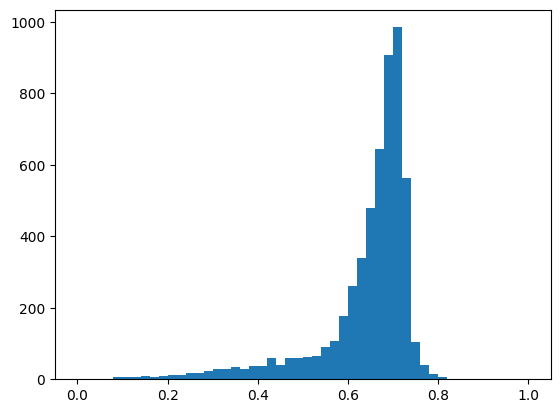

In [34]:
# xgb_model
bdt={}
# MCvar.keys()

x= np.vstack([MCvar[var]["H+c"] for var in trainingvar[:-3]] ).T
x
dmatrix = xgb.DMatrix(x)
bdt=xgb_model.predict(dmatrix)
import matplotlib.pyplot as plt
plt.hist(bdt,range=(0,1),bins=50)

In [23]:
bdt,bdt_old,bdt_LM,bdt_ggH,bdt_weihiggs={},{},{},{},{}

for s in MCvar[var].keys():
    x= np.vstack([MCvar[var][s] for var in trainingvar]).T
    dmatrix = xgb.DMatrix(x)
    bdt[s]=xgb_model.predict(dmatrix)
    LM_x= np.vstack([MCvar[var][s] for var in trainingvar]).T
    LM_dmatrix=xgb.DMatrix(LM_x)
    bdt_LM[s]=xgb_model_LM.predict(LM_dmatrix)
    old_x= np.vstack([MCvar[var][s] for var in trainingvar]).T
    old_dmatrix = xgb.DMatrix(old_x)
    bdt_old[s]=xgb_model_old.predict(old_dmatrix)
    
    bdt_ggH[s]=xgb_model_ggH.predict(xgb.DMatrix(np.vstack([MCvar[var][s] for var in trainingvar]).T))
    bdt_weihiggs[s]=xgb_model_weihiggs.predict(xgb.DMatrix(np.vstack([MCvar[var][s] for var in trainingvar]).T))
#     bdt_old[s]= 1.0 / (1 + np.exp(-xgb_model_old.predict(old_dmatrix)))# take  signal node
#     bdt3[s]=xgb_model3.predict(dmatrix)


/tmp/ipykernel_11676/1674576939.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(color[s])


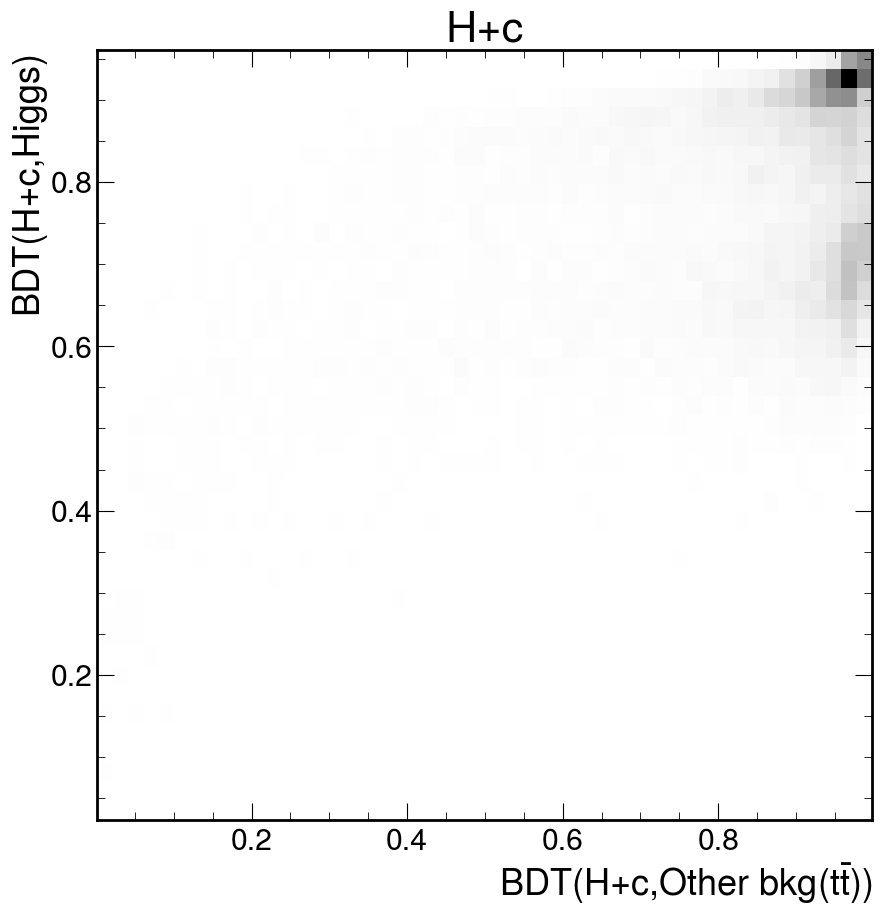

In [83]:
import hist 
import matplotlib.pyplot as plt
import mplhep as hep
import uproot
import numpy as np
plt.style.use(hep.style.ROOT)
name_map={"TT":'ttbar',"ST":"st","Z+jets":"zjets","VV":'vv',"Higgs (WW+ZZ)":"higgs","H+c":"hc","data":"data_obs"}

# f=uproot.recreate("../card_maker/shape/2017_SR_LM_template_BDT2D_SR_LM_0608_off.root")
fig,ax=plt.subplots()
# color=['tab:blue','tab:orange','tab:green','tab:red',"tab:purple","tab:brown"]
color={"TT":"Blues","ST":"Greens","Z+jets":"YlOrBr","VV":"OrRd","Higgs (WW+ZZ)":"Purples","H+c":"Greys"}
from matplotlib import cm
for s in bdt_ggH.keys():
    if s=="data":continue
#     ax.scatter(bdt_LM[s],bdt_weihiggs[s],norm='linear',facecolors='none')
#     h = hist.Hist(hist.axis.Regular(50,0,1., name="discr", label="BDT"),hist.axis.Regular(40,0,1., name="ggH_BDT", label="H BDT"),hist.storage.Weight())
#     weight = np.ones(len(bdt_LM[s])) if s=="data" else weivar[s]
#     h.fill(bdt_LM[s],bdt_weihiggs[s])#,weight=weight)

#     f[name_map[s]]=h
    values=h.values()
    values[values==0]=np.nan
#     print(np.shape(np.array([np.array(h.axes[0].edges),np.array(h.axes[1].edges)])),h.shape,h.axes.edges)
#     fig,ax=plt.subplots()
    hist=ax.hist2d(bdt_LM[s],bdt_weihiggs[s],bins=[50,40],cmap=color[s])
#     hist 
    cmap = cm.get_cmap(color[s])
    cmap.set_bad(alpha=0)  # Set white color to transparent
    hist[3].set_cmap(cmap)
#     hep.hist2dplot(values,h.axes[0].edges,h.axes[1].edges,ax=ax,label=s,cmap=color[s])
    ax.set_title(s)
    ax.set_ylabel("BDT(H+c,Higgs)")
    ax.set_xlabel("BDT(H+c,Other bkg($t\\bar{t}$))")
#     fig.savefig(f"2DBDT_UL17_all.pdf")
# ax.scatter(bdt_LM["H+c"],bdt_weihiggs["H+c"],norm='linear',cmap='virdis',s=marker_size,c=np.log(void_fraction))
# ax.legend()
ax.set_ylabel("BDT(H+c,Higgs)")
ax.set_xlabel("BDT(H+c,Other bkg($t\\bar{t}$))")
fig.savefig(f"2DBDT_UL17_all.pdf")
# fig.savefig(f"2DBDT_UL17_scatter.pdf")
# bdt_ggH.keys()

In [24]:
from sklearn.cluster import KMeans,kmeans_plusplus
from sklearn.model_selection import train_test_split
kmeans = KMeans(init="k-means++", n_clusters=20, n_init='auto')
x = np.vstack([np.hstack([bdt_LM[s] for s in bdt_LM.keys() if s!="data"]),np.hstack([bdt_weihiggs[s] for s in bdt_weihiggs.keys()if s!="data"])]).T
y=np.array([])
for i,s in enumerate(weivar.keys()):
    if s=='H+c':y=np.hstack([y,np.ones(weivar[s].shape[0],dtype=int)*1])
    elif s!="data":y=np.hstack([y,np.zeros(weivar[s].shape[0],dtype=int)*0])
w = np.hstack([weivar[s] for s in weivar.keys()])
w[y==0]=np.sum(w[y==1])/np.sum(w[y==0])*w[y==0]
w=w/np.amin(abs(w))
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
        x, y, w, test_size=0.55, random_state=7
    )


In [36]:
# n_clusters_list = [ 16,32,40,45,50]#all&nj==1
n_clusters_list = [ 16,32,40,50,55,60]#
# n_clusters_list=[45]
# n_clusters_list=[55,60]
# n_clusters_list=[10,16,20,25,28,30,32,35,40]

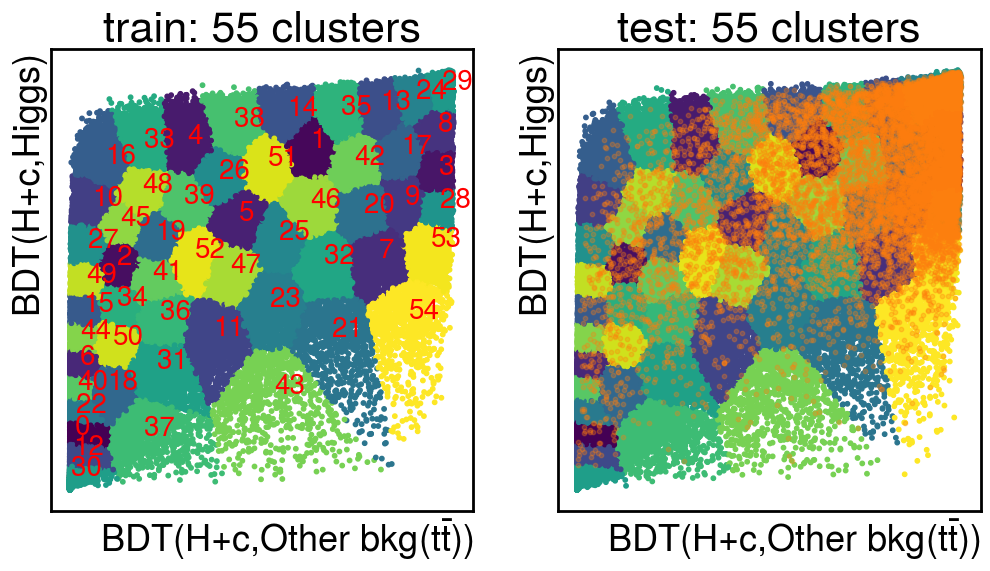

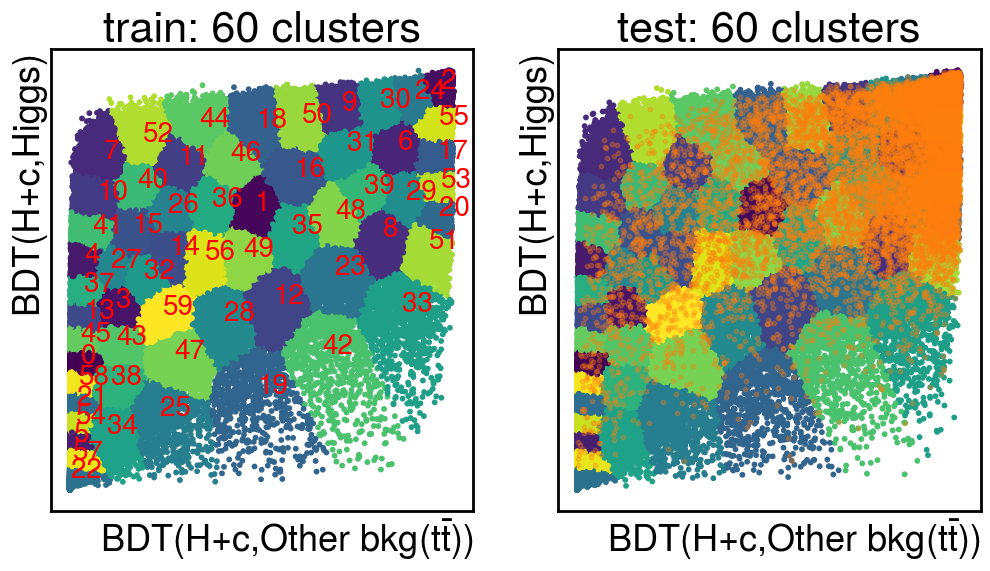

In [27]:
import matplotlib.pyplot as plt
import mplhep as hep
from sklearn.datasets import make_blobs
from sklearn.cluster import kmeans_plusplus, KMeans

from joblib import dump

random_state=0
# Number of cluster centers for KMeans and BisectingKMeans
plt.style.use(hep.style.ROOT)


# Algorithms to compare
clustering_algorithms = {
    "KMeans++": kmeans_plusplus,
    "K-Means": KMeans,
}

# Make subplots for each variant

# 

# for i, (algorithm_name, Algorithm) in enumerate(clustering_algorithms.items()):
for j, n_clusters in enumerate(n_clusters_list):
    fig, axs = plt.subplots(
    1, 2, figsize=(12,6),sharex=True,sharey=True
    )
    axs = axs.T
#     fig,axs=plt.subplots()
#     algopp, indices = kmeans_plusplus(X_train,n_clusters=n_clusters, random_state=random_state, n_init=3)
#     algopp.fit(X_train,y_train,sample_weight=w_train)
#     centers = algopp.cluster_centers_
    algo = KMeans(n_clusters=n_clusters, random_state=random_state, n_init=3)
    algo.fit(X_train,y_train,sample_weight=w_train)
    test=algo.predict(X_test,sample_weight=w_test)
    centers = algo.cluster_centers_
#     centers_t = test.cluster_centers_

    axs[0].scatter(X_train[:, 0], X_train[:, 1], s=10, c=algo.labels_)
    axs[1].scatter(X_test[:, 0], X_test[:, 1], s=10, c=test)
    axs[1].scatter(X_test[:, 0][y_test==1], X_test[:, 1][y_test==1], s=10, c='tab:orange',alpha=0.3)
    for i in range(len(centers)):
        axs[0].text(centers[i, 0], centers[i, 1],str(i), c="r",fontsize=20)
#     axs[1,].scatter(centers_t[:, 0], centers_t[:, 1], c="r", s=20)
    axs[0].set_title(f"train: {n_clusters} clusters")
    axs[1].set_title(f"test: {n_clusters} clusters")
    dump(algo, f'kmeans_model_UL17_{n_clusters}_SR.joblib')
    fig.savefig(f"SR_LM_{n_clusters}cluster.png")

# Hide x labels and tick labels for top plots and y ticks for right plots.
    for ax in axs.flat:
        ax.label_outer()
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_ylabel("BDT(H+c,Higgs)")
        ax.set_xlabel("BDT(H+c,Other bkg($t\\bar{t}$))")
# plt.show()

In [30]:
!mv kmeans_model_UL17_60_SR.joblib kmeans_model_UL17_60_SR2.joblib

['higgs;1', 'ttbar;1', 'st;1', 'zjets;1', 'vv;1', 'hc;1', 'data_obs;1']
['higgs;1', 'ttbar;1', 'st;1', 'zjets;1', 'vv;1', 'hc;1', 'data_obs;1']
['higgs;1', 'ttbar;1', 'st;1', 'zjets;1', 'vv;1', 'hc;1', 'data_obs;1']
['higgs;1', 'ttbar;1', 'st;1', 'zjets;1', 'vv;1', 'hc;1', 'data_obs;1']
['higgs;1', 'ttbar;1', 'st;1', 'zjets;1', 'vv;1', 'hc;1', 'data_obs;1']
['higgs;1', 'ttbar;1', 'st;1', 'zjets;1', 'vv;1', 'hc;1', 'data_obs;1']


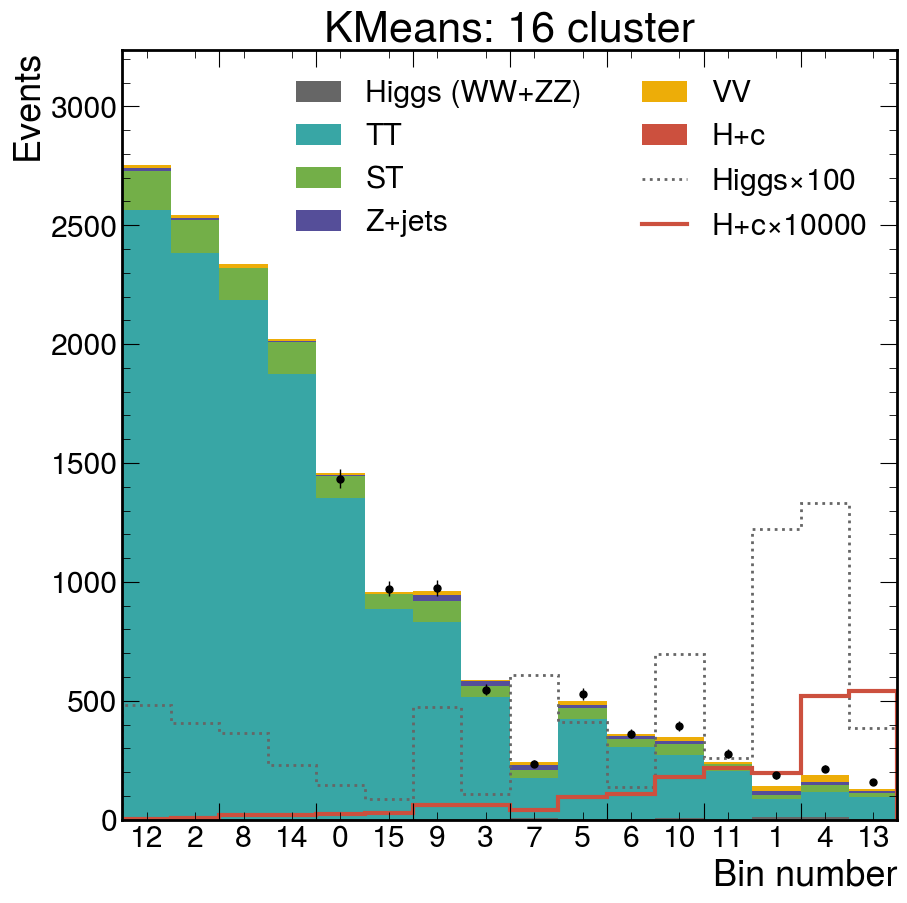

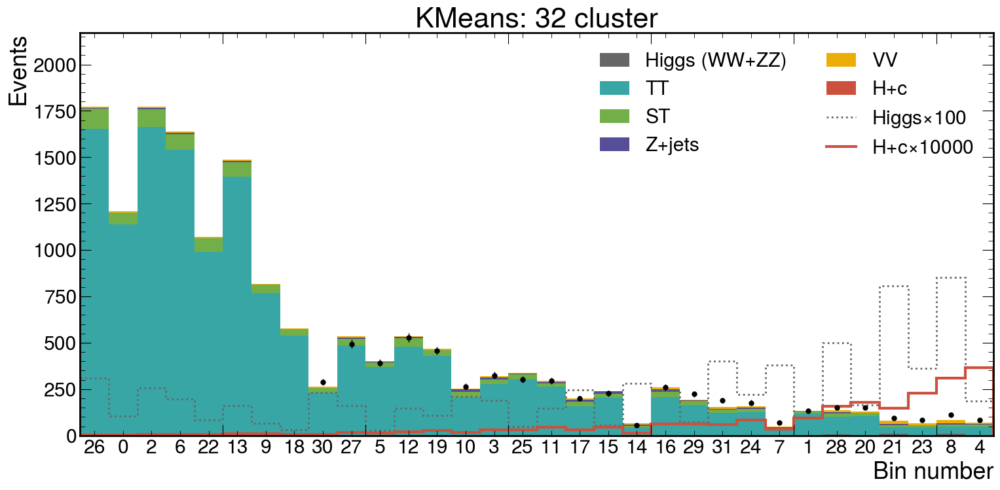

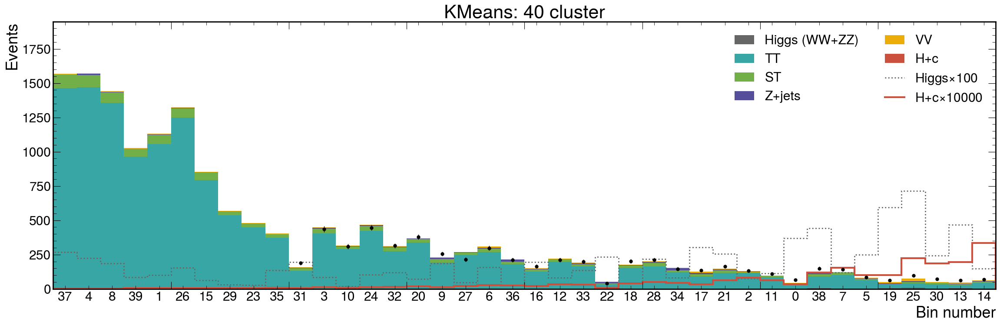

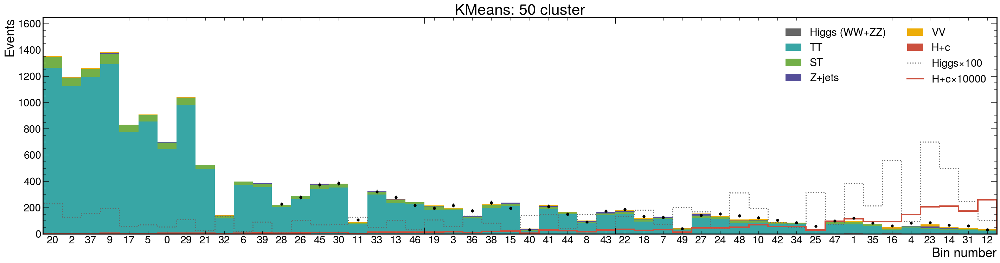

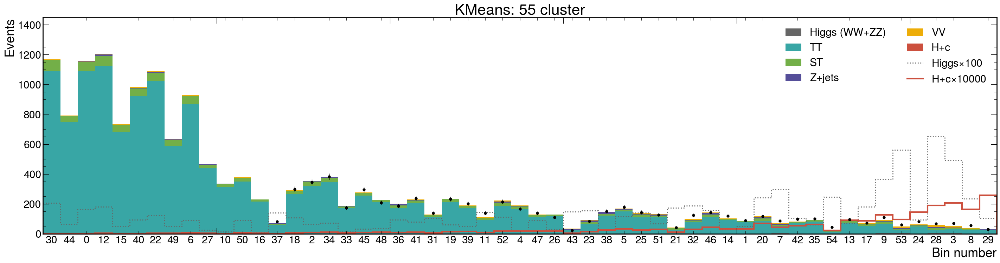

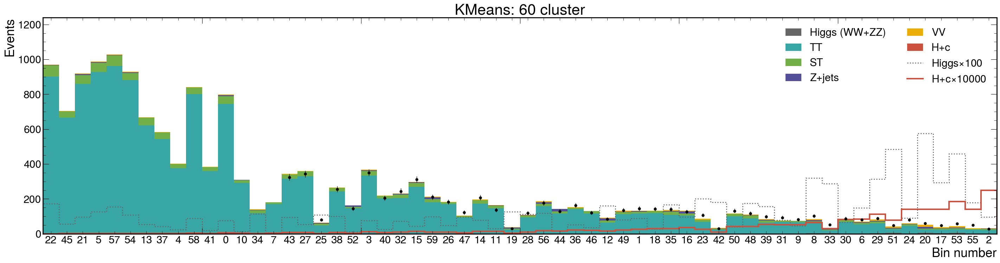

In [39]:
from joblib import load
import matplotlib.pyplot as plt
import mplhep as hep
import uproot
import numpy as np
plt.style.use(hep.style.ROOT)
import hist
import matplotlib.ticker as ticker

color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#666666","H+c":"#CC503E",'ggH':'gray'}
name_map={"TT":'ttbar',"ST":"st","Z+jets":"zjets","VV":'vv',"Higgs (WW+ZZ)":"higgs","H+c":"hc","data":"data_obs"}

index_map={}

for cat in n_clusters_list:
    kmeans = load(f'kmeans_model_UL17_{cat}_SR2.joblib')
    f=uproot.recreate(f"../card_maker/shape/2017_SR2_LM_template_bin{cat}_septrain_SR2_LM.root")
    clus_id={}
    for s in bdt_LM.keys():
        X_all=np.vstack([np.array(bdt_LM[s]),np.array(bdt_weihiggs[s])]).T
        clus_id[s]=kmeans.predict(X_all)

    weight_sum={}
#     weight_sig=np.array([np.sum(np.ones(len(clus_id["H+c"][clus_id["H+c"]==i]),dtype='float64')*weivar["H+c"][clus_id["H+c"]==i])/np.sum(np.ones(len(clus_id["Higgs (WW+ZZ)"][clus_id["Higgs (WW+ZZ)"]==i]),dtype='float64')*weivar["Higgs (WW+ZZ)"][clus_id["Higgs (WW+ZZ)"]==i]) for i in range(cat)])
    weight_bkg_sum=np.zeros(cat)
    for c in weivar.keys():
        if c=="H+c":continue
        weight_bkg_sum=np.array([np.sum(np.ones(len(clus_id[c][clus_id[c]==i]),dtype='float64')*weivar[c][clus_id[c]==i]) for i in range(cat)])+weight_bkg_sum

    weight_sig=np.array([np.sum(np.ones(len(clus_id["H+c"][clus_id["H+c"]==i]),dtype='float64')*weivar["H+c"][clus_id["H+c"]==i]) for i in range(cat)])
    # order by H+c yield
    index_map[cat]=http://127.0.0.1:8000/
#     hist={}
    for s in clus_id.keys():
        weight_sum[s]=np.zeros(cat)
        
        hist_index=list(map(lambda x:index_map[cat].index(x),clus_id[s]))
        h=hist.Hist(hist.axis.Integer(0,cat,name="bin",label='bin numbers'),hist.storage.Weight())
        weight=1.
        if s!='data':weight=weivar[s]
        h.fill(list(map(lambda x:index_map[cat].index(x),clus_id[s])),weight=weight)
        f[name_map[s]]=h
        for i in range(cat):
            if s!="data":weight=weivar[s][clus_id[s]==index_map[cat][i]]
            else:weight=1.
            
            weight_sum[s][i]=np.sum(np.ones(len(clus_id[s][clus_id[s]==index_map[cat][i]]),dtype='float64')*weight)

    if cat==20 or cat==25:fig, ax = plt.subplots(figsize=(16,8))

    elif  cat==30 or cat==32 or cat==28:fig, ax = plt.subplots(figsize=(18,8))
    elif cat==35 or cat==40:fig, ax = plt.subplots(figsize=(28,8))
    elif cat==45:fig, ax = plt.subplots(figsize=(32,8))

    elif cat>=50:fig, ax = plt.subplots(figsize=(35,8))
    else:fig, ax = plt.subplots()
    print(f.keys())
    hep.histplot([f[s] for s in f.keys() if 'data' not in s],stack=True,ax=ax,histtype='fill',color=[color_map[s]for s in weight_sum.keys() if 'data' not in s],label=[s for s in weight_sum.keys() if s!="data"])
    
    hep.histplot(f['higgs'].values()*100,f['hc'].axes[0].edges(),histtype='step',label="Higgs$\\times$100",ls=":",lw=2,color=color_map["Higgs (WW+ZZ)"])
    hep.histplot(f['hc'].values()*10000,f['hc'].axes[0].edges(),histtype='step',label="H+c$\\times$10000",lw=3,color=color_map["H+c"])
#     hep.histplot(f['data_obs'],histtype='errorbar')
#     hep.histplot([weight_sum[s] for s in weight_sum.keys() if s!="data"],np.arange(0,cat+1,1),label=[s for s in weight_sum.keys() if s!="data"],color=[color_map[s]for s in weight_sum.keys() if s!="data"],histtype='fill',stack=True,ax=ax)
#     hep.histplot(weight_sum["Higgs (WW+ZZ)"]*100,np.arange(0,cat+1,1),histtype='step',color=color_map["Higgs (WW+ZZ)"],label="Higgs (WW+ZZ)$\\times$100",lw=2)
#     hep.histplot(weight_sum["H+c"]*10000,np.arange(0,cat+1,1),histtype='step',color=color_map["H+c"],label="H+c $\\times$10000",lw=3,ls=":")

    
    ax.legend(ncols=2,loc='upper right')

    ax.set_ylim(0,np.amax(weight_sum["data"])*1.3)
    weight_sum['data'][-int(cat*0.25):]=np.nan
        hep.histplot(weight_sum['data'],np.arange(0,cat+1,1),yerr=True,histtype='errorbar',color='k',ax=ax,label='data')
        ax.set_xlim(0,cat)

    ax.set_xticklabels('')

    # Customize minor tick labels
#     print(np.arange(0,cat,1)+0.5)
    ax.set_xticks(np.arange(0,cat,1)+0.5,  index_map[cat],    minor=True)
#     ax.set_xticklabels(index_map[cat], minor=True)


    ax.set_title(f"KMeans: {cat} cluster")
    ax.set_ylabel("Events")
    ax.set_xlabel("Bin number")
    fig.savefig(f"UL17_kmeans_{cat}_rankhcbkg_SR2_all.pdf")


In [79]:
import matplotlib.pyplot as plt
import numpy as np
# fig,ax = plt.subplots()
hist,hist_old,hist_LM,hist_ggH,hist_weihiggs={},{},{},{},{}

for s in bdt.keys():
    if s=="data":continue
#     print(np.shape(bdt[s]),np.shape(bdt2[s]),np.shape(bdt2[s]),np.shape(bdt3[s]),len(weivar[s]))
    hist[s],egdges=np.histogram(bdt[s],bins=100,range=(np.amin(bdt[s]),np.amax(bdt[s])),weights=weivar[s])
    hist_old[s],egdges=np.histogram(bdt_old[s],bins=100,range=(np.amin(bdt_old[s]),np.amax(bdt_old[s])),weights=weivar[s])
    hist_LM[s],egdges=np.histogram(bdt_LM[s],bins=100,range=(np.amin(bdt_LM[s]),np.amax(bdt_LM[s])),weights=weivar[s])
    hist_ggH[s],egdges=np.histogram(bdt_ggH[s],bins=100,range=(np.amin(bdt_ggH[s]),np.amax(bdt_ggH[s])),weights=weivar[s])
    hist_weihiggs[s],egdges=np.histogram(bdt_weihiggs[s],bins=100,range=(np.amin(bdt_weihiggs[s]),np.amax(bdt_weihiggs[s])),weights=weivar[s])
    
#     hist2[s],egdges=np.histogram(bdt_old[s],bins=100,range=(np.amin(hist2[s][:,0]),np.amax(bdt_old[s])),weights=weivar[s])
#     hist2[s],egdges=np.histogram(bdt2[s][:,0],bins=100,range=(np.amin(bdt2[s][:,0]),np.amax(bdt2[s][:,2])),weights=weivar[s])
#     hist3[s],egdges=np.histogram(bdt3[s][:,5],bins=100,range=(np.amin(bdt3[s][:,5]),np.amax(bdt3[s][:,5])),weights=weivar[s])
    hist[s][hist[s]<0]=0
    hist_LM[s][hist_LM[s]<0]=0
    hist_old[s][hist_old[s]<0]=0
    hist_ggH[s][hist_ggH[s]<0]=0
    hist_weihiggs[s][hist_weihiggs[s]<0]=0

NameError: name 'bdt' is not defined

In [78]:
# tpr,fpr,=[],{}
# tpr2,fpr2=[],{}
# tpr3,fpr3=[],{}
pr,pr_old,pr_LM,pr_ggH,pr_weihiggs={},{},{},{},{}
for b in hist.keys():
    pr[b],pr_old[b],pr_LM[b],pr_ggH[b],pr_weihiggs[b] = [],[],[],[],[]
    for i in range(101):
        pr[b].append(np.sum(hist[b][:i])/np.sum(hist[b]))
        pr_old[b].append(np.sum(hist_old[b][:i])/np.sum(hist_old[b]))
        pr_LM[b].append(np.sum(hist_LM[b][:i])/np.sum(hist_LM[b]))
        pr_ggH[b].append(np.sum(hist_ggH[b][:i])/np.sum(hist_ggH[b]))
        pr_weihiggs[b].append(np.sum(hist_weihiggs[b][:i])/np.sum(hist_weihiggs[b]))
#         pr3[b].append(np.sum(hist3[b][:i])/np.sum(hist3[b]))
import matplotlib.pyplot as plt
import mplhep as hep

# color = ["#554e99","#38A6A5","#73AF48","#EDAD08","#CC503E","#666666"]#'#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
color = [
    "#1D6996",
    "#38A6A5",
    "#0F8554",
    "#73AF48",
    "#EDAD08",
    "#E17C05",
    "#CC503E",
    "#554e99",
    "#6f4e99",
    "#854e99",
    "#994e85",
    "#666666",
]
# color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#CC503E","H+c":"#666666",'ggH':'gray'}
# plt.style.use(hep.style.ROOT)

# fig,ax = plt.subplots(figsize=(10,10))
# # hep.cms.label(
# #         "Private work(CMS data/simulation)", data=True, loc=0, ax=ax,fontsize=24
# #     )
# for i,b in enumerate(pr.keys()):
   
# #     if b=="H+c" or b=="Z+jets" or b=="VV":continue
#     if b!="ggH" and b!="Higgs (WW+ZZ)" :continue
#     ax.plot(pr["H+c"],pr[b],label=b+" vs. allbkg",color=color_map[b],lw=2)
# #     ax.plot(pr_old["H+c"],pr_old[b],label=b+" higgs",color=color_map[b],alpha=0.5,lw=3)
#     ax.plot(pr_weihiggs["H+c"],pr_weihiggs[b],label=b+" vs. higgs",color=color_map[b],linestyle=':',lw=3)
#     ax.plot(pr_ggH["H+c"],pr_ggH[b],label=b+" vs. ggH",color=color_map[b],linestyle='--',lw=3)
# #     ax.plot(pr_LM["H+c"],pr_LM[b],label=b+" bkg",color=color_map[b],linestyle=':')
# # ax.plot([-1,-1.5,-2],[-1,-1.5,-2],label="old",color="k",lw=3)
# # ax.plot([-1,-1.5,-2],[-1,-1.5,-2],label="new",color="k",linestyle='-.',lw=3)
# # ax.plot([-1,-1.5,-2],[-1,-1.5,-2],label="6 classes",color="k",linestyle=':',lw=3)
# [1, 2, 3]
# from sklearn import metrics
# ax.legend(ncol=2) 
# # ax.set_xlim(-0.1,1.1)
# # ax.set_ylim(-0.1,1.1)
# # handles,labels=ax.get_legend_handles_labels()
a
# # print(handles,labels,len(handles))

# # ax.legend()
# # handle=[handles[0],handles[3],handles[6],handles[9],handles[12]]
# # # []
# # label=["Higgs (WW)","$t\\bar{t}$","Single Top","V+jets","Diboson"]
# # # ,]
# # # ax.legend(ncol=5,loc='upper center', bbox_to_anchor=(0.5, -0.1),
# # #           fancybox=True,handles=handle,labels=label)
# # first_legend =ax.legend(handles=[handles[15],handles[16],handles[17]],labels=[labels[15],labels[16],labels[17]], loc='lower right', bbox_to_anchor=(0.65,0.05))
# # ax.add_artist(first_legend)
# # ax.legend(handles=handle,labels=label,loc="lower right")
# at = AnchoredText("",  frameon=False,loc=2)
# ax.add_artist(at)
# ax.set_xlabel("Background efficiency")
# ax.set_ylabel("Signal(H+c) efficiency")
# hep.mpl_magic(ax=ax)

NameError: name 'hist' is not defined

21.963400107485423 22.69000279053266 14.364177005455016


Text(0, 1, 'FPR')

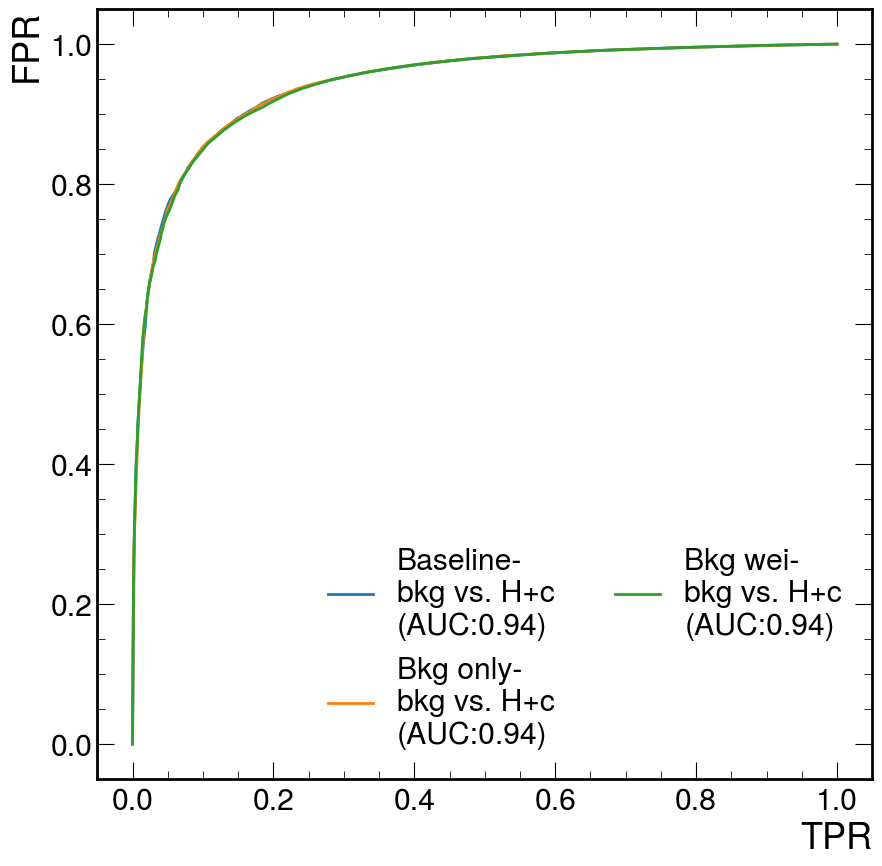

In [52]:
plt.style.use(hep.style.ROOT)
sum_hist, sum_LM_hist,sum_old_hist = np.zeros(100),np.zeros(100),np.zeros(100)
for b in hist.keys():
    if b == "H+c"  or "Higgs" in b:continue
    sum_hist=sum_hist+hist[b]
    sum_LM_hist=sum_LM_hist+hist_LM[b]
    sum_old_hist=sum_old_hist+hist_old[b]
# print(sum_hist,sum2_hist)
pr_sum,pr_LM_sum,pr_old_sum= np.zeros(101),np.zeros(101),np.zeros(101)
# for b in hist.keys():
#     pr[b],pr2[b],pr3[b] = [],[],[]
for i in range(101):
    pr_sum[i]=(np.sum(sum_hist[:i])/np.sum(sum_hist))
    pr_LM_sum[i]=(np.sum(sum_LM_hist[:i])/np.sum(sum_LM_hist))
    pr_old_sum[i]=(np.sum(sum_old_hist[:i])/np.sum(sum_old_hist))
#         pr3[b].append(np.sum(hist3[b][:i])/np.sum(hist3[b]))
# import matplotlib.pyplot as plt
# color = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
fig,ax = plt.subplots()
# for i,b in enumerate(pr.keys()):
#     if b=="H+c" or b=="vjets" :continue
from sklearn import metrics
ax.plot(pr["H+c"],pr['Higgs (WW+ZZ)'],label=f"Combined\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr['H+c'],pr['Higgs (WW+ZZ)']),2)})",lw=3,ls=':',color="tab:blue")
ax.plot(pr_LM["H+c"],pr_LM['Higgs (WW+ZZ)'],label=f"Combined\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr_LM['H+c'],pr_LM['Higgs (WW+ZZ)']),2)})",lw=3,ls=':',color="tab:orange")
ax.plot(pr_old["H+c"],pr_old['Higgs (WW+ZZ)'],label=f"Higgs vs. H+c\n(AUC:{round(metrics.auc(pr_old['H+c'],pr_old['Higgs (WW+ZZ)']),2)})",lw=3,ls=":")
ax.plot(pr["H+c"],pr_sum,label=f"bkg vs. H+c\n(AUC:{round(metrics.auc(pr['H+c'],pr_sum),2)})",lw=2,color='tab:blue')
ax.plot(pr_LM["H+c"],pr_LM_sum,label=f"bkg vs. H+c\n(AUC:{round(metrics.auc( pr_LM['H+c'],pr_LM_sum),2)})",lw=2,color="tab:orange")


print(np.sum(pr["H+c"]),np.sum(pr_LM["H+c"]),np.sum(pr_old["H+c"]))
#     ax.plot(pr2["H+c"],pr2[b],label=b+" 3 class",color=color[i],linestyle='-.')
# #     ax.plot(pr3["H+c"],pr3[b],label=b+" 6 class",color=color[i],linestyle=':')
# # ax.legend(ncol=6)
ax.legend(ncol=2)
# ax.legend(ncol=6,loc='upper center', bbox_to_anchor=(0.5, -0.1),
#           fancybox=True)
ax.set_xlabel("TPR")
ax.set_ylabel("FPR")



21.963400107485423 22.69000279053266 46.648090648059224


/tmp/ipykernel_4396/2809731814.py:18: RuntimeWarning: invalid value encountered in double_scalars
  pr_ggH_sum[i]=(np.sum(sum_ggH_hist[:i])/np.sum(sum_ggH_hist))
/tmp/ipykernel_4396/2809731814.py:19: RuntimeWarning: invalid value encountered in double_scalars
  pr_weihiggs_sum[i]=(np.sum(sum_weihiggs_hist[:i])/np.sum(sum_weihiggs_hist))


Text(0, 1, 'FPR')

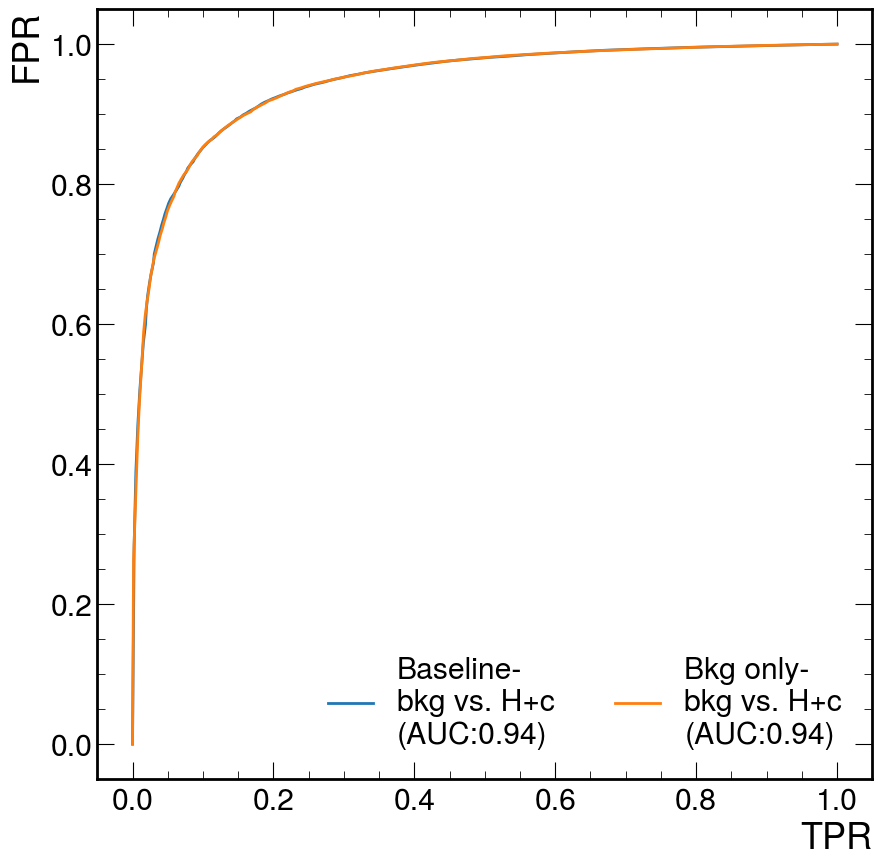

In [23]:
plt.style.use(hep.style.ROOT)
sum_hist, sum_LM_hist,sum_old_hist,sum_ggH_hist,sum_weihiggs_hist = np.zeros(100),np.zeros(100),np.zeros(100),np.zeros(100),np.zeros(100)
for b in hist.keys():
    if b == "H+c"  in b:continue
    sum_hist=sum_hist+hist[b]
    sum_LM_hist=sum_LM_hist+hist_LM[b]
    sum_old_hist=sum_old_hist+hist_old[b]
    sum_ggH=sum_ggH+hist_ggH[b]
    sum_weihiggs=sum_weihiggs+hist_weihiggs[b]
# print(sum_hist,sum2_hist)
pr_sum,pr_LM_sum,pr_old_sum,pr_ggH_sum,pr_weihiggs_sum= np.zeros(101),np.zeros(101),np.zeros(101),np.zeros(101),np.zeros(101)
# for b in hist.keys():
#     pr[b],pr2[b],pr3[b] = [],[],[]
for i in range(101):
    pr_sum[i]=(np.sum(sum_hist[:i])/np.sum(sum_hist))
    pr_LM_sum[i]=(np.sum(sum_LM_hist[:i])/np.sum(sum_LM_hist))
    pr_old_sum[i]=(np.sum(sum_old_hist[:i])/np.sum(sum_old_hist))
    pr_ggH_sum[i]=(np.sum(sum_ggH_hist[:i])/np.sum(sum_ggH_hist))
    pr_weihiggs_sum[i]=(np.sum(sum_weihiggs_hist[:i])/np.sum(sum_weihiggs_hist))
#         pr3[b].append(np.sum(hist3[b][:i])/np.sum(hist3[b]))
# import matplotlib.pyplot as plt
# color = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
fig,ax = plt.subplots()
# for i,b in enumerate(pr.keys()):
#     if b=="H+c" or b=="vjets" :continue
from sklearn import metrics
(AUC:{round(metrics.auc(pr['H+c'],pr_sum),2)}
ax.plot(pr["H+c"],pr_sum,label=f"Baseline-\nbkg vs. H+c\n(AUC:{round(metrics.auc(pr['H+c'],pr_sum),2)})",lw=2,color='tab:blue')
ax.plot(pr_LM["H+c"],pr_LM_sum,label=f"Bkg only-\nbkg vs. H+c\n(AUC:{round(metrics.auc( pr_LM['H+c'],pr_LM_sum),2)})",lw=2,color="tab:orange")


print(np.sum(pr["H+c"]),np.sum(pr_LM["H+c"]),np.sum(pr_old["H+c"]))
#     ax.plot(pr2["H+c"],pr2[b],label=b+" 3 class",color=color[i],linestyle='-.')
# #     ax.plot(pr3["H+c"],pr3[b],label=b+" 6 class",color=color[i],linestyle=':')
# # ax.legend(ncol=6)
ax.legend(ncol=2)
# ax.legend(ncol=6,loc='upper center', bbox_to_anchor=(0.5, -0.1),
#           fancybox=True)
ax.set_xlabel("TPR")
ax.set_ylabel("FPR")



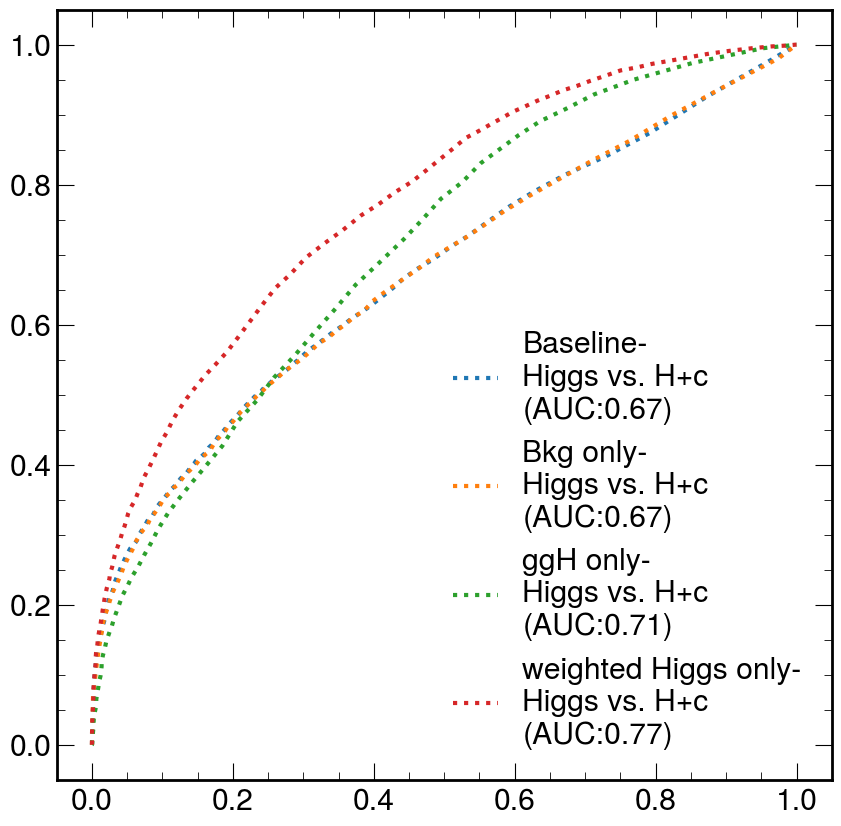

In [66]:
fig,ax = plt.subplots()

ax.plot(pr["H+c"],pr['Higgs (WW+ZZ)'],label=f"Baseline-\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr['H+c'],pr['Higgs (WW+ZZ)']),2)})",lw=3,ls=':')
ax.plot(pr_LM["H+c"],pr_LM['Higgs (WW+ZZ)'],label=f"Bkg only-\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr_LM['H+c'],pr_LM['Higgs (WW+ZZ)']),2)})",lw=3,ls=':')
# ax.plot(pr_old["H+c"],pr_old['Higgs (WW+ZZ)'],label=f"Higgs only-\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr_old['H+c'],pr_old['Higgs (WW+ZZ)']),2)})",lw=3,ls=":")
ax.plot(pr_ggH["H+c"],pr_ggH['Higgs (WW+ZZ)'],label=f"ggH only-\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr_ggH['H+c'],pr_ggH['Higgs (WW+ZZ)']),2)})",lw=3,ls=":")
ax.plot(pr_weihiggs["H+c"],pr_weihiggs['Higgs (WW+ZZ)'],label=f"weighted Higgs only-\nHiggs vs. H+c\n(AUC:{round(metrics.auc(pr_weihiggs['H+c'],pr_weihiggs['Higgs (WW+ZZ)']),2)})",lw=3,ls=":")
ax.legend()

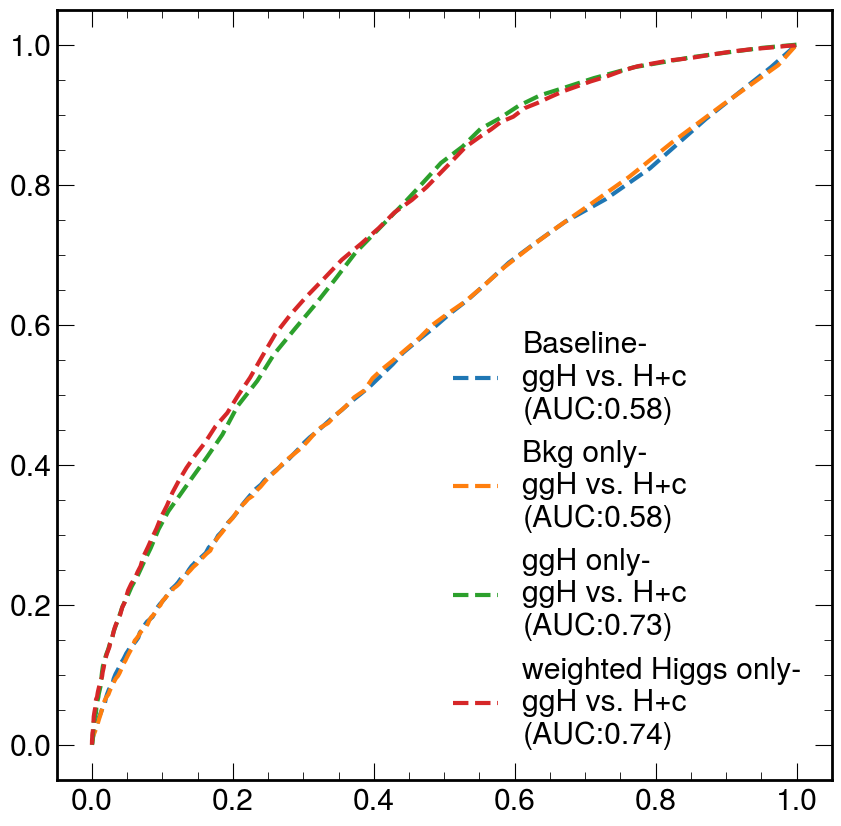

In [69]:
fig,ax = plt.subplots()

ax.plot(pr["H+c"],pr['ggH'],label=f"Baseline-\nggH vs. H+c\n(AUC:{round(metrics.auc(pr['H+c'],pr['ggH']),2)})",lw=3,ls='--')
ax.plot(pr_LM["H+c"],pr_LM['ggH'],label=f"Bkg only-\nggH vs. H+c\n(AUC:{round(metrics.auc(pr_LM['H+c'],pr_LM['ggH']),2)})",lw=3,ls='--')
# ax.plot(pr_old["H+c"],pr_old['ggH'],label=f"Higgs only-\nggH vs. H+c\n(AUC:{round(metrics.auc(pr_old['H+c'],pr_old['ggH']),2)})",lw=3,ls='--')
ax.plot(pr_ggH["H+c"],pr_ggH['ggH'],label=f"ggH only-\nggH vs. H+c\n(AUC:{round(metrics.auc(pr_ggH['H+c'],pr_ggH['ggH']),2)})",lw=3,ls='--')
ax.plot(pr_weihiggs["H+c"],pr_weihiggs['ggH'],label=f"weighted Higgs only-\nggH vs. H+c\n(AUC:{round(metrics.auc(pr_weihiggs['H+c'],pr_weihiggs['ggH']),2)})",lw=3,ls='--')
ax.legend()

50 50


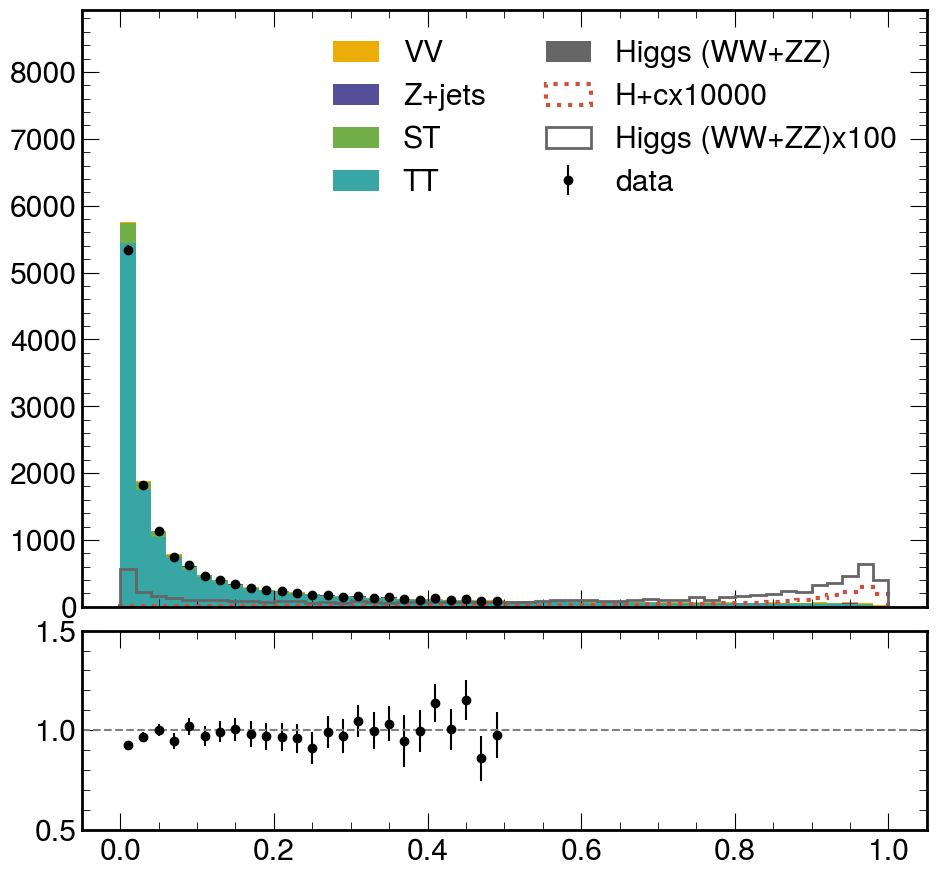

In [33]:
node=["H+c","Bkg"]
bdt_bkg=bdt_LM
plt.style.use(hep.style.ROOT)
for i in range(1):
    fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
    
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    weiN_bkg,bin_bkg,_= plt.hist(
            np.concatenate([bdt_bkg[s] for s in weivar.keys() if s!="H+c"and s!="data"]), 
            bins=50, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"]), 
        )

    
    sum_w2 = np.zeros([50], dtype=np.float32)  
    digits = np.digitize(np.concatenate([bdt_bkg[s] for s in weivar.keys() if s!="H+c"and s!="data"]), bin_bkg)  
    
    N_data,bin_data,_=plt.hist(
            bdt_bkg["data"], 
            bins=50, 
            range=(0,1.), 
            histtype='step',
            alpha=0.4,
            label="data",
            color="k"
        )
    w=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"])
    for bins in range(50):
        weights_in_current_bin = w[np.where(digits == bins)[0]]
        sum_w2[bins] = np.sum(np.power(weights_in_current_bin, 2))
    center = (bin_bkg[:-1] + bin_bkg[1:]) / 2
    yerrs_data = np.sqrt(N_data)
    yerrs_MC = np.sqrt(sum_w2)
    print(len(yerrs_MC),len(weiN_bkg))
    plt.cla()
    color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#666666","ggH":"#e17c05","H+c":"#CC503E"}
    ax.hist(
            [bdt_bkg[s] for s in weivar.keys() if s!="H+c" and  s!="data"], 
            bins=50, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=[weivar[s] for s in weivar.keys()if s!="H+c" and  s!="data"], 
            stacked=True,
            label=[s for s in weivar.keys()if s!="H+c" and  s!="data"],
            color=[color_map[s]  for s in weivar.keys()if s!="H+c" and  s!="data"]
        )
    if i<2:N_data[-25:]=np.nan
    else:N_data[:25]=np.nan
    ax.errorbar(
            center, 
            N_data, 
            yerr=yerrs_data, 
            linestyle='None', 
            color='black', 
            marker='o', 
            label='data'
        )
    ax.hist(bdt_bkg["H+c"], bins=50, 
            range=(0,1.), histtype='step',weights=weivar["H+c"]*10000,label="H+cx10000",lw=3,color=color_map["H+c"],linestyle=":")
    ax.hist(bdt_bkg["Higgs (WW+ZZ)"], bins=50, 
            range=(0,1.), histtype='step',weights=weivar["Higgs (WW+ZZ)"]*100,label="Higgs (WW+ZZ)x100",color=color_map["Higgs (WW+ZZ)"],lw=2)
    

    

    rax.errorbar(
            center, 
            N_data/weiN_bkg, 
            yerr=np.sqrt(yerrs_data**2/N_data**2+yerrs_MC**2/weiN_bkg**2), 
            linestyle='None', 
            color='black', 
    #        color='tab:cyan', 
            marker='o', 
        )
    ax.set_ylim(bottom=0.1)
    rax.set_ylim(0.5,1.5)

    ax.legend(ncols=2)
    at = AnchoredText("",  frameon=False,loc=2)
    ax.add_artist(at)
    rax.axhline(y=1, color="gray", linestyle="--")
    hep.mpl_magic(ax=ax)
#     fig.savefig("plot/training_0413/newnsv_2class_BDT_HIGGS_LM_fine_balanced.pdf")

50 50


/tmp/ipykernel_13223/362344564.py:73: RuntimeWarning: divide by zero encountered in divide
  yerr=np.sqrt(yerrs_data**2/N_data**2+yerrs_MC**2/weiN_bkg**2),


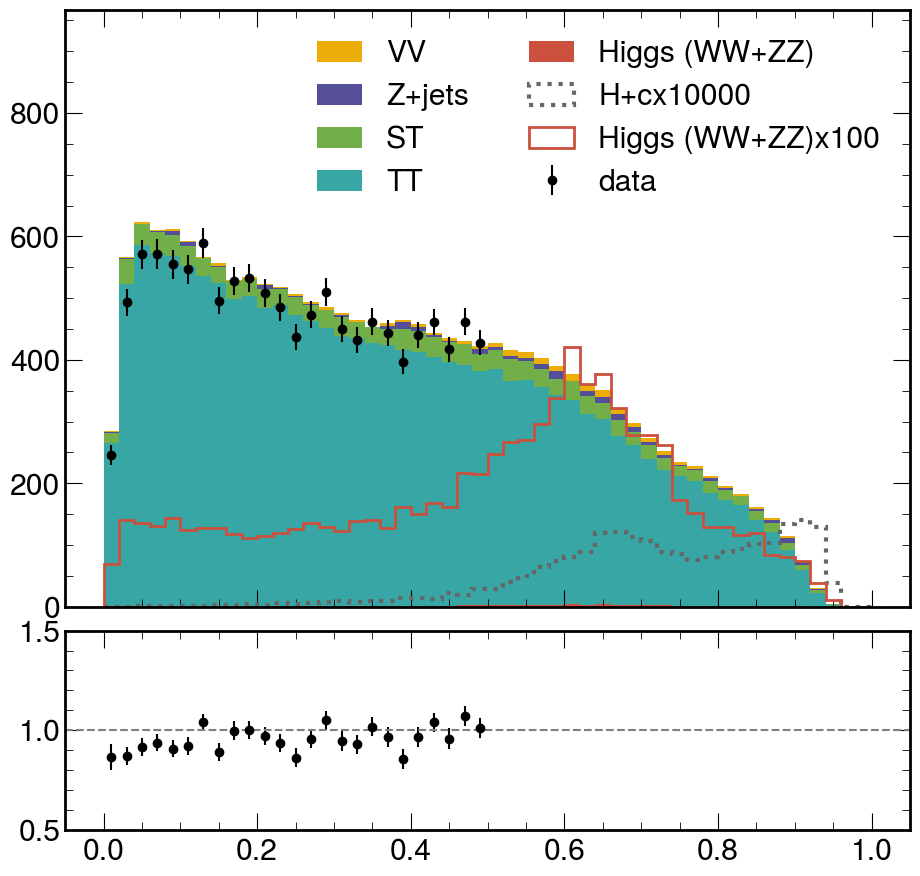

In [15]:
node=["H+c","Bkg"]
bdt_higgs=bdt_old
plt.style.use(hep.style.ROOT)
for i in range(1):
    fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
    
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    weiN_bkg,bin_bkg,_= plt.hist(
            np.concatenate([bdt_higgs[s] for s in weivar.keys() if s!="H+c"and s!="data"]), 
            bins=50, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"]), 
        )

    
    sum_w2 = np.zeros([50], dtype=np.float32)  
    digits = np.digitize(np.concatenate([bdt_higgs[s] for s in weivar.keys() if s!="H+c"and s!="data"]), bin_bkg)  
    
    N_data,bin_data,_=plt.hist(
            bdt_higgs["data"], 
            bins=50, 
            range=(0,1.), 
            histtype='step',
            alpha=0.4,
            label="data",
            color="k"
        )
    w=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"])
    for bins in range(50):
        weights_in_current_bin = w[np.where(digits == bins)[0]]
        sum_w2[bins] = np.sum(np.power(weights_in_current_bin, 2))
    center = (bin_bkg[:-1] + bin_bkg[1:]) / 2
    yerrs_data = np.sqrt(N_data)
    yerrs_MC = np.sqrt(sum_w2)
    print(len(yerrs_MC),len(weiN_bkg))
    plt.cla()
    color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#CC503E","ggH":"#e17c05","H+c":"#666666"}
    ax.hist(
            [bdt_higgs[s] for s in weivar.keys() if s!="H+c" and  s!="data"], 
            bins=50, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=[weivar[s] for s in weivar.keys()if s!="H+c" and  s!="data"], 
            stacked=True,
            label=[s for s in weivar.keys()if s!="H+c" and  s!="data"],
            color=[color_map[s]  for s in weivar.keys()if s!="H+c" and  s!="data"]
        )
    if i<2:N_data[-25:]=np.nan
    else:N_data[:25]=np.nan
    ax.errorbar(
            center, 
            N_data, 
            yerr=yerrs_data, 
            linestyle='None', 
            color='black', 
            marker='o', 
            label='data'
        )
    ax.hist(bdt_higgs["H+c"], bins=50, 
            range=(0,1.), histtype='step',weights=weivar["H+c"]*10000,label="H+cx10000",lw=3,color=color_map["H+c"],linestyle=":")
    ax.hist(bdt_higgs["Higgs (WW+ZZ)"], bins=50, 
            range=(0,1.), histtype='step',weights=weivar["Higgs (WW+ZZ)"]*100,label="Higgs (WW+ZZ)x100",color=color_map["Higgs (WW+ZZ)"],lw=2)
    

    

    rax.errorbar(
            center, 
            N_data/weiN_bkg, 
            yerr=np.sqrt(yerrs_data**2/N_data**2+yerrs_MC**2/weiN_bkg**2), 
            linestyle='None', 
            color='black', 
    #        color='tab:cyan', 
            marker='o', 
        )
    ax.set_ylim(bottom=0.1)
    rax.set_ylim(0.5,1.5)

    ax.legend(ncols=2)
    at = AnchoredText("",  frameon=False,loc=2)
    ax.add_artist(at)
    rax.axhline(y=1, color="gray", linestyle="--")
    hep.mpl_magic(ax=ax)
    fig.savefig("plot/training_0413/newnsv_2class_BDT_HIGGS_LM_balanced.pdf")

NameError: name 'weivar' is not defined

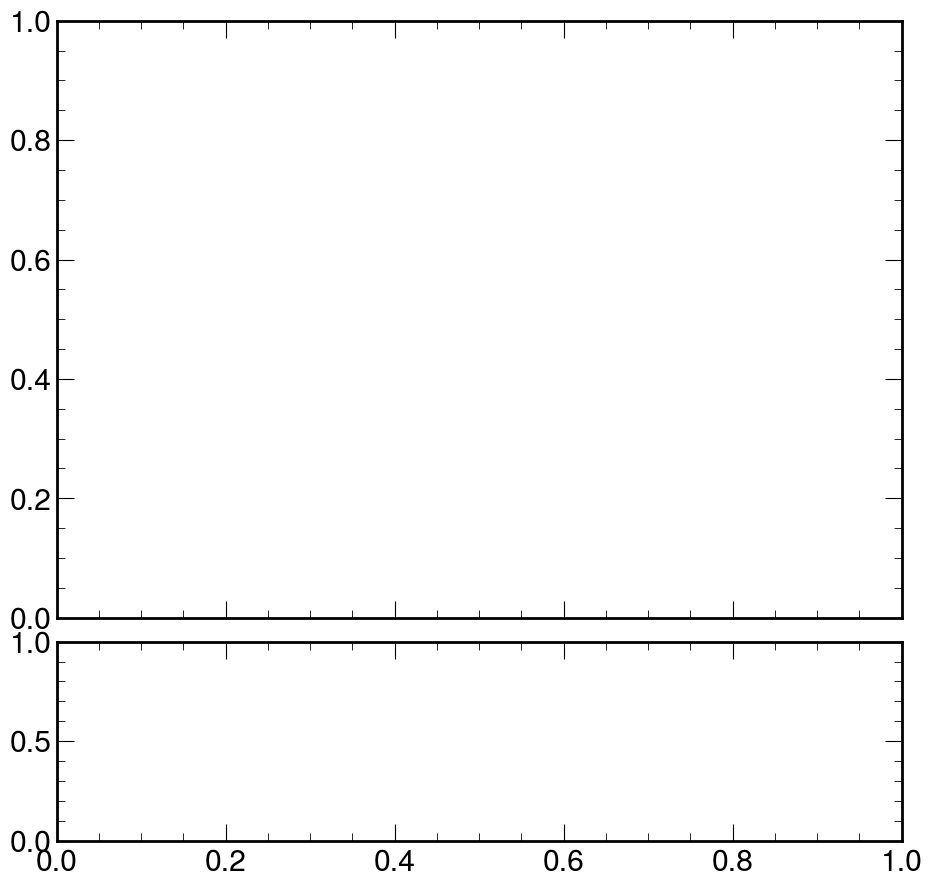

In [12]:
node=["H+c","Bkg"]
plt.style.use(hep.style.ROOT)
for i in range(1):
    fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
    
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    weiN_bkg,bin_bkg,_= plt.hist(
            np.concatenate([bdt[s] for s in weivar.keys() if s!="H+c"and s!="data"]), 
            bins=100, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"]), 
        )

    
    sum_w2 = np.zeros([100], dtype=np.float32)  
    digits = np.digitize(np.concatenate([bdt[s] for s in weivar.keys() if s!="H+c"and s!="data"]), bin_bkg)  
    
    N_data,bin_data,_=plt.hist(
            bdt["data"], 
            bins=100, 
            range=(0,1.), 
            histtype='step',
            alpha=0.4,
            label="data",
            color="k"
        )
    w=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"])
    for bins in range(100):
        weights_in_current_bin = w[np.where(digits == bins)[0]]
        sum_w2[bins] = np.sum(np.power(weights_in_current_bin, 2))
    center = (bin_bkg[:-1] + bin_bkg[1:]) / 2
    yerrs_data = np.sqrt(N_data)
    yerrs_MC = np.sqrt(sum_w2)
    print(len(yerrs_MC),len(weiN_bkg))
    plt.cla()
    color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#CC503E","Higgs (ZZ)":"#e17c05","H+c":"#666666"}
    ax.hist(
            [bdt[s] for s in weivar.keys() if s!="H+c" and  s!="data"], 
            bins=100, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=[weivar[s] for s in weivar.keys()if s!="H+c" and  s!="data"], 
            stacked=True,
            label=[s for s in weivar.keys()if s!="H+c" and  s!="data"],
            color=[color_map[s]  for s in weivar.keys()if s!="H+c" and  s!="data"]
        )
    if i<2:N_data[-25:]=np.nan
    else:N_data[:25]=np.nan
    ax.errorbar(
            center, 
            N_data, 
            yerr=yerrs_data, 
            linestyle='None', 
            color='black', 
            marker='o', 
            label='data'
        )
    ax.hist(bdt["H+c"], bins=100, 
            range=(0,1.), histtype='step',weights=weivar["H+c"]*10000,label="H+cx10000",lw=3,color=color_map["H+c"],linestyle=":")
    ax.hist(bdt["Higgs (WW+ZZ)"], bins=100, 
            range=(0,1.), histtype='step',weights=weivar["Higgs (WW+ZZ)"]*100,label="Higgs (WW+ZZ)x100",color=color_map["Higgs (WW+ZZ)"],lw=2)
    

    

    rax.errorbar(
            center, 
            N_data/weiN_bkg, 
            yerr=np.sqrt(yerrs_data**2/N_data**2+yerrs_MC**2/weiN_bkg**2), 
            linestyle='None', 
            color='black', 
    #        color='tab:cyan', 
            marker='o', 
        )
    ax.set_ylim(bottom=0.1)
    rax.set_ylim(0.5,1.5)

    ax.legend(ncols=2)
    at = AnchoredText("",  frameon=False,loc=2)
    ax.add_artist(at)
    rax.axhline(y=1, color="gray", linestyle="--")
    hep.mpl_magic(ax=ax)
    fig.savefig("plot/training_0413/newnsv_2class_BDT_LM_fine_balanced.pdf")

50 50


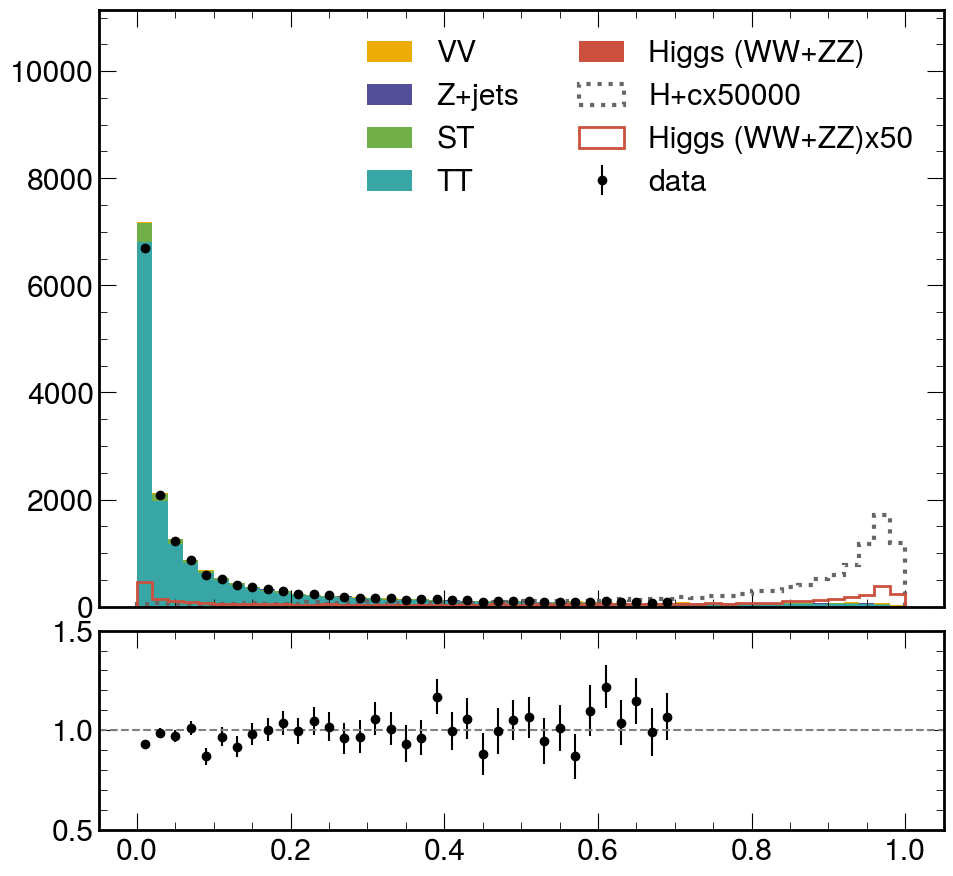

In [36]:
node=["H+c","Bkg"]
plt.style.use(hep.style.ROOT)
for i in range(1):
    fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
    
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    weiN_bkg,bin_bkg,_= plt.hist(
            np.concatenate([bdt[s] for s in weivar.keys() if s!="H+c"and s!="data"]), 
            bins=50, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"]), 
        )

    
    sum_w2 = np.zeros([50], dtype=np.float32)  
    digits = np.digitize(np.concatenate([bdt[s] for s in weivar.keys() if s!="H+c"and s!="data"]), bin_bkg)  
    
    N_data,bin_data,_=plt.hist(
            bdt["data"], 
            bins=50, 
            range=(0,1.), 
            histtype='step',
            alpha=0.4,
            label="data",
            color="k"
        )
    w=np.concatenate([weivar[s] for s in weivar.keys()if s!="H+c"])
    for bins in range(50):
        weights_in_current_bin = w[np.where(digits == bins)[0]]
        sum_w2[bins] = np.sum(np.power(weights_in_current_bin, 2))
    center = (bin_bkg[:-1] + bin_bkg[1:]) / 2
    yerrs_data = np.sqrt(N_data)
    yerrs_MC = np.sqrt(sum_w2)
    print(len(yerrs_MC),len(weiN_bkg))
    plt.cla()
    color_map={"TT":"#38A6A5","ST":"#73AF48","VV":"#EDAD08","Z+jets":"#554e99","Higgs (WW+ZZ)":"#CC503E","Higgs (ZZ)":"#e17c05","H+c":"#666666"}
    ax.hist(
            [bdt[s] for s in weivar.keys() if s!="H+c" and  s!="data"], 
            bins=50, 
            range=(0,1.), 
            histtype='stepfilled', 
            weights=[weivar[s] for s in weivar.keys()if s!="H+c" and  s!="data"], 
            stacked=True,
            label=[s for s in weivar.keys()if s!="H+c" and  s!="data"],
            color=[color_map[s]  for s in weivar.keys()if s!="H+c" and  s!="data"]
        )
    if i<2:N_data[-15:]=np.nan
    else:N_data[:15]=np.nan
    ax.errorbar(
            center, 
            N_data, 
            yerr=yerrs_data, 
            linestyle='None', 
            color='black', 
            marker='o', 
            label='data'
        )
    ax.hist(bdt["H+c"], bins=50, 
            range=(0,1.), histtype='step',weights=weivar["H+c"]*50000,label="H+cx50000",lw=3,color=color_map["H+c"],linestyle=":")
    ax.hist(bdt["Higgs (WW+ZZ)"], bins=50, 
            range=(0,1.), histtype='step',weights=weivar["Higgs (WW+ZZ)"]*50,label="Higgs (WW+ZZ)x50",color=color_map["Higgs (WW+ZZ)"],lw=2)
    

    

    rax.errorbar(
            center, 
            N_data/weiN_bkg, 
            yerr=np.sqrt(yerrs_data**2/N_data**2+yerrs_MC**2/weiN_bkg**2), 
            linestyle='None', 
            color='black', 
    #        color='tab:cyan', 
            marker='o', 
        )
    ax.set_ylim(bottom=0.1)
    rax.set_ylim(0.5,1.5)

    ax.legend(ncols=2)
    at = AnchoredText("",  frameon=False,loc=2)
    ax.add_artist(at)
    rax.axhline(y=1, color="gray", linestyle="--")
    hep.mpl_magic(ax=ax)
    fig.savefig("plot/training_0413/nsv_2class_BDT_LM_balance_bin50.pdf")
#     ax.set_ylim(bottom)
#     ax.semilogyx()

In [14]:
import uproot,hist
map_name={"data":'data_obs','Higgs (WW+ZZ)':'higgs',"TT":"ttbar","ST":'st',"Z+jets":'zjets','VV':'vv',"H+c":'hc'}

for i in range(3):
    node=["H+c","HWW","Bkg"]
    f= uproot.recreate(f"3class_SR2_BDT_emu_0403_class{node[i]}_wide.root")
    for s in bdt.keys():
        h = hist.Hist(hist.axis.Regular(50, 0, 1., name="BDT", label="discr"),
            hist.storage.Weight()
        )
        masks = (MCvar['nselj'][s]==1)#&(MCvar['ll_mass'][s]<75)
#         masks=MCvar['ll_mass'][s]<75
        if s =='data': h.fill(BDT=bdt2[s][:,0][(np.argmax(bdt2[s],axis=1)==i)&masks])
        else:h.fill(BDT=bdt2[s][:,0][(np.argmax(bdt2[s],axis=1)==i)&masks],weight=weivar[s][(np.argmax(bdt2[s],axis=1)==i)&masks])
        f[map_name[s]] = h


In [23]:
MCvar_HM={}
weivar_HM={}
for var in trainvar :
    MCbkgHM= []
    MCvar_HM[var]={}
    for m in mergemap:
        tmpml,tmpwei=[],[]
        for ml in mergemap[m]:
            if len(collect_var[ml]['SR_HM'].keys())==0:continue
            tmpml=np.concatenate((tmpml,collect_var[ml]['SR_HM'][var])) 
            
            tmpwei=np.concatenate((tmpwei,collect_var[ml]['SR_HM']['mcwei']*collect_var[ml]['SR_HM']['weight'])) 
        MCvar_HM[var][m]=tmpml
        weivar_HM[m]=tmpwei
        MCbkgHM+=[tmpml]
    MCvar_HM[var]["H+c"]=collect_var['gchcWW2L2Nu_4f']['SR_HM'][var]
    weivar_HM["H+c"]=collect_var['gchcWW2L2Nu_4f']['SR_HM']["mcwei"]*collect_var['gchcWW2L2Nu_4f']['SR_HM']["weight"]


datavars_HM={}

for var in trainvar: 
    datavars_HM[var]=np.hstack([data_var[s]['SR_HM'][var] for s in data_var.keys() ]) 

## Get template

In [1]:
import uproot

import matplotlib.pyplot as plt
import mplhep as hep
plt.style.use(hep.style.ROOT)
from BTVNanoCommissioning.utils.xs_scaler import collate
from BTVNanoCommissioning.utils.plot_utils import load_coffea
import numpy as np
from matplotlib.offsetbox import AnchoredText
import matplotlib.pyplot as plt, mplhep as hep
%load_ext autoreload
%autoreload 2
from BTVNanoCommissioning.helpers.xsection import xsection

from BTVNanoCommissioning.utils.plot_utils import (
    isin_dict,
    check_config,
    load_coffea,
    load_default,
    rebin_and_xlabel,
    plotratio,
    errband_opts,
    autoranger,
    rebin_hist
)
import numpy as np

In [2]:
sumw = {}
scales={}
# lumi=16800 #41500#19500 #16800 # #19500  #16800 #19500 
collect_var={}
lumi=19500
data=load_coffea({"input":"data_newCR_preVFP_UL16_v01/*.coffea"},False)
output=load_coffea({"input":"MC_newCR_preVFP_UL16_v01/*.coffea","lumi":lumi},True)
tautau=load_coffea({"input":"MC_newCR_preVFP_UL16_v02/*.coffea","lumi":lumi},True)
# output=load_coffea({"input":"MC_cluster_UL17_v01//*.coffea","lumi":lumi},True)
year="2016_preVFP"
for s in data.keys(): output[s]=data[s]
for s in tautau.keys(): 
    output[s]=tautau[s]

In [3]:
mergemap={
    'ttbar':['TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8', 'TTTo2L2Nu_TuneCP5_13TeV-powheg-pythia8'],
    'st':['ST_t-channel_antitop_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8', 'ST_tW_antitop_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8', 'ST_t-channel_top_4f_InclusiveDecays_TuneCP5_13TeV-powheg-madspin-pythia8', 'ST_tW_top_5f_inclusiveDecays_TuneCP5_13TeV-powheg-pythia8', 'ST_s-channel_4f_leptonDecays_TuneCP5_13TeV-amcatnlo-pythia8'],
    "zjets":['DYJetsToLL_M-50_TuneCP5_13TeV-amcatnloFXFX-pythia8', 'DYJetsToLL_M-10to50_TuneCP5_13TeV-madgraphMLM-pythia8'],#, 'DYJetsToTauTauToMuTauh_M-50_TuneCP5_13TeV-madgraphMLM-pythia8'],
    
    'vv':['WZ_TuneCP5_13TeV-pythia8', 'WW_TuneCP5_13TeV-pythia8', 'ZZ_TuneCP5_13TeV-pythia8'],
    "ggH_hww":['GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8'],
    'qqH_hww':['VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8'],
    'VH_hww':['HWplusJ_HToWWTo2L2Nu_WTo2L_M-125_TuneCP5_13TeV-powheg-pythia8', 'HWminusJ_HToWW_M-125_TuneCP5_13TeV-powheg-jhu:gen727-pythia8','HZJ_HToWWTo2L2Nu_ZTo2L_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8','GluGluZH_HToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-pythia8'],
    'ttH_hww':['ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8'],
    'ggH_htautau':[ 'GluGluHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8'],
    'qqH_htautau':['VBFHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8'],
    'VH_htautau':[ 'WminusHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8', 'WplusHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8', 'ZHToTauTau_M125_CP5_13TeV-powheg-pythia8_ext1'],
    'ttH_htautau':['ttHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8'],
    # 'ggH_hzz':['GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8'],
    # 'qqH_hzz':['VBF_HToZZTo4L_M125_TuneCP5_withDipoleRecoil_13TeV-powheg2-jhugenv7011-pythia8'],
    'higgs':['GluGluHToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8','VBFHToWWTo2L2Nu_M125_TuneCP5_13TeV_powheg2_JHUGenV714_pythia8',
             'HWplusJ_HToWWTo2L2Nu_WTo2L_M-125_TuneCP5_13TeV-powheg-pythia8', 'HWminusJ_HToWW_M-125_TuneCP5_13TeV-powheg-jhu:gen727-pythia8',
            'HZJ_HToWWTo2L2Nu_ZTo2L_M-125_TuneCP5_13TeV-powheg-jhugen727-pythia8','GluGluZH_HToWWTo2L2Nu_M-125_TuneCP5_13TeV-powheg-pythia8',
            'ttHToNonbb_M125_TuneCP5_13TeV-powheg-pythia8','GluGluHToZZTo4L_M125_TuneCP5_13TeV_powheg2_JHUGenV7011_pythia8',
             'VBF_HToZZTo4L_M125_TuneCP5_withDipoleRecoil_13TeV-powheg2-jhugenv7011-pythia8',"HPlusBottom_5FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8",
             "HPlusBottom_5FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8",
             'GluGluHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8', 'VBFHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8', 
             'WminusHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8', 'WplusHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8', 'ZHToTauTau_M125_CP5_13TeV-powheg-pythia8_ext1', 
             'ttHToTauTau_M125_TuneCP5_13TeV-powheg-pythia8'
            ],
    "hc":["HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8"],
    # "hc_up":["HPlusCharm_4FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnlo-pythia8"],
    # "hc_dn":["HPlusCharm_3FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnlo-pythia8"],
    "hb" :["HPlusBottom_5FS_MuRFScaleDynX0p50_HToWWTo2L2Nu_M125_TuneCP5_13TeV-amcatnloFXFX-pythia8"],
    "data_obs":
        ["MuonEGRun2016B-ver1_HIPM_UL2016_MiniAODv2_NanoAODv9-v2", "MuonEGRun2016B-ver2_HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016C-HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016D-HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016E-HIPM_UL2016_MiniAODv2_NanoAODv9-v2","MuonEGRun2016F-HIPM_UL2016_MiniAODv2_NanoAODv9-v2"]
    # ["MuonEGRun2016F-UL2016_MiniAODv2_NanoAODv9-v1","MuonEGRun2016G-UL2016_MiniAODv2_NanoAODv9-v1","MuonEGRun2016H-UL2016_MiniAODv2_NanoAODv9-v1"]
    # [ "MuonEGRun2017B-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017C-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017D-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017F-UL2017_MiniAODv2_NanoAODv9-v1","MuonEGRun2017E-UL2017_MiniAODv2_NanoAODv9-v1",]
    # ["MuonEGRun2018A-UL2018_MiniAODv2_NanoAODv9-v1","MuonEGRun2018B-UL2018_MiniAODv2_NanoAODv9-v1","MuonEGRun2018C-UL2018_MiniAODv2_NanoAODv9-v1","MuonEGRun2018D-UL2018_MiniAODv2_NanoAODv9-v1"]
}
collated=collate(output,mergemap)

In [4]:
# syst_list={'scalevar_3pt':"scale_muRmuF"}
syst_list={

'ttbar_weight':"pt_weight",
     'UEPS_FSR':"UEPS_FSR",
 'UEPS_ISR':"UEPS_ISR",
     'PDF_weight':"PDF",
 # 'PDFaS_weight':"",
    "HLT_2017":"CMS_eff_HLT_2017",
 'ele_ID_2017':"CMS_eff_e_ID_2017",
 'mu_Iso_2017':"CMS_eff_m_Iso_2017",
 'puweight_2017':'CMS_pileup_2017',
 'mu_ID_2017':"CMS_eff_m_ID_2017",
 'ele_Reco_2017':"CMS_eff_e_Reco_2017",
 'mu_Reco_2017':"CMS_eff_m_Reco_2017",
  # 'aS_weight',
 'L1prefireweight':"CMS_L1prefireweight",
 'DeepJetC_Interp':"CMS_eff_c_DeepJetC_Interp",
 'scalevar':"scale_muRmuF",
 'DeepJetC_PSWeightISR':"CMS_eff_c_DeepJetC_PSWeightISR",
 'DeepJetC_jesTotal':"CMS_eff_c_DeepJetC_jesTotal",
 'DeepJetC_Stat_2017':"CMS_eff_c_DeepJetC_Stat_2017",
 'DeepJetC_PSWeightFSR':"CMS_eff_c_DeepJetC_PSWeightFSR",
 'DeepJetC_XSec_BRUnc_WJets_c':"CMS_eff_c_DeepJetC_XSec_BRUnc_WJets_c",
 'DeepJetC_XSec_BRUnc_DYJets_b':"CMS_eff_c_DeepJetC_XSec_BRUnc_DYJets_b",
 'DeepJetC_XSec_BRUnc_DYJets_c':"CMS_eff_c_DeepJetC_XSec_BRUnc_DYJets_c", 
 'DeepJetC_Extrap':'CMS_eff_c_DeepJetC_Extrap',
 'DeepJetC_LHEScaleWeight_muR':'CMS_eff_c_DeepJetC_LHEScaleWeight_muR',
 'DeepJetC_PUWeight':'CMS_eff_c_DeepJetC_PUWeight',
 'DeepJetC_jer':'CMS_eff_c_DeepJetC_jer',
 'DeepJetC_LHEScaleWeight_muF':'CMS_eff_c_DeepJetC_LHEScaleWeight_muF',
"JES_FlavorQCD":'CMS_scale_j_FlavorQCD',
"JES_RelativeBal":'CMS_scale_j_RelativeBal',
"JES_HF":'CMS_scale_j_HF',
"JES_BBEC1":'CMS_scale_j_BBEC1',
"JES_EC2":'CMS_scale_j_EC2',
"JES_Absolute":'CMS_scale_j_Absolute',
    # "JES_jes",
"JES_Absolute_2017":'CMS_scale_j_Absolute_2017',
"JES_HF_2017":'CMS_scale_j_HF_2017',
"JES_EC2_2017":"CMS_scale_j_EC2_2017",
"JES_RelativeSample_2017":"CMS_scale_j_RelativeSample_2017",
"JES_BBEC1_2017":'CMS_scale_j_BBEC1_2017',
 # 'JES_2017',
 'UES_2017':'CMS_scale_met_2017',
 'JER_2017':'CMS_res_j_2017'}
# syst_list=["HLT"]
# corr_sys=[]
axes={'flav':sum,'lepflav':'emu'}
var={
    'top_CR_1j':"template_mTh",
     'top_CR_nj':"template_mTh",
     'HM_CR_1j':"template_BDT_SR_HM",
     'HM_CR_nj':"template_BDT_SR_HM",
    'SR_LM':"template_BDT_SR_LM",
    'SR2_LM':"template_BDT_SR2_LM",
    'SR_LM_1D':"template_BDT_SR_LM_1D",
    'SR2_LM_1D':"template_BDT_SR2_LM_1D"
}
# var={'SR_LM':"template_BDT_SR_LM",'SR_LM_1D':"template_BDT_SR_LM_1D"}
# var={'top_CR_1j':"template_mTh"}
# var={'SR_HM':"template_BDT_SR_HM"}
# var={'top_CR_lowmT':"temautorangerplate_mTh",'SR_HM':"template_BDT_SR_HM",'SR_LM':"template_BDT_SR_LM",'SR2_LM':"template_BDT_SR2_LM",'SR_LM_1D':"template_BDT_SR_LM_1D",'SR2_LM_1D':"template_BDT_SR2_LM_1D"}
# var={'SR_LM_1D':"template_BDT_SR_LM_1D",'SR2_LM_1D':"template_BDT_SR2_LM_1D"}
color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

In [ ]:
import hist
import mplhep as hep
import uproot 

for r in var.keys():
    root_out=uproot.recreate(f"../card_maker/shape/{year}_{r}_{var[r]}_updated.root")
    # print(f"../card_maker/shape/{year}_{r}_{var[r]}_0703_newBDT_Hb.root")
    for s in collated.keys():
        
        if "hc_up" ==s or "hc_dn"==s:continue
        axes['syst']='nominal'
        axes['region']=r.replace("_1D","")
        
        print(s,r)
        
        # rebinhist=rebin_hist(collated[s][var[r]][axes],collated[s][var[r]][axes].axes[0].name,[min(collated[s][var[r]].axes[-1].edges),max(collated[s][var[r]].axes[-1].edges)])
      
        syst_list_in_file=[collated['ttbar'][var[r]].axes[0].value(i) for i in range(1,collated['ttbar'][var[r]].axes[0].size)]
        syst_list_in_f=[collated[s][var[r]].axes[0].value(i) for i in range(0,collated[s][var[r]].axes[0].size)]
        if 'nominal' not in syst_list_in_f: 
            empty = collated['data_obs'][var[r]][axes]
            empty[:] = [(0.,0.) for i in range(len(empty.values()))]
            root_out[s]=empty
        else:
            root_out[s]=collated[s][var[r]][axes]
        if s!="data_obs":
            
            
            for sys in syst_list.keys():
                
                syst_new = syst_list[sys]
                prefix = "_13TeV"
                # if "JES_2017"==sys or "JER_2017" == sys or "UES_2017" == sys: 
                if "JER_2017" == sys or "UES_2017" == sys: 
                    sys=sys.replace("_2017","")
                    syst_new = syst_new.replace("_2017","")
                    prefix = "_"+year.replace("_preVFP","").replace("_postVFP","")+prefix
                if sys.endswith("2017"):
                    sys= sys.replace("2017",year)
                    syst_new = syst_new.replace("2017",year)
                if "2018" in year and sys =="L1prefireweight" : continue
                for v in ["Up","Down"]:
                    
                    if ("JES" in sys)and "2016" in year:
                        sys = sys.replace("_preVFP","").replace("_postVFP","")
                        syst_new = syst_new.replace("_preVFP","").replace("_postVFP","")
                        axes['syst']=sys+v

                    elif "JES" not in sys and sys.endswith(year): axes['syst']=sys[:sys.find(year)-1]+v
                    else:axes['syst']=sys+v
                    if 'ttbar_' in sys: continue    
                   
                    if axes['syst'] not in syst_list_in_f and 'scalevar' != sys:
                        print(s,syst_new,v)
                        print(collated[s][var[r]].axes[0])
                        if (v == "Up" and  axes['syst'].replace("Up","Down") not in  syst_list_in_f) or \
                        (v == "Down" and  axes['syst'].replace("Down","Up") not in  syst_list_in_f) or collated[s][var[r]].axes[0].size==0:
                            print("empty!!")
                            axes['syst'] = 'nominal'
                            empty = collated['data_obs'][var[r]][axes]
                            empty[:] = [(1e-9,1e-9) for i in range(len(empty.values()))]
                            if 'UEPS' in sys or 'scalevar_3pt' == sys:
                                root_out[f'{s}_{syst_new}_{s}{prefix}{v}']=empty
                                # print(f'{s}_{syst_new.replace("_preVFP","").replace("_postVFP","")}{prefix}{v}')
                            elif ("JER" in sys or "UES" in sys) and "2016" in year:root_out[f'{s}_{syst_new.replace("_preVFP","").replace("_postVFP","")}{prefix}{v}']=empty
                            else:root_out[f'{s}_{syst_new}{prefix}{v}']=empty     
                            continue
                        else:
                            if v == "Up": axes['syst']=axes['syst'].replace("Up","Down")
                            elif v=="Down": axes['syst']=axes['syst'].replace("Down","Up")
                            upvar=collated[s][var[r]][axes]
                            print(axes,upvar.values())
                            nominal_axis=axes.copy()
                            nominal_axis['syst'] = 'nominal'
                            nominal=collated[s][var[r]][nominal_axis]
                            print(nominal_axis,nominal.values())
                            newhist= nominal
                            newhist[:]= [(2*nominal.values()[i]-upvar.values()[i],np.sqrt(4*nominal.variances()[i]+upvar.variances()[i])) for i in range(len(nominal.values()))]
                            
                            
                        
                    if 'scalevar' == sys:
                        # if v == 'Down':continue
                        axes['syst']='nominal'
                        if collated[s][var[r]].axes[0].size==0:
                            empty = collated['data_obs'][var[r]][axes]
                            empty[:] = [(0.,0.) for i in range(len(empty.values()))]
                        
                            root_out[f'{s}_{syst_new}_{s}{prefix}Up']=empty
                            root_out[f'{s}_{syst_new}_{s}{prefix}Down']=empty
                            continue
                        nominal_value=collated[s][var[r]][axes].values().copy()
                        diff = np.zeros_like(nominal_value)
                        for i in ['scalevar_muR_muF','scalevar_muR','scalevar_muF']:
                            axes['syst']=i+v
                            scale_to_nominal=np.sum(nominal_value)/np.sum(collated[s][var[r]][axes].values().copy())
                            diff = np.maximum(diff,scale_to_nominal*collated[s][var[r]][axes].values().copy()-nominal_value)
                        
                        diff[nominal_value==0]=0
                        axes['syst']='nominal'
                        temp=collated[s][var[r]][axes]
                        temp[:] = [(diff[i]+nominal_value[i],collated[s][var[r]][axes].variances().copy()[i]) for i in range(len(diff))]
                        root_out[f'{s}_{syst_new}_{s}{prefix}{v}']=temp
                    elif 'UEPS_FSR'==sys or 'UEPS_ISR'==sys:
                        root_out[f'{s}_{syst_new}_{s}{prefix}{v}']=collated[s][var[r]][axes]
                    elif ("JER" in sys or "UES" in sys) and "2016" in year:
                        root_out[f'{s}_{syst_new.replace("_preVFP","").replace("_postVFP","")}{prefix}{v}']=collated[s][var[r]][axes]
                    else:
                        # print(s,axes,f'{s}_{syst_new}{prefix}{v}')
                        # print(s,var[r],axes,collated[s][var[r]].axes[0])
                        
                        root_out[f'{s}_{syst_new}{prefix}{v}']=collated[s][var[r]][axes]
                        
    axes['syst']='nominal'
    axes['region']=r.replace("_1D","")
    # root_out["hc_FSUp"]=collated["hc_up"][var[r]][axes]
    # root_out["hc_FSDown"]=collated["hc_dn"][var[r]][axes]
    for ud in ['Up','Down']:
        axes['syst']='ttbar_weight'+ud
        
        # rebinhist=rebin_hist(collated['ttbar'][var[r]][axes],collated['ttbar'][var[r]][axes].axes[0].name,[min(collated['ttbar'][var[r]].axes[-1].edges),max(collated['ttbar'][var[r]].axes[-1].edges)])
        root_out[f'ttbar_pt_weight{ud}']=collated['ttbar'][var[r]][axes]


ttbar top_CR_1j
st top_CR_1j
zjets top_CR_1j
vv top_CR_1j
ggH_hww top_CR_1j
qqH_hww top_CR_1j
VH_hww top_CR_1j
ttH_hww top_CR_1j
ggH_htautau top_CR_1j
qqH_htautau top_CR_1j
VH_htautau top_CR_1j
ttH_htautau top_CR_1j
higgs top_CR_1j
hc top_CR_1j
hb top_CR_1j
data_obs top_CR_1j
ttbar top_CR_nj
st top_CR_nj
zjets top_CR_nj
vv top_CR_nj
ggH_hww top_CR_nj
qqH_hww top_CR_nj


/tmp/ipykernel_2622/3687829420.py:98: RuntimeWarning: invalid value encountered in double_scalars
  scale_to_nominal=np.sum(nominal_value)/np.sum(collated[s][var[r]][axes].values().copy())
/tmp/ipykernel_2622/3687829420.py:103: RuntimeWarning: invalid value encountered in double_scalars
  scale_to_nominal=np.sum(nominal_value)/np.sum(collated[s][var[r]][axes].values().copy())


VH_hww top_CR_nj
ttH_hww top_CR_nj
ggH_htautau top_CR_nj
qqH_htautau top_CR_nj
VH_htautau top_CR_nj
ttH_htautau top_CR_nj
higgs top_CR_nj
hc top_CR_nj
hb top_CR_nj
data_obs top_CR_nj
ttbar HM_CR_1j
st HM_CR_1j
zjets HM_CR_1j
vv HM_CR_1j
ggH_hww HM_CR_1j
qqH_hww HM_CR_1j
VH_hww HM_CR_1j
ttH_hww HM_CR_1j
ggH_htautau HM_CR_1j
qqH_htautau HM_CR_1j
VH_htautau HM_CR_1j
ttH_htautau HM_CR_1j
higgs HM_CR_1j
hc HM_CR_1j
hb HM_CR_1j
data_obs HM_CR_1j
ttbar HM_CR_nj
st HM_CR_nj
zjets HM_CR_nj
vv HM_CR_nj
ggH_hww HM_CR_nj
qqH_hww HM_CR_nj
VH_hww HM_CR_nj
ttH_hww HM_CR_nj
ggH_htautau HM_CR_nj
qqH_htautau HM_CR_nj
VH_htautau HM_CR_nj
ttH_htautau HM_CR_nj
higgs HM_CR_nj
hc HM_CR_nj
hb HM_CR_nj
data_obs HM_CR_nj
ttbar SR_LM
st SR_LM
zjets SR_LM
vv SR_LM
ggH_hww SR_LM
qqH_hww SR_LM
VH_hww SR_LM
ttH_hww SR_LM
ggH_htautau SR_LM
qqH_htautau SR_LM
qqH_htautau UEPS_FSR Up
StrCategory([], growth=True, name='syst')
empty!!
qqH_htautau UEPS_FSR Down
StrCategory([], growth=True, name='syst')
empty!!
qqH_htautau 

In [17]:
import numpy as np
train_collect={
    'nj':["# Selected Jet",5,[1,6]],
    'jetflav_btagDeepFlavCvL':["Jet1 CvL",45,[0.1,1]],
    'jetflav_btagDeepFlavCvB':["Jet1 CvB",26,[0.48,1]], 
    'h_pt':["Higgs $p_T$",50,[0,300]],
    'h_eta':["Higgs $\\eta$",50,[-2.5,2.5]], 
    'h_phi':["Higgs $\\phi$",30,[-np.pi,np.pi]], 
    'll_pt':["$\\ell\\ell p_T$",40,[20,300]], 
    'll_eta':["$\\ell\\ell \\eta$",50,[-2.5,2.5]],
    'll_phi':["$\\ell\ell \\phi$",30,[-np.pi,np.pi]], 
    'template_ll_mass':["$\\ell\\ell$ mass",25,[75,300]], 
     'll_mass':["$m_{\\ell\\ell}$",25,[75,300]], 
    'lep1_pt':["$\\ell_1 p_T$",40,[20,200]],
    'lep1_eta':["$\\ell_1\\eta$",50,[-2.5,2.5]], 
    'lep1_phi':["$\\ell_1 \\phi$",30,[-np.pi,np.pi]], 
    'lep2_pt':["$\\ell_2 p_T$",45,[10,100]],
    'lep2_eta':["$\\ell_2\\eta$",50,[-2.5,2.5]], 
    'lep2_phi':["$\\ell_2 \\phi$",30,[-np.pi,np.pi]], 
    'jetflav_pt':["Jet 1 $p_T$",48,[12,300]],
    'jetflav_eta':["Jet 1 $\\eta$",50,[-2.5,2.5]], 
    'jetflav_phi':["Jet 1 $\\phi$",30,[-np.pi,np.pi]], 
    'mT1':["$m_{T}^{\\ell 1}$",50,[0,300]], 
    'mT2':["$m_{T}^{\\ell 2}$",40,[30,150]], 
    'mTh':["$m_{T}^{\\ell\\ell}$",40,[60,300]], 
    'nsv':["# SV",15,[0,15]], 
#     'nj':['# Jets',]
    'npvs':["# Selected SV",42,[0,84]], 
    'MET_pt':["MET $p_T$",47,[18,300]],
    'MET_significance':["MET significance",50,[0,100]], 
    'MET_sumEt':["$\\Sigma$ MET $E_T$",40,[200,2000]], 
    'MET_phi':["MET $\\phi$",30,[-np.pi,np.pi]], 
    'llc_dr':["$\\Delta R(\\ell\\ell,c)$",50,[0,5]], 
    'lll1_dr':["$\\Delta R(\\ell\\ell,\\ell_1)$",40,[0,2]], 
    'lll2_dr':["$\\Delta R(\\ell\\ell,\\ell_2)$",40,[0,4]], 
    'l1met_dphi':["$\\Delta\\phi(\\ell_1,MET)$",30,[-np.pi,np.pi]], 
    'l2met_dphi':["$\\Delta\\phi(\\ell_2,MET)$",30,[-np.pi,np.pi]], 
    'cW1_dphi':["$\\Delta\\phi(\\ell_1+MET,c)$",30,[-np.pi,np.pi]], 
    'METTkMETdphi':["$\\Delta\\phi(MET,TkMET)$",30,[-0.5,0.5]]
}
trainvar_old=[
            "ll_pt",
            "lll1_dr",
            "lll2_dr",
            "llc_dr",
            "lep1_pt",
            "lep2_pt",
            "template_ll_mass",
            "MET_pt",
            "jetflav_pt",
            "l1met_dphi",
            "l2met_dphi",
            "cW1_dphi",
            "mT1",
            "mTh",
            "mT2",
            "jetflav_btagDeepFlavCvL",
            "jetflav_btagDeepFlavCvB",
            "nsv",
            "nj",
            # 'template_BDT'
]

False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False
False
False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


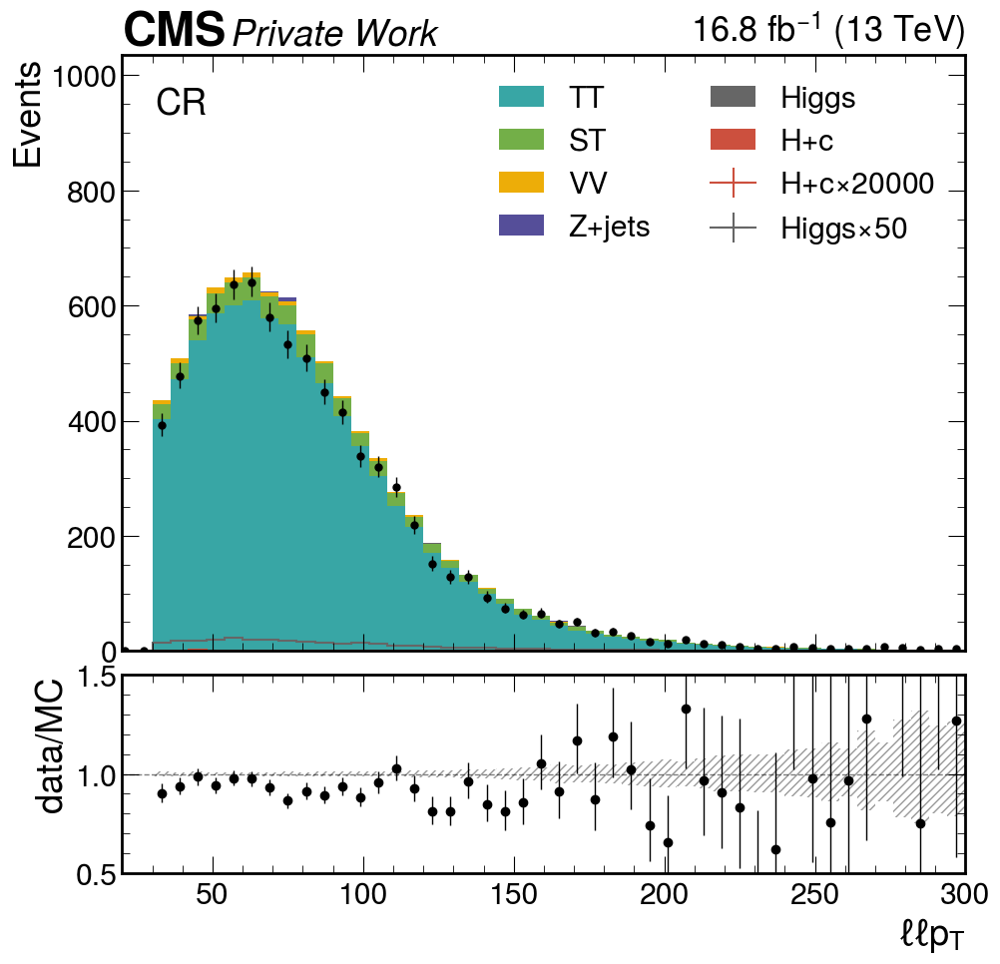

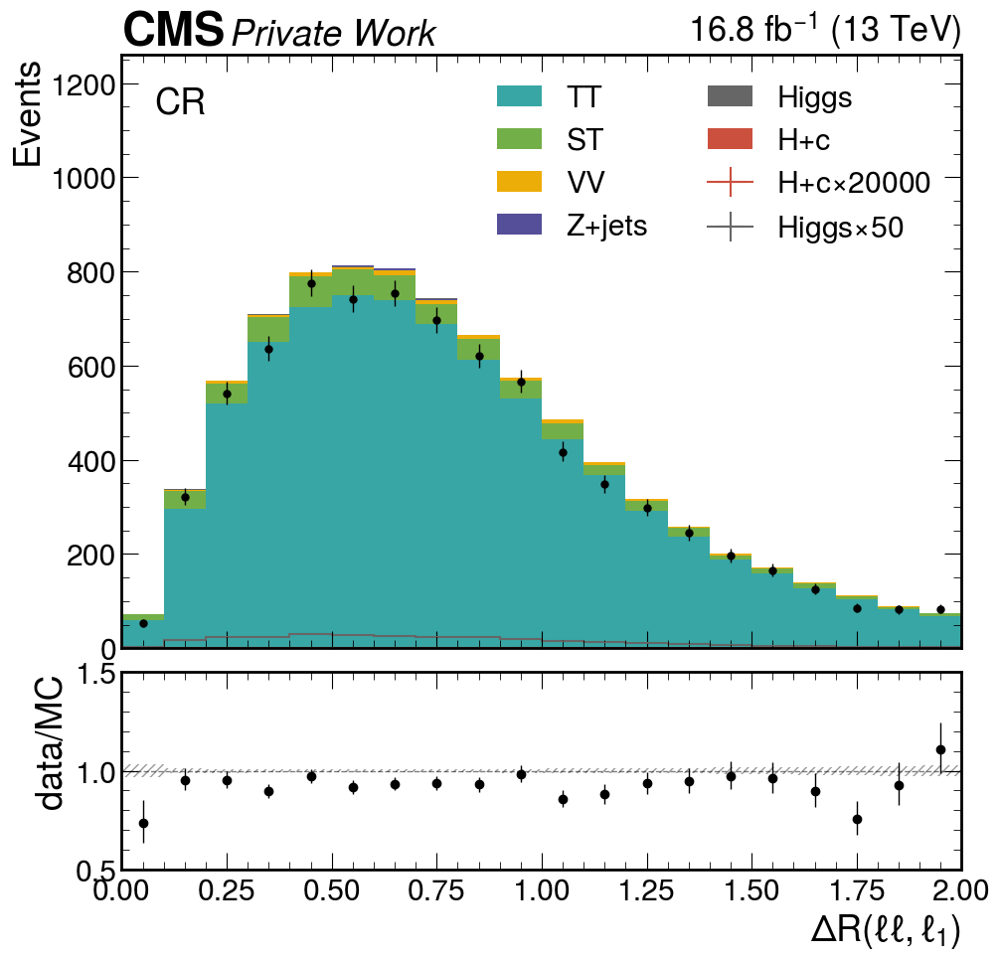

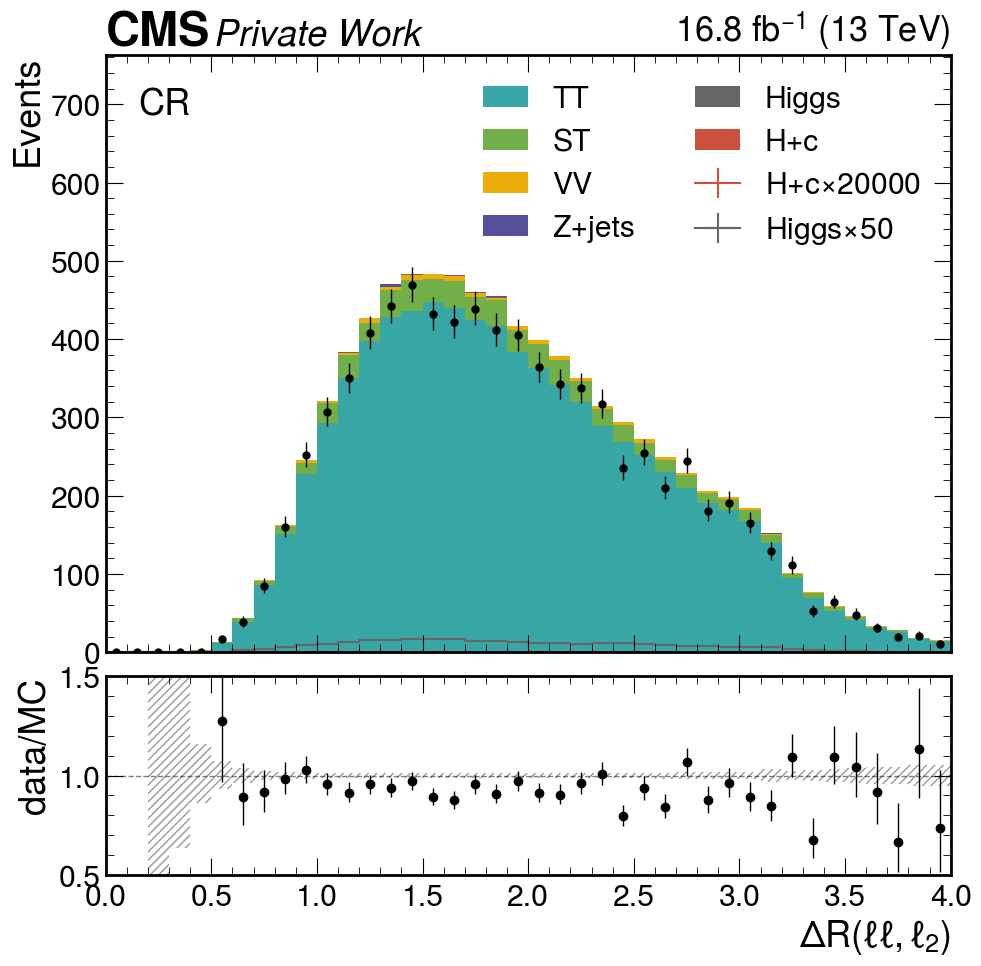

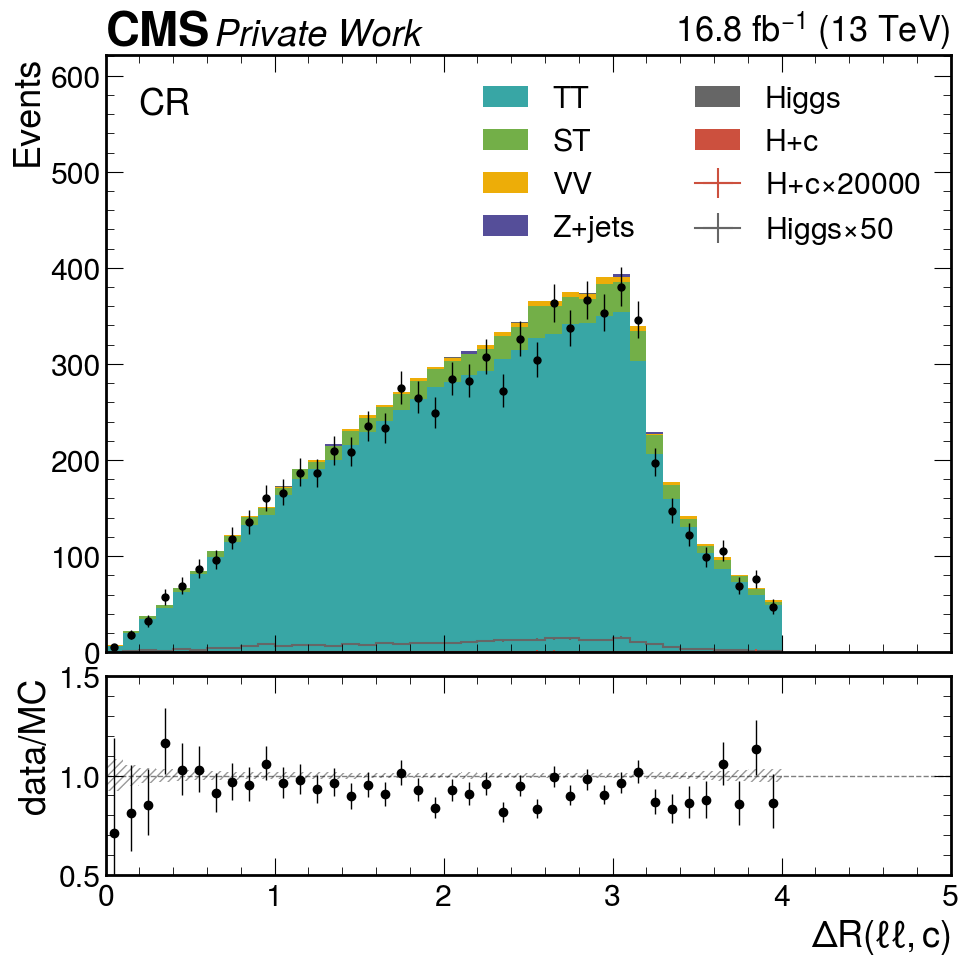

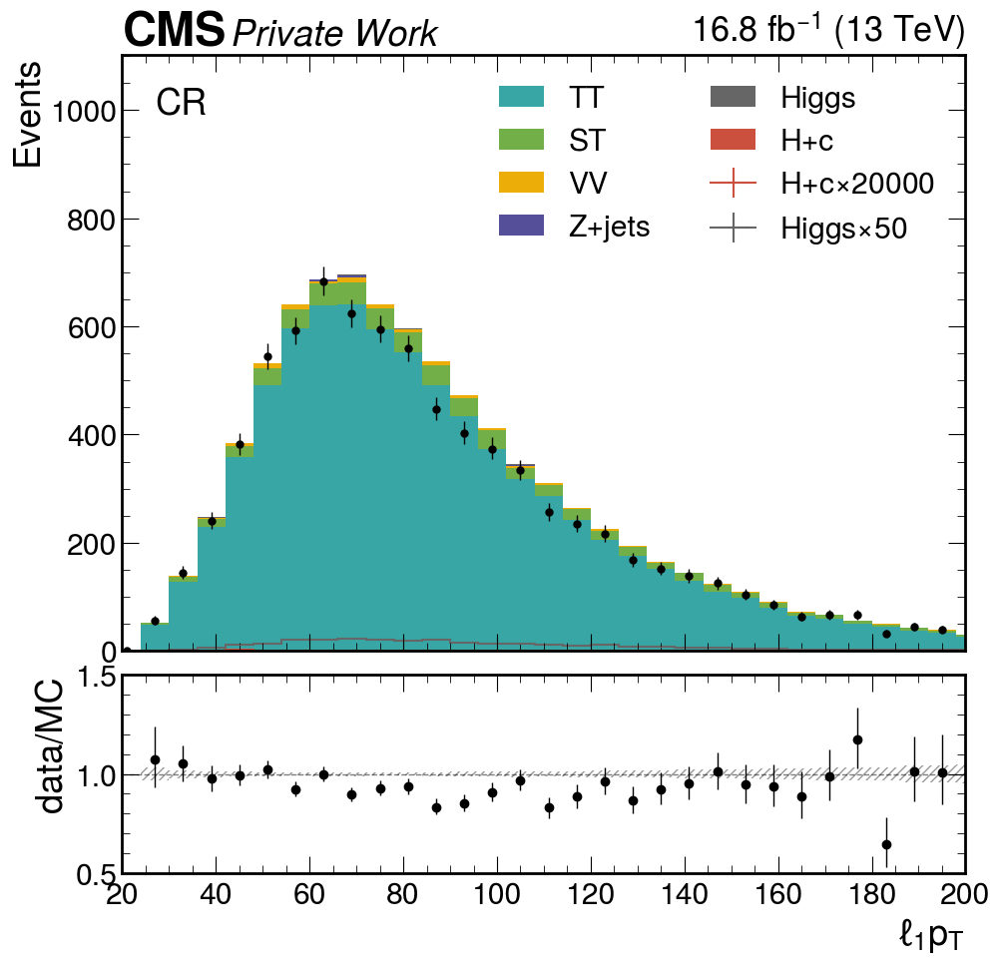

...

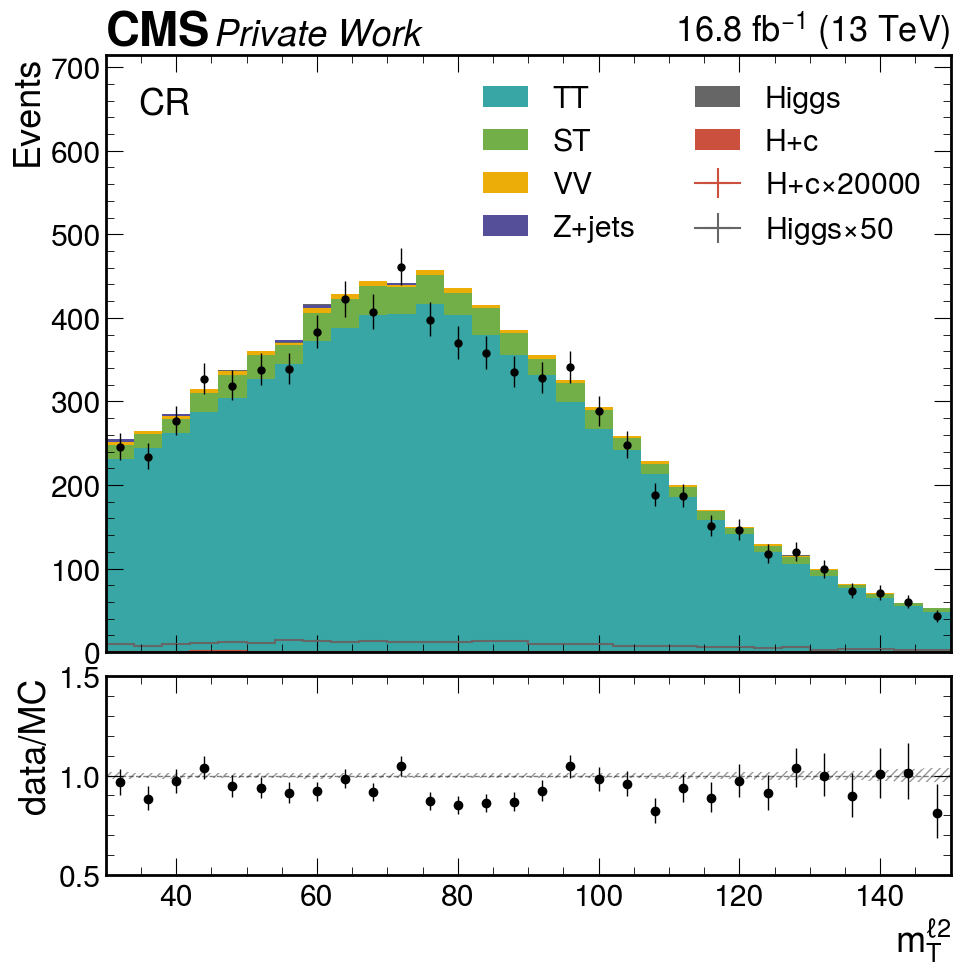

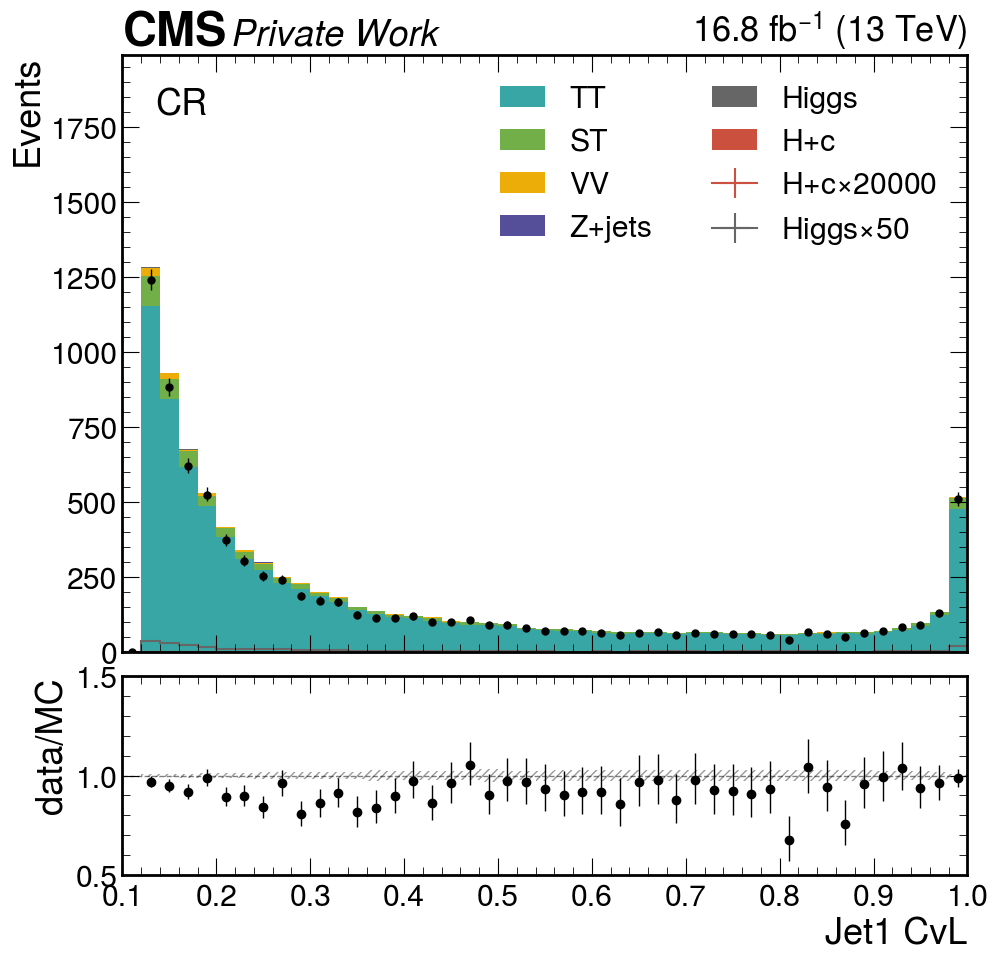

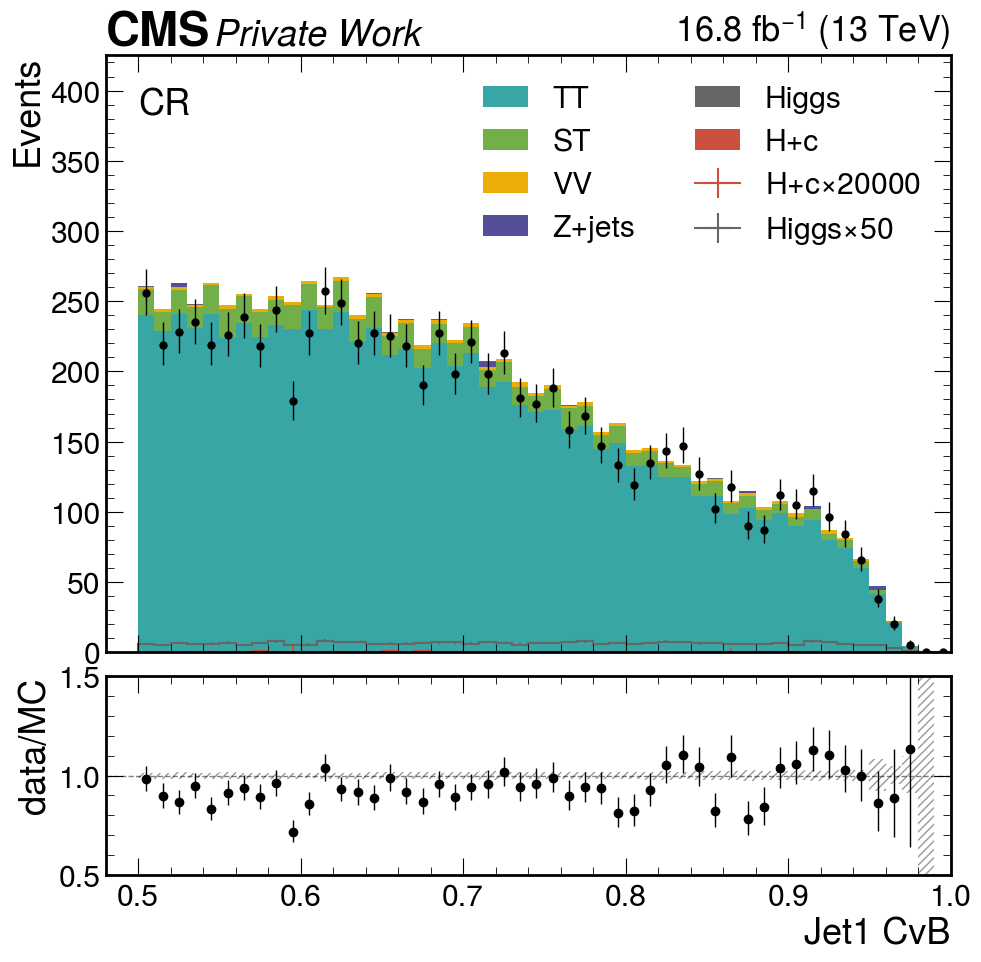

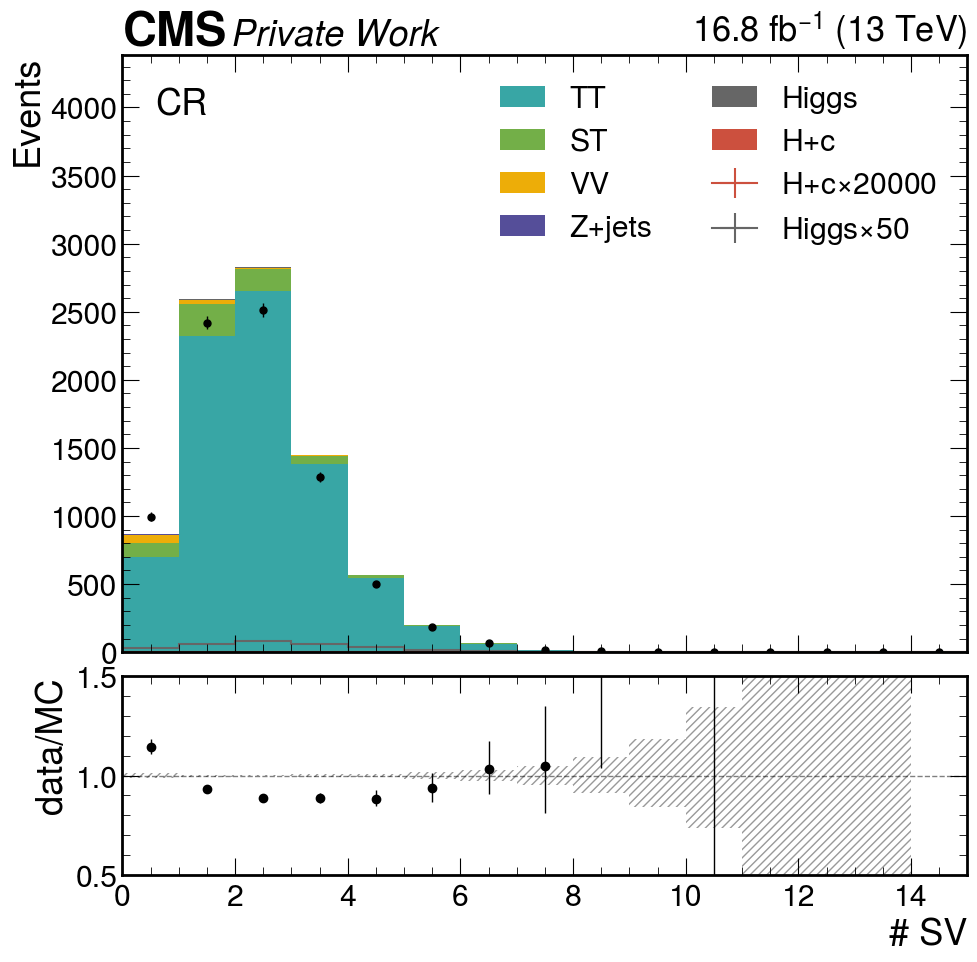

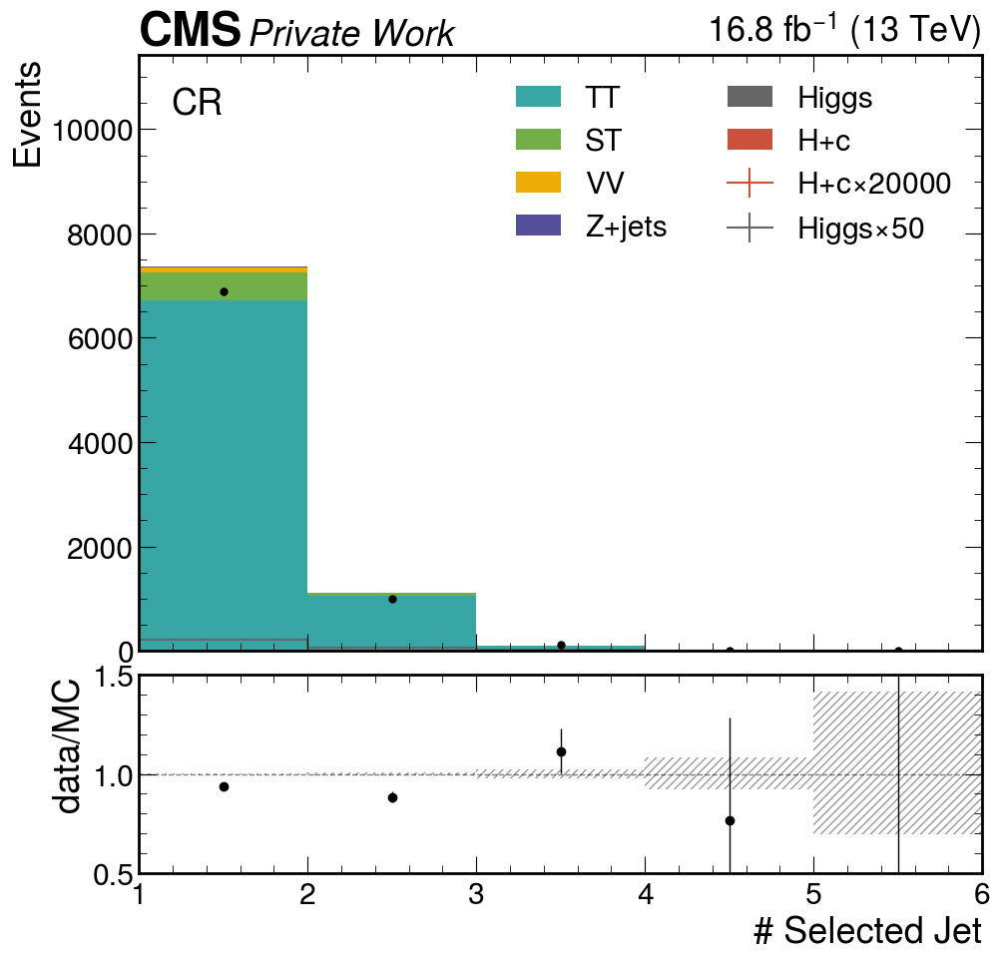

In [32]:
import uproot

plt.style.use(hep.style.ROOT)
for var in trainvar_old:
    fig, ((ax), (rax)) = plt.subplots(
                    2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
                )
    hep.cms.label(
            "Private Work",
            data=True,
            lumi=lumi/1000,
            com="13",
            loc=0,
            ax=ax,
        )
    
    axes={'flav':sum,'lepflav':'emu','region':"HM_CR_1j"}
    axes2={'flav':sum,'lepflav':'emu','region':"HM_CR_nj"}
    if 'template' in var:
        axes["syst"]='nominal'
        axes2["syst"]='nominal'
    # var='jetflav_btagDeepFlavCvL'
    
    # labels=train_collecct[var]
    #"$p_T^\mu$"#"$\\ell_1 p_T$"#"$\\ell\\ell$ mass"#$m_T^{\\ell\\ell}$"
    at = AnchoredText("CR",  frameon=False,loc=2)
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#666666","hc":"#CC503E"}#,"hb":"#62c1e5"}
    name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}#,"hb":"H+b"}
    # for s in collated.keys():
    # #     print(type(collated[s][var][axes]))
    #     collated[s][var]=rebin_hist(collated[s][var][axes],collated[s][var][axes].axes[0].name,1)
    hep.histplot([collated[s][var][axes]+collated[s][var][axes2]for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
    hep.histplot(collated["data_obs"][var][axes]+collated["data_obs"][var][axes2],histtype='errorbar',color='k',ax=ax,flow=None)
    hep.histplot((collated["hc"][var][axes]+collated["hc"][var][axes2])*20000,color=color_map["hc"],label="H+c$\\times$20000",ax=ax,flow=None)
    # hep.histplot((collated["hb"][var][axes]+collated["hb"][var][axes2])*5000,color=color_map["hb"],label="H+b$\\times$5000",ax=ax,flow=None)
    hep.histplot((collated["higgs"][var][axes]+collated["higgs"][var][axes2])*50,color=color_map["higgs"],label="Higgs$\\times$50",ax=ax,flow=None)
    ax.legend(ncols=2)
    hmc=collated['ttbar'][var][axes]+collated['ttbar'][var][axes2]
    
    ax.add_artist(at)
    for s in color_map.keys():
        if s == 'ttbar':continue
        hmc=hmc+collated[s][var][axes]+collated[s][var][axes2]
    plotratio(collated['data_obs'][var][axes]+collated['data_obs'][var][axes2],hmc,ax=rax)
    
    rax.set_ylim(0.5,1.5)
    ax.set_ylim(bottom=0)
    ax.set_xlabel(None)
    rax.set_xlim(train_collect[var][2])
    rax.set_ylabel("data/MC")
    ax.set_ylabel("Events")
    hep.mpl_magic(ax=ax)
    rax.set_xlabel(train_collect[var][0])
    # ax.set_xlim(10,100)
    fig.savefig(f"{year}_{var}_HM_CR.pdf")

False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False
False
False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: invalid value encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: invalid value encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


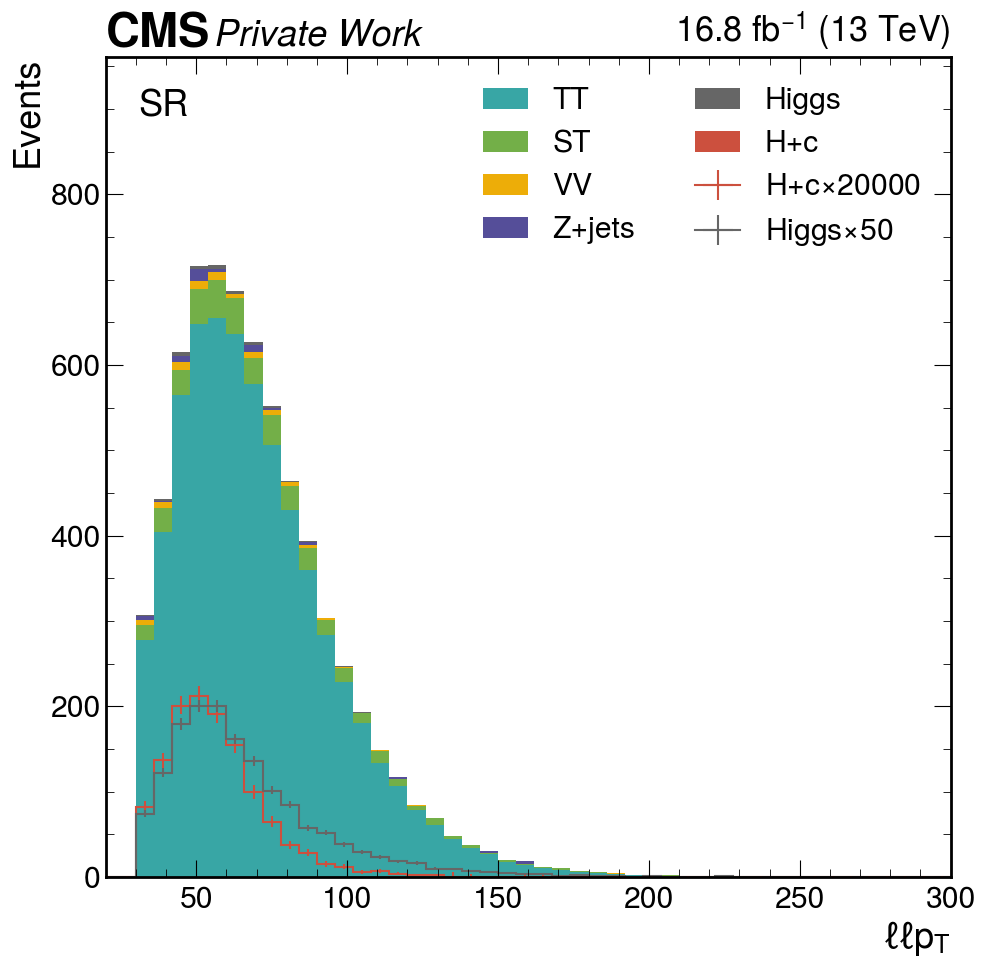

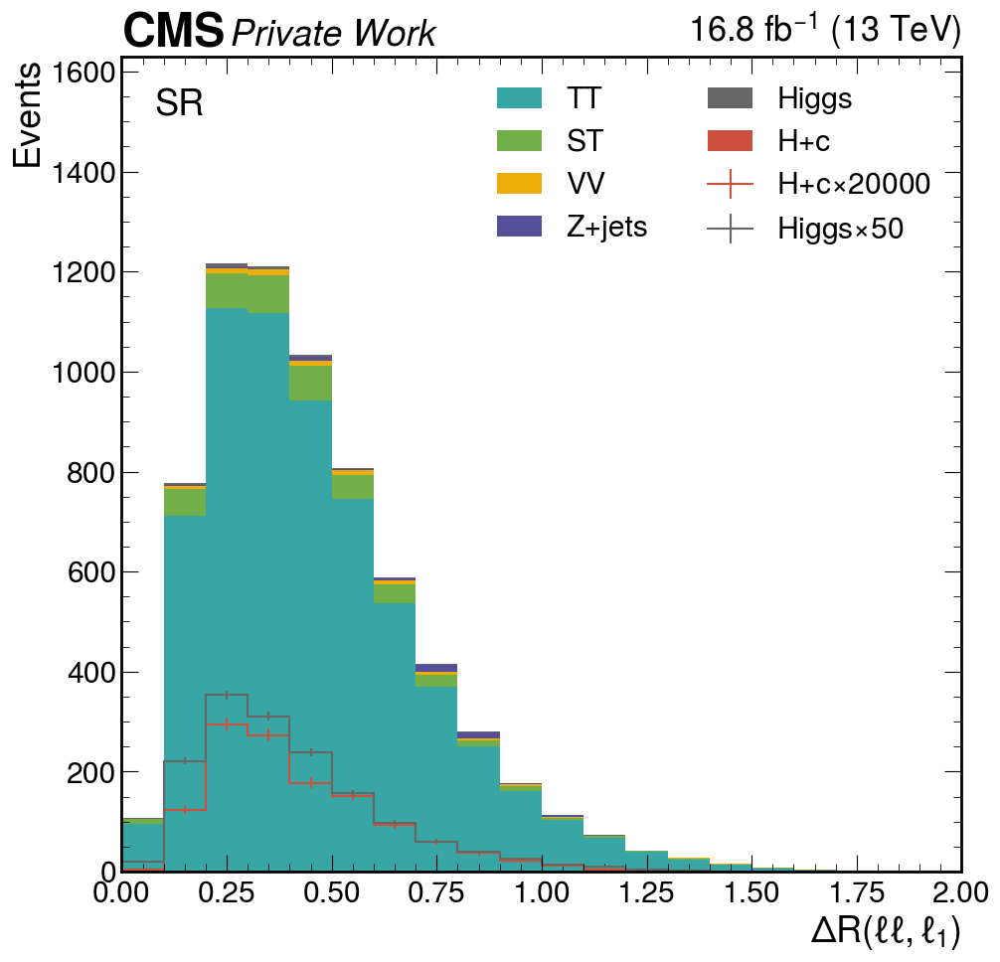

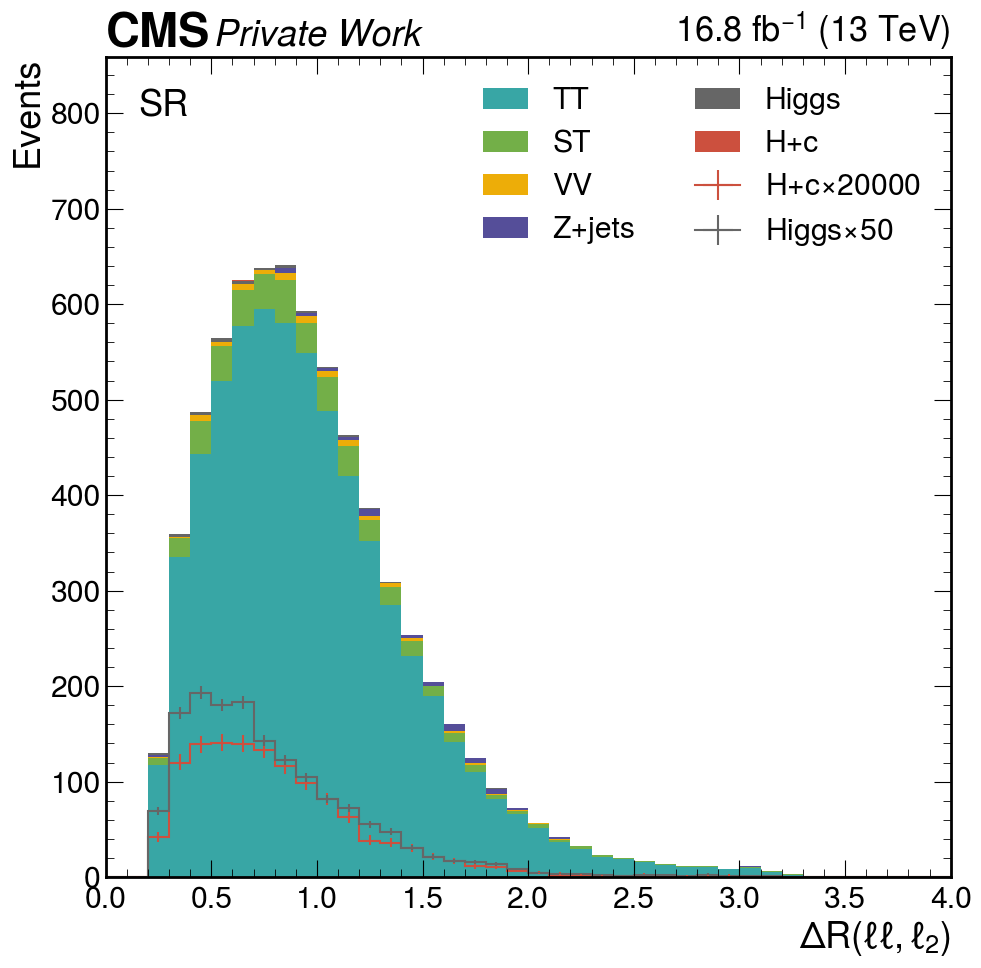

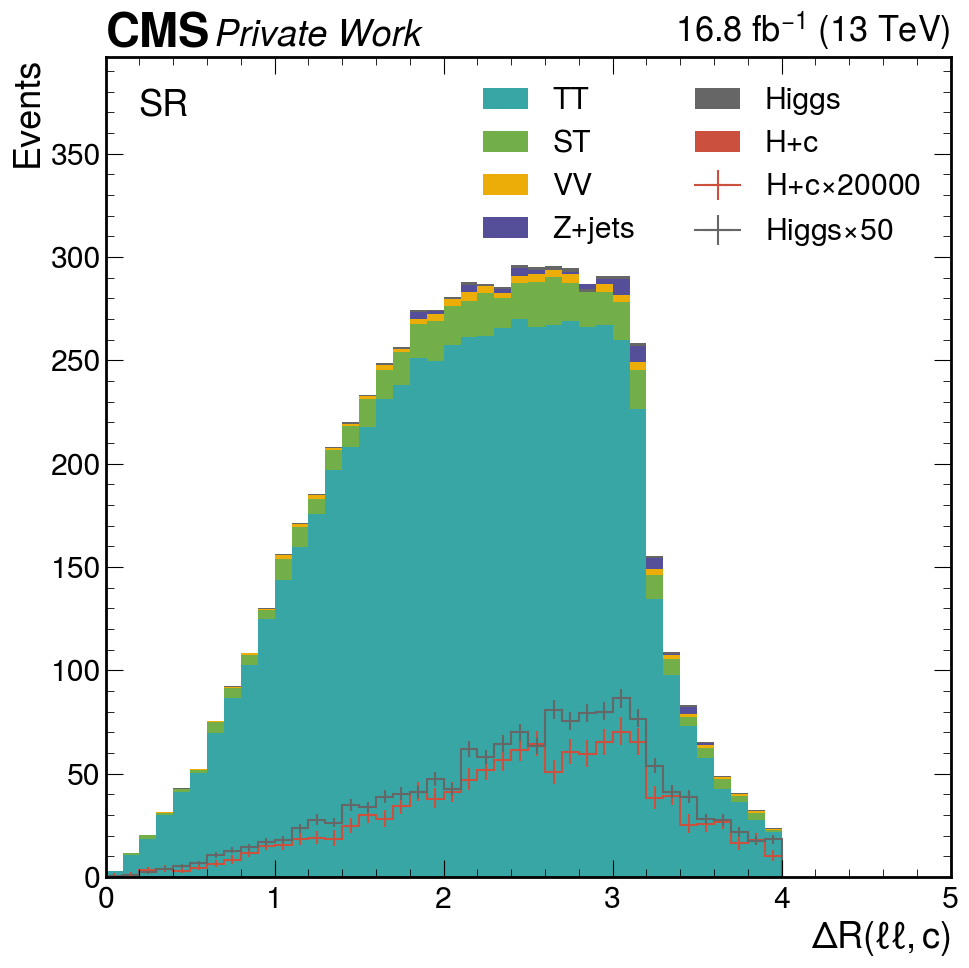

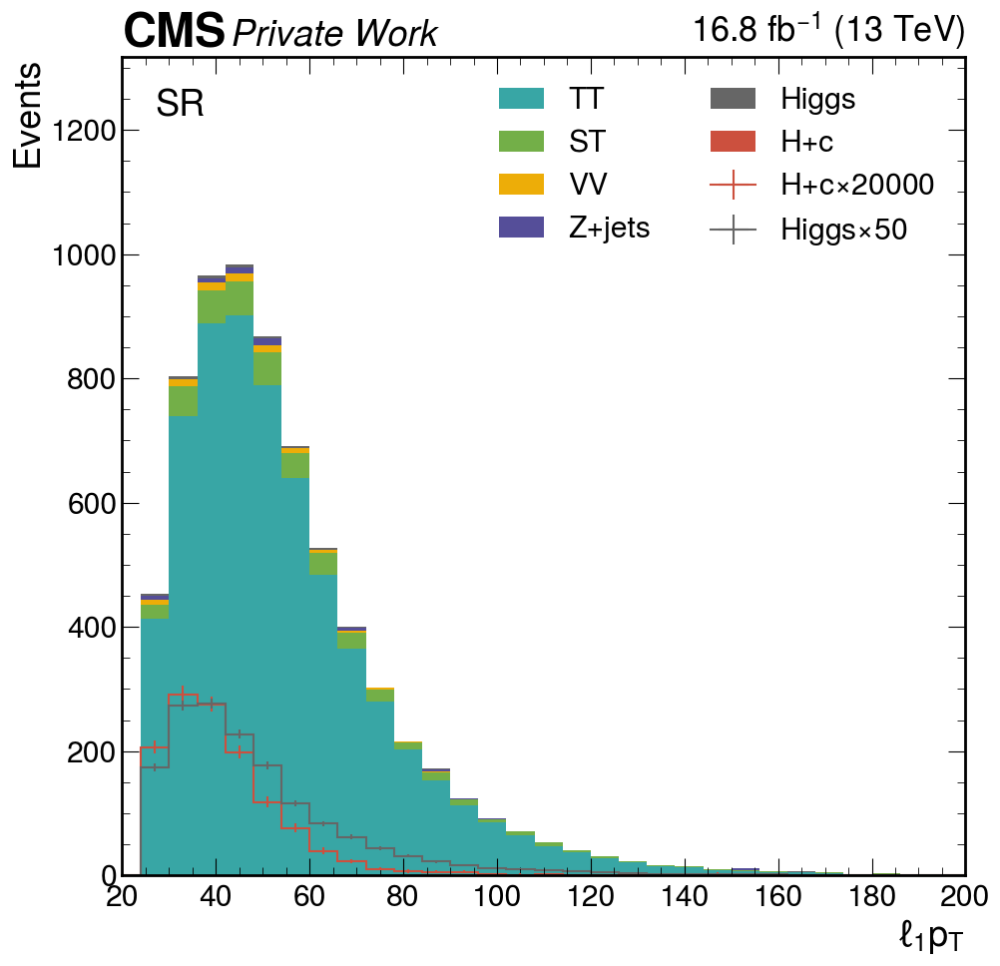

...

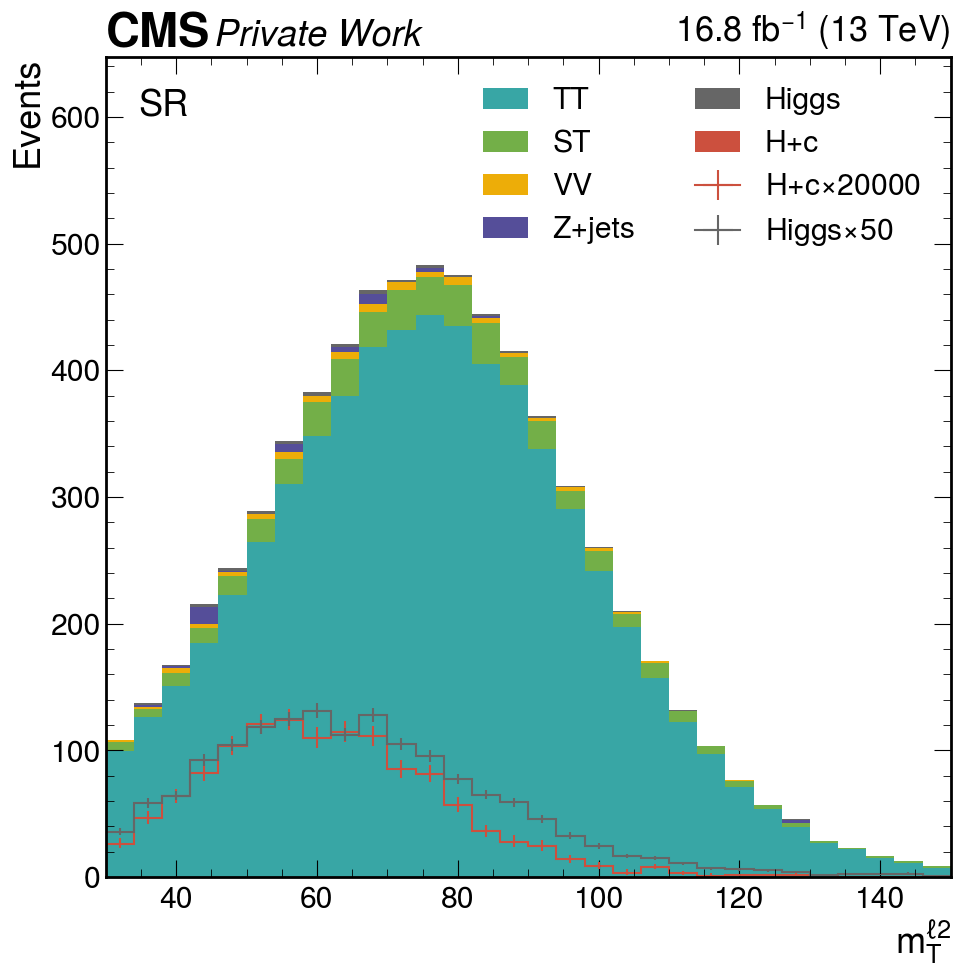

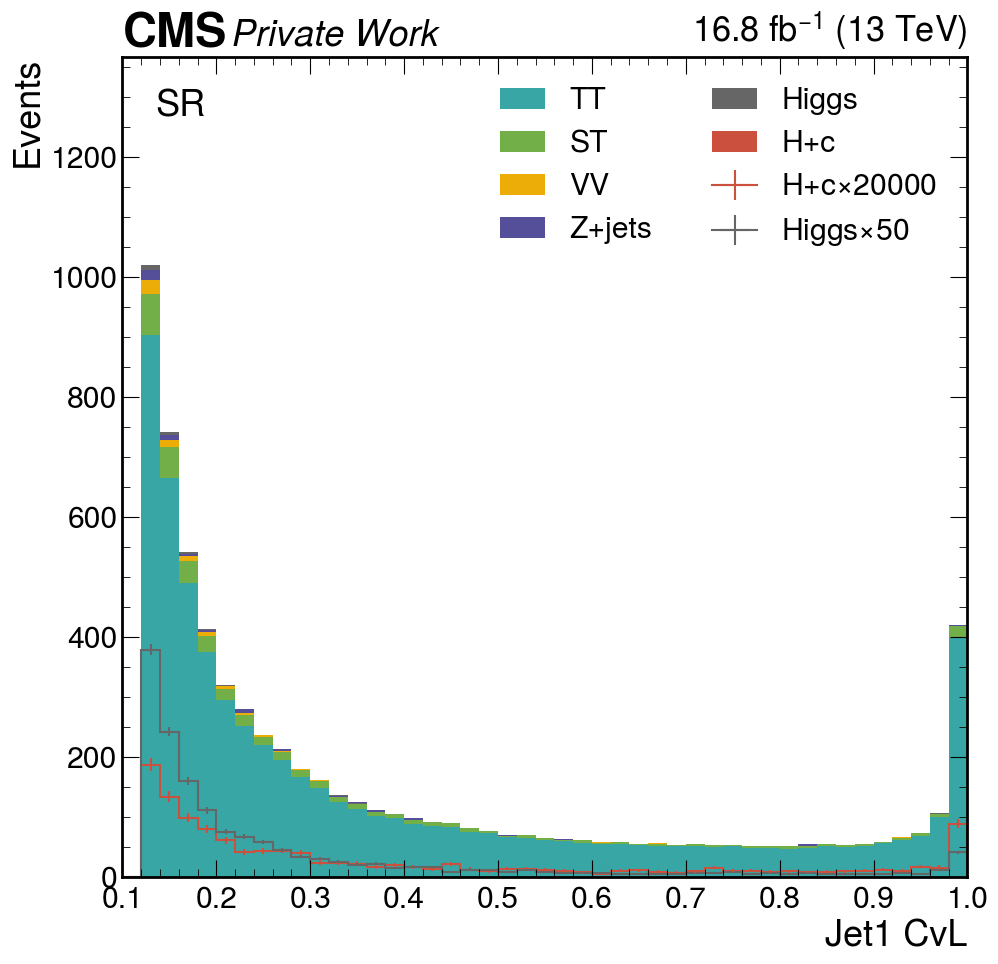

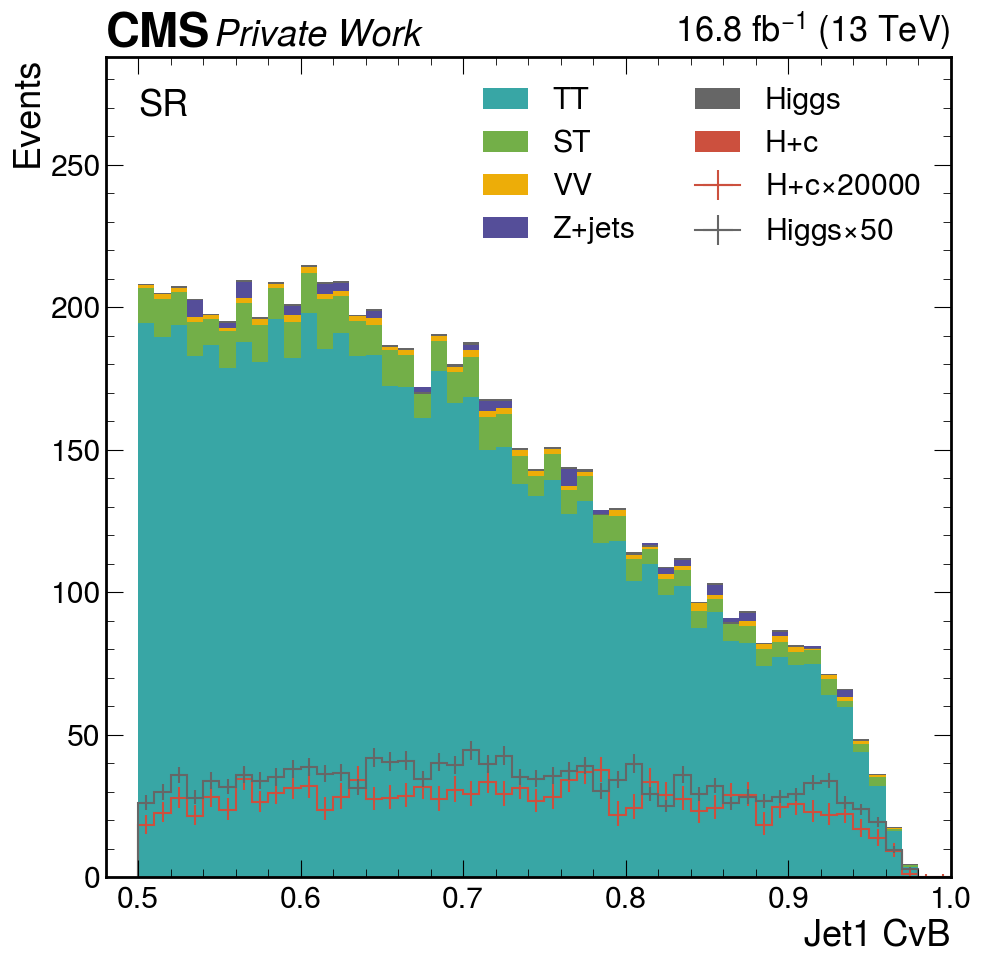

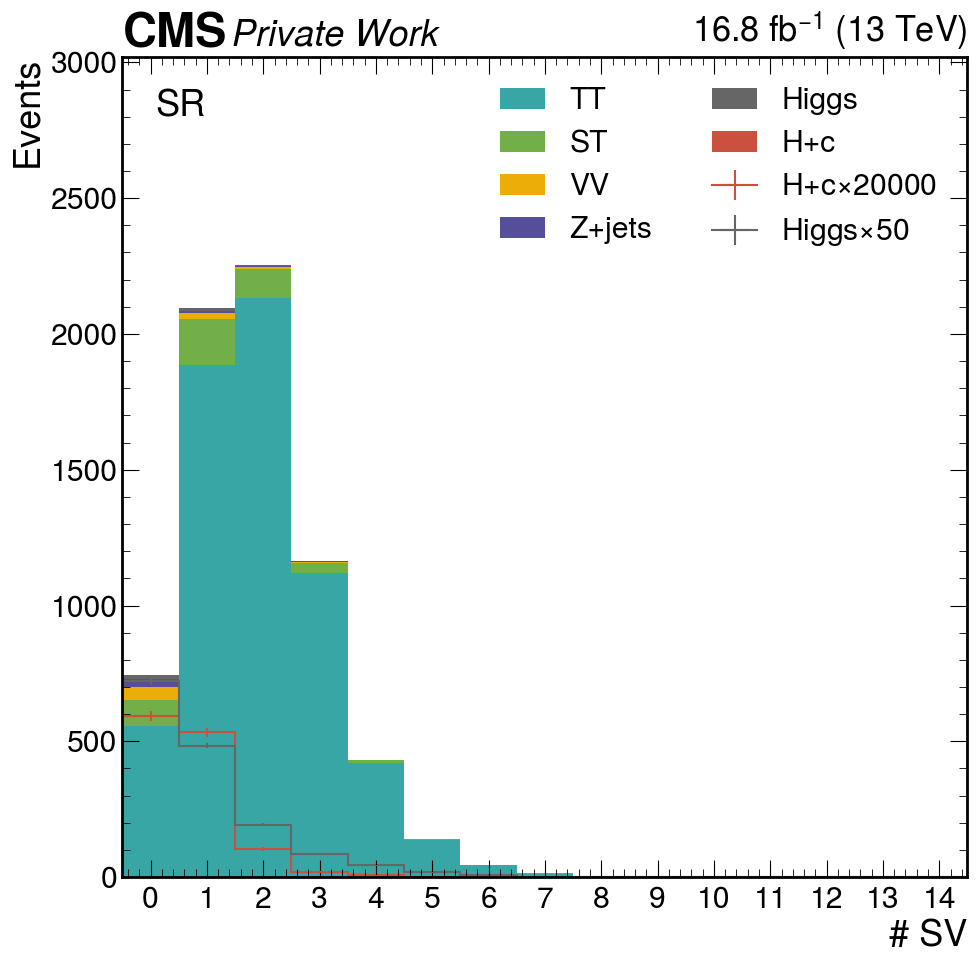

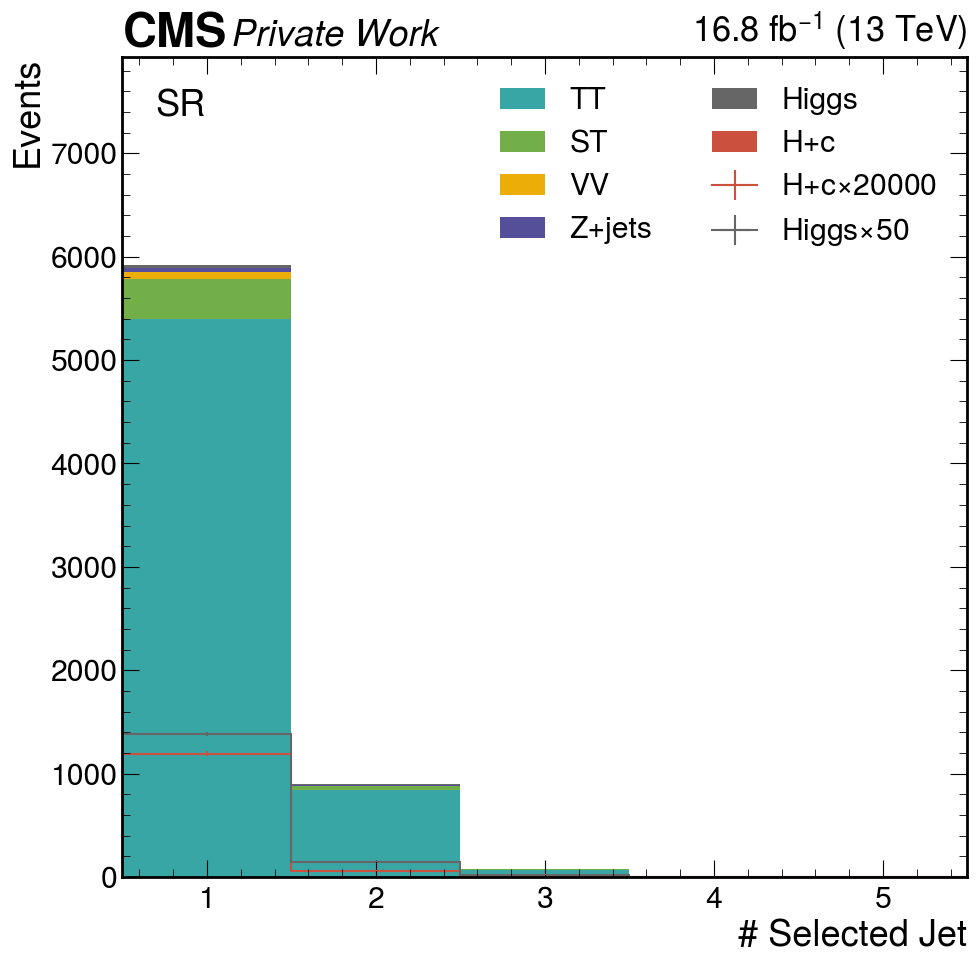

In [33]:
import uproot

plt.style.use(hep.style.ROOT)
for var in trainvar_old:
    # fig, ((ax), (rax)) = plt.subplots(
    #                 2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
    #             )
    fig, ax=plt.subplots()
    hep.cms.label(
            "Private Work",
            data=True,
            lumi=lumi/1000,
            com="13",
            loc=0,
            ax=ax,
        )
    
    axes={'flav':sum,'lepflav':'emu','region':"SR2_LM"}
    axes2={'flav':sum,'lepflav':'emu','region':"SR_LM"}
    if 'template' in var:
        axes["syst"]='nominal'
        axes2["syst"]='nominal'
    # var='jetflav_btagDeepFlavCvL'
    
    # labels=train_collecct[var]
    #"$p_T^\mu$"#"$\\ell_1 p_T$"#"$\\ell\\ell$ mass"#$m_T^{\\ell\\ell}$"
    at = AnchoredText("SR",  frameon=False,loc=2)
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#666666","hc":"#CC503E"}#,"hb":"#62c1e5"}
    name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}#,"hb":"H+b"}
    # for s in collated.keys():
    # #     print(type(collated[s][var][axes]))
    #     collated[s][var]=rebin_hist(collated[s][var][axes],collated[s][var][axes].axes[0].name,1)
    hep.histplot([collated[s][var][axes]+collated[s][var][axes2]for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
    # hep.histplot(collated["data_obs"][var][axes]+collated["data_obs"][var][axes2],histtype='errorbar',color='k',ax=ax,flow=None)
    hep.histplot((collated["hc"][var][axes]+collated["hc"][var][axes2])*20000,color=color_map["hc"],label="H+c$\\times$20000",ax=ax,flow=None)
    # hep.histplot((collated["hb"][var][axes]+collated["hb"][var][axes2])*5000,color=color_map["hb"],label="H+b$\\times$5000",ax=ax,flow=None)
    hep.histplot((collated["higgs"][var][axes]+collated["higgs"][var][axes2])*50,color=color_map["higgs"],label="Higgs$\\times$50",ax=ax,flow=None)
    ax.legend(ncols=2)
    hmc=collated['ttbar'][var][axes]+collated['ttbar'][var][axes2]
    
    ax.add_artist(at)
    for s in color_map.keys():
        if s == 'ttbar':continue
        hmc=hmc+collated[s][var][axes]+collated[s][var][axes2]
    plotratio(collated['data_obs'][var][axes]+collated['data_obs'][var][axes2],hmc,ax=rax)
    
    rax.set_ylim(0.5,1.5)
    ax.set_ylim(bottom=0)
    ax.set_xlabel(None)
    ax.set_xlim(train_collect[var][2])
    rax.set_ylabel("data/MC")
    ax.set_ylabel("Events")
    hep.mpl_magic(ax=ax)
    ax.set_xlabel(train_collect[var][0])
    # ax.set_xlim(10,100)
    fig.savefig(f"{year}_{var}_SR.pdf")

In [ ]:
import uproot

plt.style.use(hep.style.ROOT)
for var in trainvar_old:
    fig, ax =plt.subplots()
    # plt.subplots(
    #                 2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
    #             )
    hep.cms.label(
            "Private Work",
            data=True,
            lumi=lumi/1000,
            com="13",
            loc=0,
            ax=ax,
        )
    
    axes={'flav':sum,'lepflav':'emu','region':"HM_CR_1j"}
    axes2={'flav':sum,'lepflav':'emu','region':"HM_CR_nj"}
    if 'template' in var:
        axes["syst"]='nominal'
        axes2["syst"]='nominal'
    # var='jetflav_btagDeepFlavCvL'
    
    # labels=train_collecct[var]
    #"$p_T^\mu$"#"$\\ell_1 p_T$"#"$\\ell\\ell$ mass"#$m_T^{\\ell\\ell}$"
    at = AnchoredText("CR",  frameon=False,loc=2)
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#666666","hc":"#CC503E"}#,"hb":"#62c1e5"}
    name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}#,"hb":"H+b"}
    # for s in collated.keys():
    # #     print(type(collated[s][var][axes]))
    #     collated[s][var]=rebin_hist(collated[s][var][axes],collated[s][var][axes].axes[0].name,1)
    hep.histplot([collated[s][var][axes]+collated[s][var][axes2]for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
    hep.histplot(collated["data_obs"][var][axes]+collated["data_obs"][var][axes2],histtype='errorbar',color='k',ax=ax,flow=None)
    hep.histplot((collated["hc"][var][axes]+collated["hc"][var][axes2])*20000,color=color_map["hc"],label="H+c$\\times$20000",ax=ax,flow=None)
    # hep.histplot((collated["hb"][var][axes]+collated["hb"][var][axes2])*5000,color=color_map["hb"],label="H+b$\\times$5000",ax=ax,flow=None)
    hep.histplot((collated["higgs"][var][axes]+collated["higgs"][var][axes2])*50,color=color_map["higgs"],label="Higgs$\\times$50",ax=ax,flow=None)
    ax.legend(ncols=2)
    hmc=collated['ttbar'][var][axes]+collated['ttbar'][var][axes2]
    
    ax.add_artist(at)
    for s in color_map.keys():
        if s == 'ttbar':continue
        hmc=hmc+collated[s][var][axes]+collated[s][var][axes2]
    plotratio(collated['data_obs'][var][axes]+collated['data_obs'][var][axes2],hmc,ax=rax)
    
    rax.set_ylim(0.5,1.5)
    ax.set_ylim(bottom=0)
    ax.set_xlabel(None)
    rax.set_xlim(train_collect[var][2])
    rax.set_ylabel("data/MC")
    ax.set_ylabel("Events")
    hep.mpl_magic(ax=ax)
    rax.set_xlabel(train_collect[var][0])
    # ax.set_xlim(10,100)
    fig.savefig(f"{year}_{var}_SR.pdf")

0.9821671614662034
False


/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:557: RuntimeWarning: divide by zero encountered in divide
  rsumw = sumw_num / sumw_denom
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:566: RuntimeWarning: divide by zero encountered in divide
  rsumw_err = np.abs(poisson_interval(rsumw, sumw2_num / sumw_denom**2) - rsumw)
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:338: RuntimeWarning: invalid value encountered in divide
  scale[sumw != 0] = sumw2[sumw != 0] / sumw[sumw != 0]
/nfs/dust/cms/user/milee/CoffeaRunner/src/BTVNanoCommissioning/utils/plot_utils.py:596: RuntimeWarning: invalid value encountered in divide
  denom_unc = poisson_interval(unity, sumw2_denom / sumw_denom**2)


0.970484997796092
False
0.9821671614662031
False
0.970484997796092
False


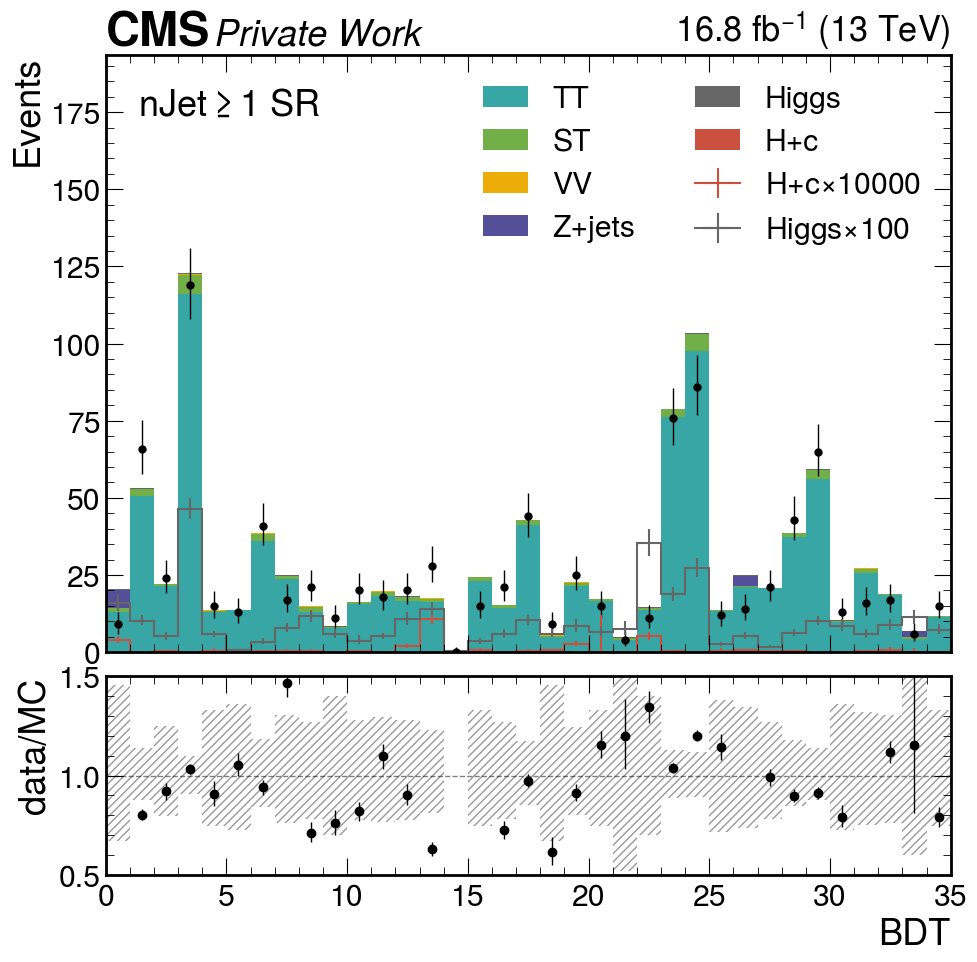

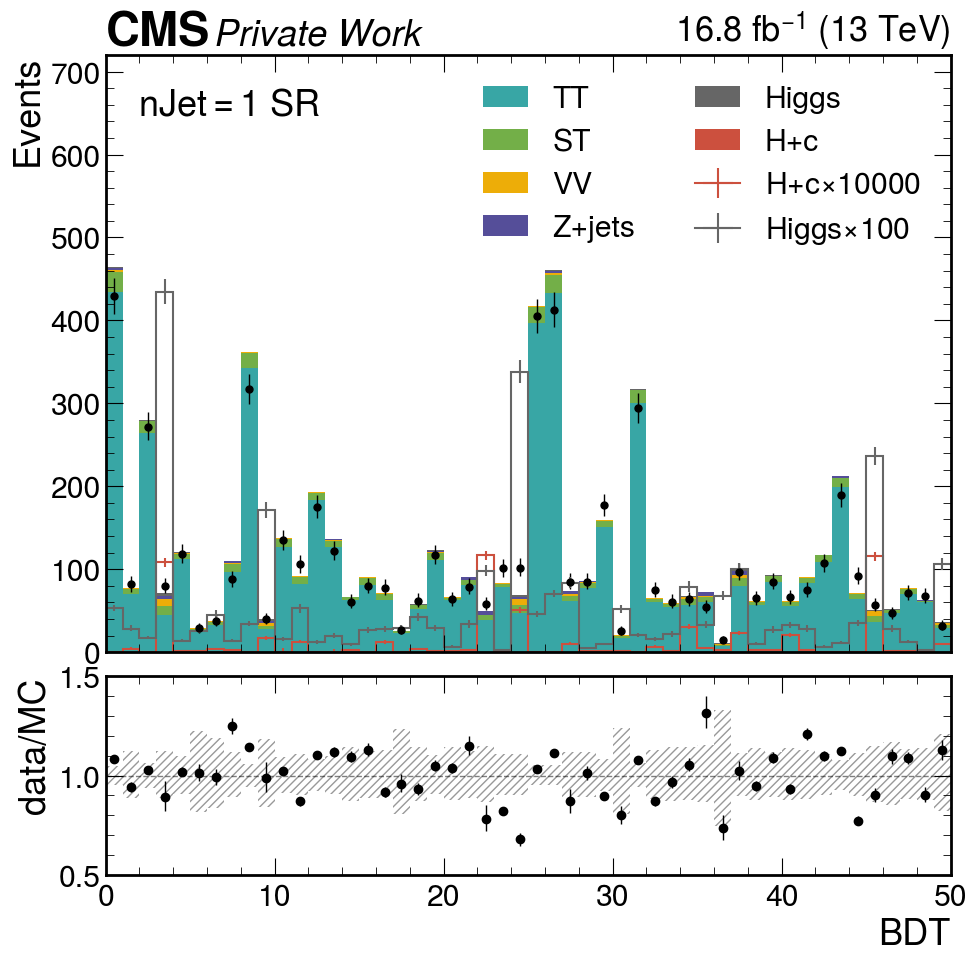

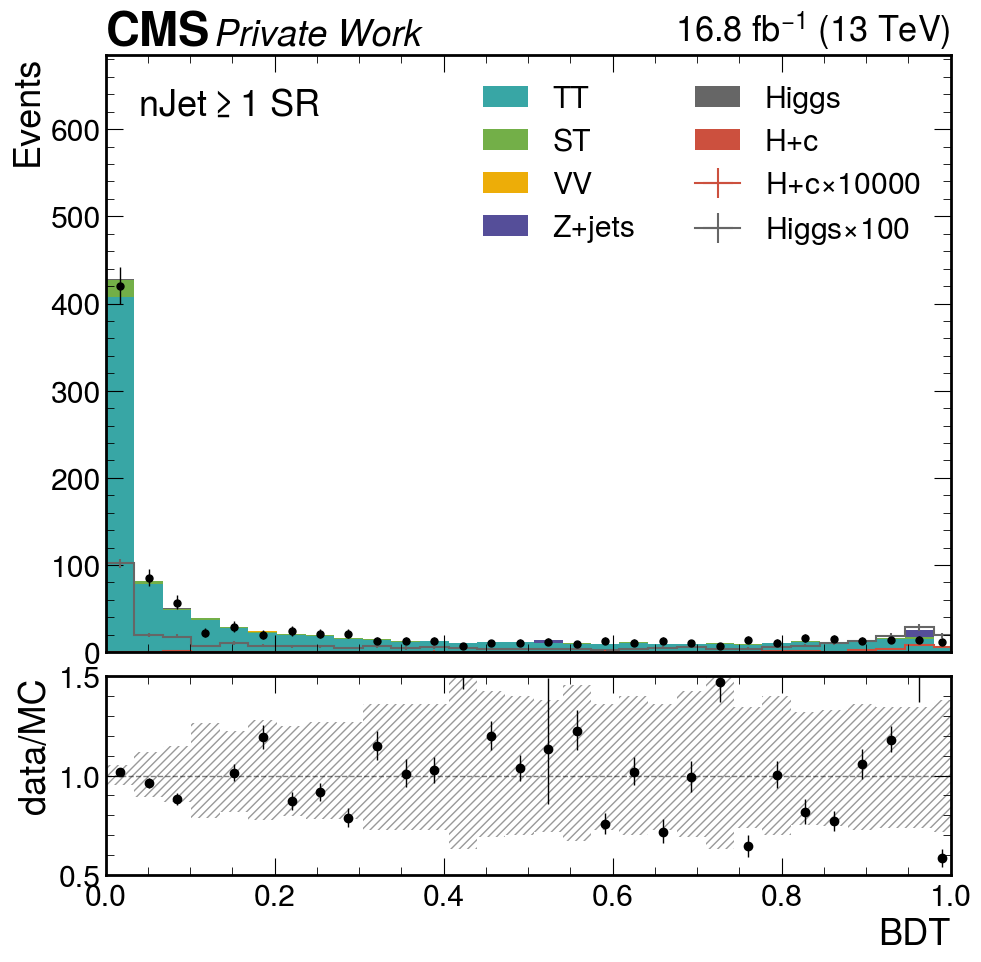

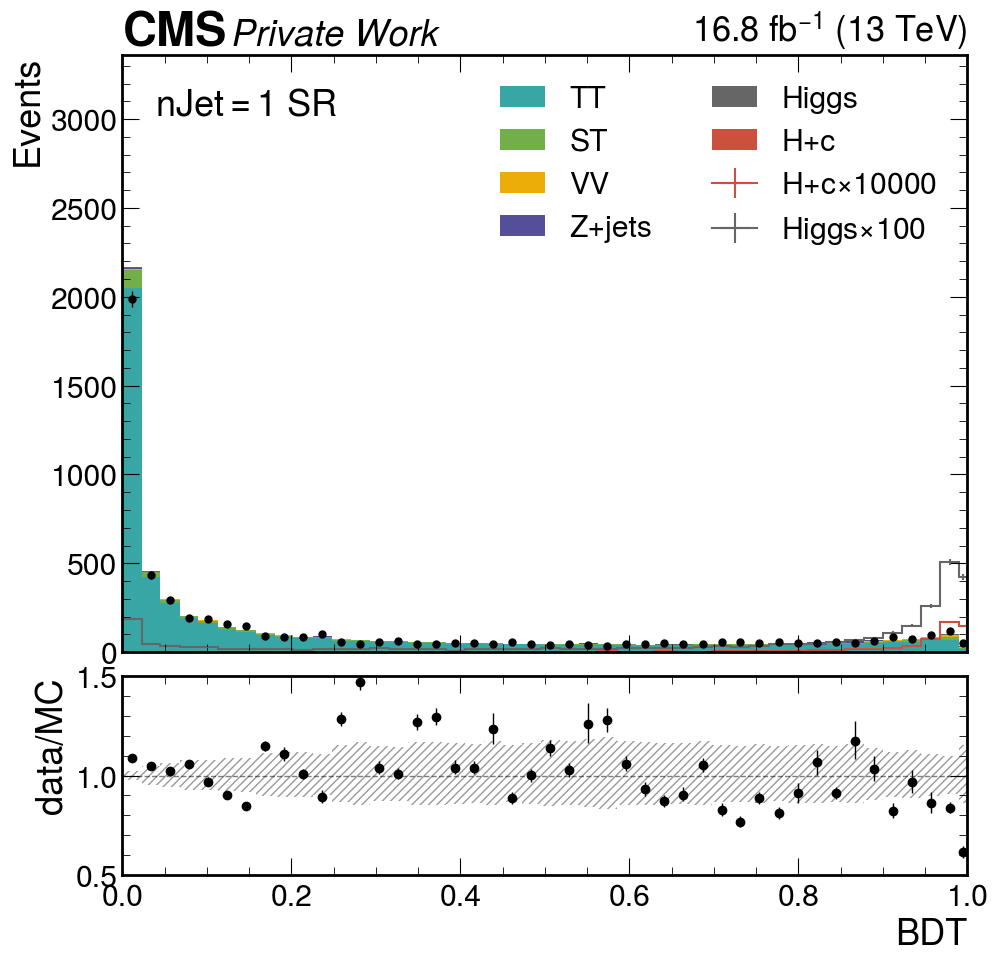

In [8]:
import uproot
var={
    # 'top_CR':"template_mTh",
    #  'HM_CR':"template_BDT_SR_HM",
     'SR_LM':"template_BDT_SR_LM",
     'SR2_LM':"template_BDT_SR2_LM",
     'SR_LM_1D':"template_BDT_SR_LM_1D",
     'SR2_LM_1D':"template_BDT_SR2_LM_1D"}
reg={'top_CR_lowmT':['top CR',"$m_T^{\\ell\\ell}$"],
     'SR_HM':['high $m_{\\ell\\ell}$ CR',"BDT"],
     'SR_LM':['nJet$\geq$1 SR',"BDT"],
     'SR2_LM':['nJet$=$1 SR',"BDT"],
     'SR_LM_1D':['nJet$\geq$1 SR',"BDT"],
     'SR2_LM_1D':['nJet$=$1 SR',"BDT"]}
for r in var.keys(): 
    plt.style.use(hep.style.ROOT)
    fig, ((ax), (rax)) = plt.subplots(
                    2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
                )
    hep.cms.label(
            "Private Work",
            data=True,
            lumi=lumi/1000,
            com="13",
            loc=0,
            ax=ax,
        )
    # r = r.replace("_1D","")
    # print(r.replace("_1D",""))
    axes={"syst":"nominal",'flav':sum,"region":r.replace("_1D",""),"lepflav":"emu"}
    # print(collated[s][var[r]])
    at = AnchoredText(reg[r][0],  frameon=False,loc=2)
    fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
    color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#666666","hc":"#CC503E"}
    name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}
    # axes=
    for s in collated.keys():
        if 'flav' not in collated[s][var[r]].axes.name:continue
    #     # print(type(collated[s][var][axes]))
        
        if "SR_HM"==r:collated[s][var[r]]=rebin_hist(collated[s][var[r]][axes],collated[s][var[r]][axes].axes[0].name,2)
        else:collated[s][var[r]]=rebin_hist(collated[s][var[r]][axes],collated[s][var[r]][axes].axes[0].name,1)
    # print(collated['data_obs'][var[r]])   
    hep.histplot([collated[s][var[r]] for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
    
    hmc=collated['ttbar'][var[r]]
   
    for s in color_map.keys():
        if s == 'ttbar' or 'data_obs' ==s :continue
        hmc=hmc+collated[s][var[r]]
    rax.axhline(np.sum(collated["data_obs"][var[r]].values())/np.sum(hmc.values()))
    
    data=collated["data_obs"][var[r]].copy()
    hdata=data.values()
    
    if "SR_LM" in r: hdata[-5]=np.nan
    if "SR2_LM" in r: hdata[-10]=np.nan
    hep.histplot(collated["data_obs"][var[r]],histtype='errorbar',color='k',ax=ax,flow=None,)
    hep.histplot(collated["hc"][var[r]]*10000,color=color_map["hc"],label="H+c$\\times$10000",ax=ax,flow=None)
    hep.histplot(collated["higgs"][var[r]]*100,color=color_map["higgs"],label="Higgs$\\times$100",ax=ax,flow=None)
    
    ax.legend(ncols=2)
    if "SR_HM" ==r : ax.semilogy()
   
    ax.add_artist(at)
    print(np.sum(collated["data_obs"][var[r]].values())/np.sum(hmc.values()))
    plotratio(hmc,collated["data_obs"][var[r]],ax=rax)#,data_is_np=True)
    
    rax.set_ylim(0.5,1.5)
    ax.set_ylim(bottom=0)
    ax.set_xlabel(None)
    rax.set_ylabel("data/MC")
    ax.set_ylabel("Events")
    hep.mpl_magic(ax=ax)
    rax.set_xlabel(reg[r][1])
    
    
    # # ax.set_xlim(10,100)
    fig.savefig(f"{year}_{var[r]}.pdf")


In [7]:
collated['hc']['nsv']

Hist(
  StrCategory(['ee', 'mumu', 'emu'], name='lepflav', label='channel'),
  StrCategory(['SR_LM', 'SR2_LM', 'HM_CR_1j', 'HM_CR_nj', 'top_CR_1j', 'top_CR_nj'], name='region'),
  IntCategory([0, 1, 4, 5, 6], name='flav', label='Genflavour'),
  Integer(0, 20, name='nsv', label='# of SVs'),
  storage=Weight()) # Sum: WeightedSum(value=0.162991, variance=4.72471e-06)

False


ValueError: numerator and denominator histograms have incompatible axis definitions

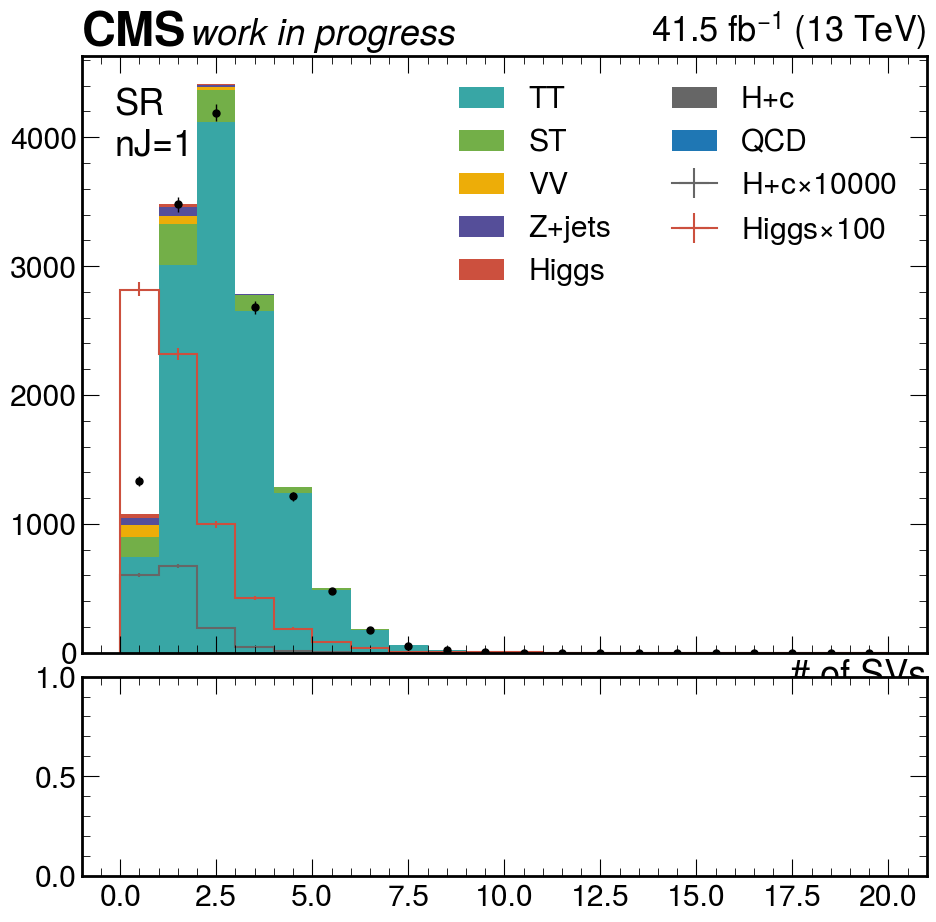

In [13]:
import uproot
plt.style.use(hep.style.ROOT)
fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
hep.cms.label(
        "work in progress",
        data=True,
        lumi=lumi/1000,
        com="13",
        loc=0,
        ax=ax,
    )

axes={'flav':sum,'lepflav':'emu','region':"SR2_LM"}#,"syst":"nominal"}
# var='jetflav_btagDeepFlavCvL'
var='nsv'
labels={}#"$p_T^\mu$"#"$\\ell_1 p_T$"#"$\\ell\\ell$ mass"#$m_T^{\\ell\\ell}$"
at = AnchoredText("SR\nnJ=1",  frameon=False,loc=2)
fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#CC503E","hc":"#666666","QCD":"tab:blue"}
name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c","QCD":"QCD"}
# for s in collated.keys():
# #     print(type(collated[s][var][axes]))
#     collated[s][var]=rebin_hist(collated[s][var][axes],collated[s][var][axes].axes[0].name,1)
hep.histplot([collated[s][var][axes]for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
hep.histplot(collated["data_obs"][var][axes],histtype='errorbar',color='k',ax=ax,flow=None)
hep.histplot(collated["hc"][var][axes]*10000,color=color_map["hc"],label="H+c$\\times$10000",ax=ax,flow=None)
hep.histplot(collated["higgs"][var][axes]*100,color=color_map["higgs"],label="Higgs$\\times$100",ax=ax,flow=None)
ax.legend(ncols=2)
hmc=collated['ttbar'][var]

ax.add_artist(at)
for s in color_map.keys():
    if s == 'ttbar':continue
    hmc=hmc+collated[s][var]
plotratio(collated['data_obs'][var][axes],hmc,ax=rax)

rax.set_ylim(0.5,1.5)
ax.set_ylim(bottom=0)
ax.set_xlabel(None)
rax.set_ylabel("data/MC")
ax.set_ylabel("Events")
hep.mpl_magic(ax=ax)
# rax.set_xlabel("jet $\eta$")
# ax.set_xlim(10,100)
# fig.savefig("2018_mu_eta.pdf")

In [12]:
collated['QCD']['nsv']

Hist(
  StrCategory(['ee', 'mumu', 'emu'], name='lepflav', label='channel'),
  StrCategory(['SR_LM', 'SR2_LM', 'HM_CR_1j', 'HM_CR_nj', 'top_CR_1j', 'top_CR_nj'], name='region'),
  IntCategory([0, 1, 4, 5, 6], name='flav', label='Genflavour'),
  Integer(0, 20, name='nsv', label='# of SVs'),
  storage=Weight()) # Sum: WeightedSum(value=1.49102, variance=1.10178)

In [11]:
import numpy as np
np.sqrt(4.1**2+2.9**2+0.4**2)/(214.2+79.3+10.32)

0.01658171511791192

False


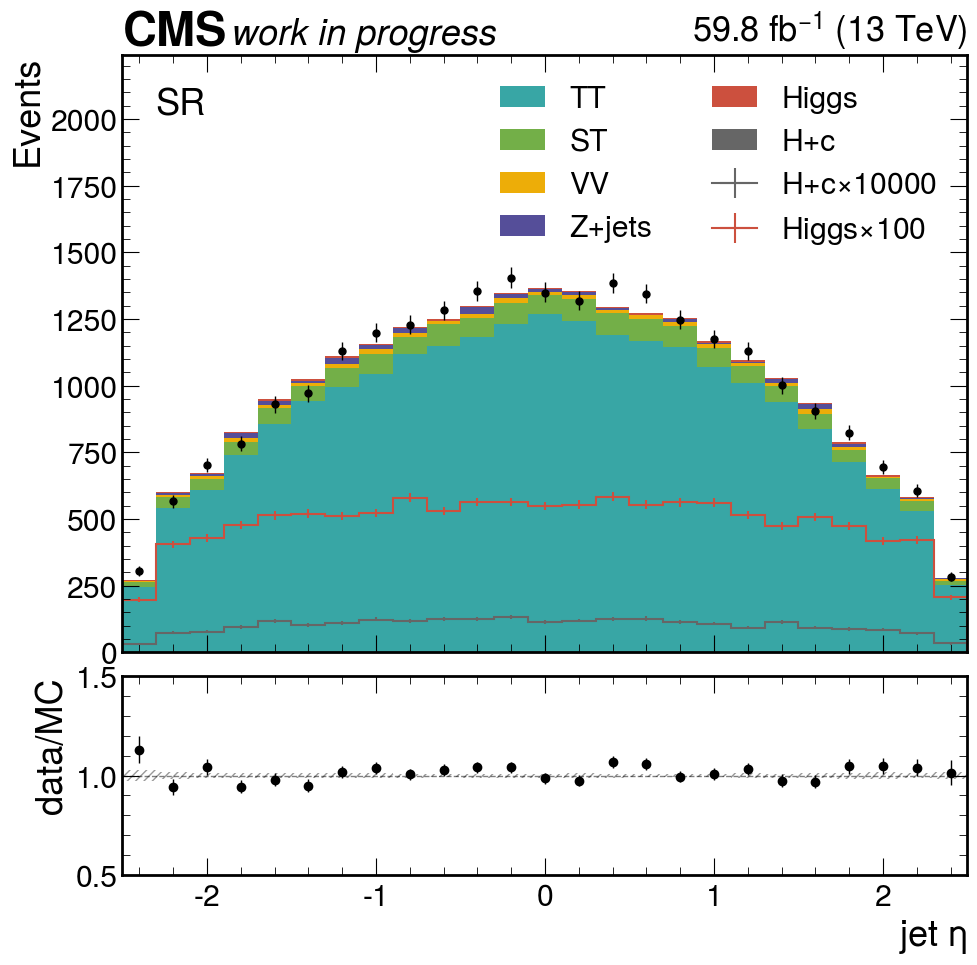

In [13]:
import uproot
plt.style.use(hep.style.ROOT)
fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
hep.cms.label(
        "work in progress",
        data=True,
        lumi=lumi/1000,
        com="13",
        loc=0,
        ax=ax,
    )

axes={'flav':sum,'lepflav':'emu','region':'SR2_LM'}#,"syst":"nominal"}
# var='jetflav_btagDeepFlavCvL'
var='jetflav_eta'
labels={}#"$p_T^\mu$"#"$\\ell_1 p_T$"#"$\\ell\\ell$ mass"#$m_T^{\\ell\\ell}$"
at = AnchoredText("SR",  frameon=False,loc=2)
fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#CC503E","hc":"#666666"}
name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}
for s in collated.keys():
    collated[s][var]=collated[s][var][axes]+collated[s][var][{'flav':sum,'lepflav':'emu','region':'SR_LM'}]
# #     print(type(collated[s][var][axes]))
#     collated[s][var]=rebin_hist(collated[s][var][axes],collated[s][var][axes].axes[0].name,1)
hep.histplot([collated[s][var]for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
hep.histplot(collated["data_obs"][var],histtype='errorbar',color='k',ax=ax,flow=None)
hep.histplot(collated["hc"][var]*10000,color=color_map["hc"],label="H+c$\\times$10000",ax=ax,flow=None)
hep.histplot(collated["higgs"][var]*100,color=color_map["higgs"],label="Higgs$\\times$100",ax=ax,flow=None)
ax.legend(ncols=2)
hmc=collated['ttbar'][var]

ax.add_artist(at)
for s in color_map.keys():
    if s == 'ttbar':continue
    hmc=hmc+collated[s][var]
plotratio(collated['data_obs'][var],hmc,ax=rax)

rax.set_ylim(0.5,1.5)
ax.set_ylim(bottom=0)
ax.set_xlabel(None)
rax.set_ylabel("data/MC")
ax.set_ylabel("Events")
hep.mpl_magic(ax=ax)
rax.set_xlabel("jet $\eta$")
# ax.set_xlim(10,100)
fig.savefig("2018_mu_eta_noscale.pdf")

False


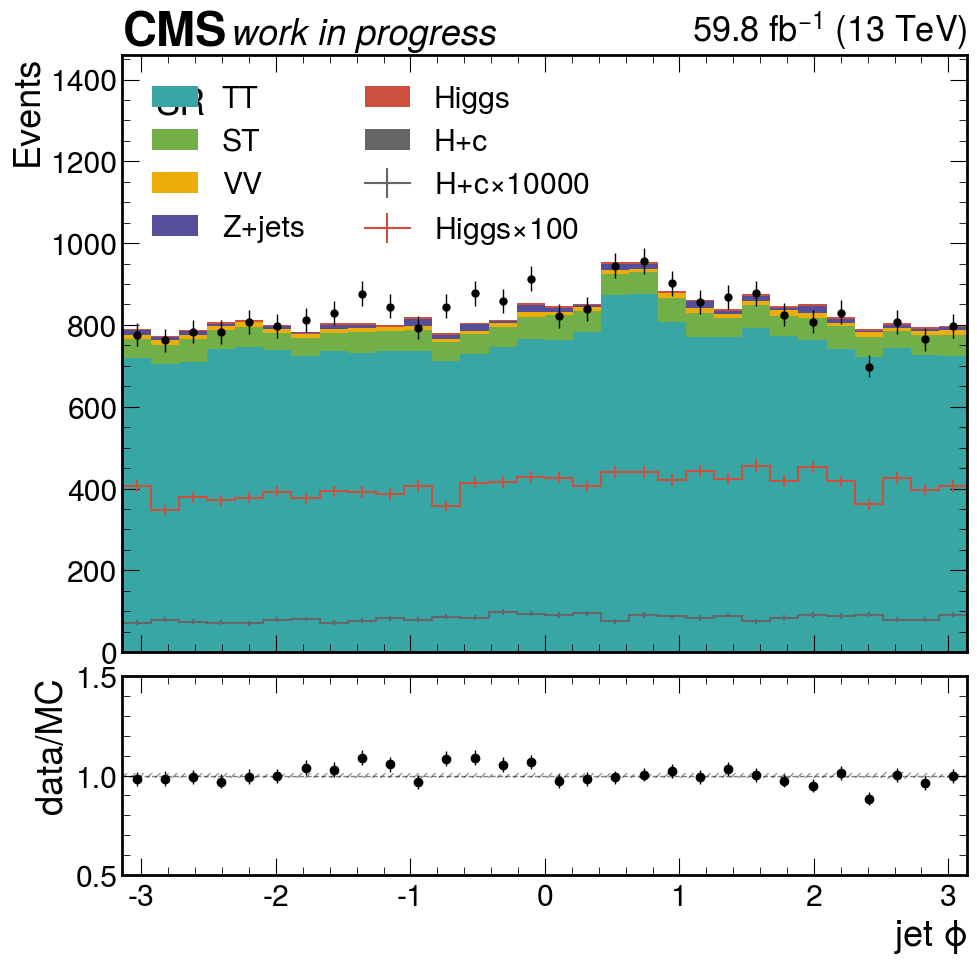

In [17]:
import uproot
plt.style.use(hep.style.ROOT)
fig, ((ax), (rax)) = plt.subplots(
                2, 1, gridspec_kw={"height_ratios": (3, 1)}, sharex=True
            )
hep.cms.label(
        "work in progress",
        data=True,
        lumi=lumi/1000,
        com="13",
        loc=0,
        ax=ax,
    )

axes={'flav':sum,'lepflav':'emu','region':'SR2_LM'}#,"syst":"nominal"}
# var='jetflav_btagDeepFlavCvL'
var='jetflav_phi'
labels={}#"$p_T^\mu$"#"$\\ell_1 p_T$"#"$\\ell\\ell$ mass"#$m_T^{\\ell\\ell}$"
at = AnchoredText("SR",  frameon=False,loc=2)
fig.subplots_adjust(hspace=0.06, top=0.92, bottom=0.1, right=0.97)
color_map={"ttbar":"#38A6A5","st":"#73AF48","vv":"#EDAD08","zjets":"#554e99","higgs":"#CC503E","hc":"#666666"}
name_map={'ttbar':"TT","st":"ST","zjets":"Z+jets","vv":'VV',"higgs":"Higgs","hc":"H+c"}
for s in collated.keys():
    collated[s][var]=collated[s][var][axes]+collated[s][var][{'flav':sum,'lepflav':'emu','region':'SR_LM'}]
# #     print(type(collated[s][var][axes]))
#     collated[s][var]=rebin_hist(collated[s][var][axes],collated[s][var][axes].axes[0].name,1)
hep.histplot([collated[s][var]for s in color_map.keys()] ,histtype='fill',color=[color_map[s] for s in color_map.keys()],label=[name_map[s] for s in color_map.keys()],stack=True,ax=ax,flow=None)
hep.histplot(collated["data_obs"][var],histtype='errorbar',color='k',ax=ax,flow=None)
hep.histplot(collated["hc"][var]*10000,color=color_map["hc"],label="H+c$\\times$10000",ax=ax,flow=None)
hep.histplot(collated["higgs"][var]*100,color=color_map["higgs"],label="Higgs$\\times$100",ax=ax,flow=None)
ax.legend(ncols=2)
hmc=collated['ttbar'][var]

ax.add_artist(at)
for s in color_map.keys():
    if s == 'ttbar':continue
    hmc=hmc+collated[s][var]
plotratio(collated['data_obs'][var],hmc,ax=rax)

rax.set_ylim(0.5,1.5)
ax.set_ylim(bottom=0)
ax.set_xlabel(None)
rax.set_ylabel("data/MC")
ax.set_ylabel("Events")
hep.mpl_magic(ax=ax)
rax.set_xlabel("jet $\phi$")
# ax.set_xlim(10,100)
fig.savefig("2018_mu_phi.pdf")